# GEOG5405 Urban Data Science Project

# Predicting the Success of Planning Applications in London

**STUDENT ID:** 201328288

**Contents**

**1. Introduction**
> 1.1. Overview </br>
> 1.2. Research questions </br>
> 1.3. Analysis plan </br>

**2. Data sources & description** </br>
> 2.1. Planning applications </br>
> 2.2. Locational data </br>
> 2.3. Geodemographic data </br>

**3. Data extraction & importation** </br>
> 3.1. Importing packages & modules<br>
>> 3.1.1. Disabling warnings </br>
>> 3.1.2. Importing packages </br>
>> 3.1.3. Setting defaults <br>


> 3.2. Planning applications <br>
> > 3.2.1. How does the scraping process work? <br>
>> 3.2.2. IDOX Solutions<br>
>> 3.2.3. Northgate<br>
>> 3.2.4. Council Direct<br>
>> 3.2.5. OcellaWeb<br>
>> 3.2.6. Agile Applications<br>
>> 3.2.7. Unique portals<br>
>> 3.2.8. Concatenating planning applications<br>

> 3.3. Locational data<br>
>> 3.3.1 2011 LSOA boundaries<br>
>> 3.3.2. 2011 LSOA to 2021 LSOA lookup<br>

> 3.4. Geodemographic data<br>
>> 3.4.1. Indices of Multiple Deprivation (IMD) of LSOA<br>
>> 3.4.2. Ethnic composition of LSOA<br>
>> 3.4.3. Housing tenure composition of LSOA<br>
>> 3.4.4. Median house sale price of LSOA<br>
>> 3.4.5. Mid-year population estimates of LSOA<br>

**4. Data wrangling**</br>
>4.1. Planning applications<br>
>>4.1.1. Basic wrangling<br>
>>4.1.2. Planning application topics<br>
>>>4.1.2.1. Latent Dirichlet Allocation (LDA)<br>
>>>4.1.2.2. BERTopic<br>

>>4.1.3. Planning application decisions<br>
>>4.1.4. Geocoding<br>

>4.2. Locational data<br>
>4.3. Geodemographic data<br>
>>4.3.1. Indices of Multiple Deprivation of LSOA<br>
>>4.3.2. Ethnic composition of LSOA<br>
>>4.3.3. Housing tenure composition of LSOA<br>
>>4.3.4. Median house sale price of LSOA<br>
>>4.3.5. Mid-year population estimates of LSOA<br>
>>4.3.6. Concatenating geodemographic data<br>

**5. Data analysis** </br>
>5.1. _Are planning applications spatially variable across London, and are they associated with area geodemographic characteristics?_<br>
>>5.1.1. Are planning applications spatially variable across London?<br>
>>5.1.2. Spatial clustering of planning applications<br>
>>5.1.3. Ordinary Least Squares (OLS)<br>
>>5.1.4. Geographically Weighted Regression (GWR)<br>

>5.2. _What are the types of planning application in London?_<br>
>>5.2.1. Planning authorities<br>
>>5.2.2. LSOA<br>

>5.3. _Do planning application success rates differ across London, and are they associated with area geodemographic characteristics?_<br>
>>5.3.1. Do planning application success rates differ across London?<br>
>>5.3.2. Spatial clustering of successful planning applications<br>
>>5.3.3. Ordinary Least Squares (OLS)<br>
>>5.3.4. Geographically Weighted Regression (GWR)<br>

>5.4. _What factors predict the success of planning applications?_<br>
>>5.4.1. Data preparation<br>
>>5.4.2. Comparison of model performance<br>
>>5.4.3. Random Forest<br>
>>5.4.4. Binary Logistic Regression<br>

**6. References**<br>

## 1. Introduction

### 1.1. Overview

In 2022, approximately 10% of the more than 270,000 planning applications submitted to planning authorities in England were rejected, frustrating homeowners, developers, and planners alike. Yet, the reasons behind such rejections are unclear. This is largely due to the siloed nature of the planning system, with 333 deciding authorities in England collecting, storing, and displaying planning applications in different manners, leading to opaqueness.

To combat urban challenges such as the provision of affordable housing and declining high streets, the factors behind successful planning applications must be understood. By doing so, applicants can optimise their applications for the best chance of approval or identify areas where there is a higher chance of approval, enabling greater development, and policy proposals can be developed.

As such, this project utilises data from London planning authorities to understand the factors that predict the success of a planning application. The below context map illustrates these planning authorities.

<img src = "London_Planning_Authorities.png" style = "width:600px;">

### 1.2. Research questions

**1.** Are planning applications spatially variable across London, and are they associated with area geodemographic characteristics?

**2.** What are the types of planning application in London?

**3.** Do planning application success rates differ across London, and are they associated with area geodemographic characteristics?

**4.** What factors predict the success of planning applications?

### 1.3. Analysis Plan

First, planning applications submitted to 33 of the 35 planning authorities in London between 01-01-2022 and 31-02-2022 will be scraped from the portal of the respective authority. For each application submitted this will yield the description/proposal, address, metadata, and decision of the planning application. Next, geodemographic data such as the Index of Multiple Deprivation score and the ethnic composition of each London LSOA will be sourced. 

Topic Modelling will be used to identify the types of planning applications submitted and cluster planning applications based on shared descriptions and decisions. To allow for spatial analysis, geocoding will return the coordinates of each planning application, and geodemographic data will be wrangled appropriately. 

To answer Research Question 1, the point distribution of planning applications across London will first be visualised. Next, the spatial density of applications in each LSOA will be calculated and used as the basis for examining whether there are spatial patterns amongst the number of planning applications in an LSOA. K-Nearest Neighbours will be used to identify patterns of spatial clustering, which will give an insight into whether neighbouring LSOA share similar numbers of planning applications. With this knowledge, the associations between the number of planning applications in an LSOA and the geodemographic characteristics of an LSOA can be assessed using Ordinary Least Squares (OLS) regression followed by Geographically Weighted Regression (GWR) to understand whether such associations are spatially variable. 

Research Question 2 aims to provide context to the planning system in London and uses the modelled application descriptions identified through Topic Modelling to visualise how the types of planning application vary at a high-level amongst planning authorities, and at a lower level between LSOA. 

Building on Research Question 1, Research Question 3 aims to understand whether the success rate of planning applications in London (i.e., the proportion of applications that were successful) varies between both planning authorities and LSOA. Again, the spatial patterns of the success rate are assessed using K-Nearest Neighbours. Associations between the success rate of applications in an LSOA and the geodemographic characteristics of an LSOA are assessed using OLS followed by GWR to identify whether such associations are spatially variable. This will help identify whether planning applications are more likely to be successful in some LSOA than others and will give insights as to the role of the planning system in meeting urban challenges.

Having ascertained whether the number and success of planning applications vary between LSOA, Research Question 4 aims to understand the factors that predict a successful application. To do so, the performance of five classification models will be evaluated using Stratified Cross Validation, and the optimal model will be used to identify the factors that are statistically most important to a successful planning application. From these insights, a Binary Logistic Regression model will be produced to calculate the impact that each factor has on the odds of a successful planning application. Descriptions of analysis results will be provided throughout, but detailed interpretations of the results are presented in the briefing. 

## 2. Data sources & description

### 2.1. Planning applications

Planning applications received between 01-01-2022 and 31-03-2022 were scraped from the planning portals of 33 of the 35 planning authorities in London. Only those submitted to Brent Borough Council and the London Legacy Development Corporation (LLDC) were not scraped, due to stringent anti-bot protections on the Brent portal and a lack of published decisions on the LLDC portal. For each application, the description/proposal, address, metadata/reference number, and outcome (if decided) were extracted. The table below details the planning portals used in this project.


| **Borough** | **Website provider** | **Link** |
|:--------:|:--------:|:--------:|
|  Barking & Dagenham | Council Direct | https://online-befirst.lbbd.gov.uk/planning/index.html?fa=getReceivedWeeklyList
|  Barnet   |  IDOX | https://publicaccess.barnet.gov.uk/online-applications/search.do?action=advanced
|  Bexley   |  IDOX   |https://pa.bexley.gov.uk/online-applications/search.do?action=advanced
|  Bromley   |  IDOX   | https://searchapplications.bromley.gov.uk/online-applications/search.do?action=advanced
|  Camden   |  Northgate   | https://planningrecords.camden.gov.uk/Northgate/PlanningExplorer17/GeneralSearch.aspx
|  City of London   |  IDOX    | https://www.planning2.cityoflondon.gov.uk/online-applications/search.do?action=advanced
|  Croydon   |  IDOX   | https://publicaccess3.croydon.gov.uk/online-applications/search.do?action=advanced
|  Ealing   |  IDOX   | https://pam.ealing.gov.uk/online-applications/search.do?action=advanced
|  Enfield   |  IDOX   | https://planningandbuildingcontrol.enfield.gov.uk/online-applications/search.do?action=advanced
|  Greenwich   |  IDOX   | https://planning.royalgreenwich.gov.uk/online-applications/search.do?action=advanced
|  Hackney   |  Council Direct   |https://developmentandhousing.hackney.gov.uk/planning/index.html?fa=getReceivedWeeklyList
|  Hammersmith & Fulham  |  IDOX   | https://public-access.lbhf.gov.uk/online-applications/search.do?action=advanced
|  Haringey   |  Unique   | https://publicregister.haringey.gov.uk/pr/s/register-view?c__r=Arcus_BE_Public_Register
|  Harrow   |  Unique   | https://planningsearch.harrow.gov.uk/planning/search-applications
|  Havering   |  OcellaWeb   | https://development.havering.gov.uk/OcellaWeb/planningSearch
|  Hillingdon   |  OcellaWeb   | https://planning.hillingdon.gov.uk/OcellaWeb/planningSearch
|  Hounslow   |  Unique   |  https://planning.hounslow.gov.uk/planning_search.aspx
|  Islington   |  Northgate   | https://planning.islington.gov.uk/northgate/planningexplorer/generalsearch.aspx
|  Kensington & Chelsea   |  Unique   |https://www.rbkc.gov.uk/planning/searches/default.aspx?adv=1#advancedSearch
|  Kingston upon Thames   |  IDOX   | https://publicaccess.kingston.gov.uk/online-applications/search.do?action=advanced
|  Lambeth   |  IDOX   | https://planning.lambeth.gov.uk/online-applications/search.do?action=advanced
|  Lewisham   |  IDOX   | https://planning.lewisham.gov.uk/online-applications/search.do?action=advanced
|  Merton   |  Northgate  | https://planning.merton.gov.uk/Northgate/PlanningExplorerAA/GeneralSearch.aspx
|  Newham   |  IDOX   | https://pa.newham.gov.uk/online-applications/search.do?action=advanced
|  Old Oak and Park Royal Development Corporation (OPDC)   |  Agile Applications   | https://planning.agileapplications.co.uk/opdc/search-applications/
|  Redbridge   |  Agile Applications   | https://planning.redbridge.gov.uk/redbridge/search-applications/
|  Richmond upon Thames   |  Unique   | https://www2.richmond.gov.uk/lbrplanning/Planning_Report.aspx
|  Southwark   |  IDOX   | https://planning.southwark.gov.uk/online-applications/search.do?action=advanced
|  Sutton   |  IDOX   | https://planningregister.sutton.gov.uk/online-applications/search.do?action=advanced
|  Tower Hamlets   |  IDOX   | https://development.towerhamlets.gov.uk/online-applications/search.do?action=advanced
|  Waltham Forest   |  Council Direct   |https://builtenvironment.walthamforest.gov.uk/planning/index.html?fa=getReceivedWeeklyList
|  Wandsworth   |  Northgate   | https://planning.wandsworth.gov.uk/Northgate/PlanningExplorer/GeneralSearch.aspx
|  Westminster   |  IDOX   | https://idoxpa.westminster.gov.uk/online-applications/search.do?action=advanced


### 2.2. Locational data

These datasets will be used to enable the spatial plotting and spatial analysis in this project.

**LSOA boundaries (2011)**

This is a shapefile of 2011 Lower Layer Super Output Area boundaries in England and Wales sourced from the Office for National Statistics (ONS). The LSOA area-level geography was chosen over that of an MSOA or Ward area-level geography because the smaller nature of LSOA allows for more granular analysis and thus insights.

In addition, much of the data in this project uses 2011 LSOA boundaries and so these were chosen over the more recent 2021 boundaries to minimise the risk of conversion errors. These polygon geometries will be used to answer Research Questions 1, 2, and 3.

Source: https://geoportal.statistics.gov.uk/datasets/3011969ff4e84966b2cbc3b642ae32de_0/explore

**2011-2021 LSOA lookup**

This is a CSV containing 2011 LSOA codes and 2021 LSOA codes sourced from the ONS. This will be used to convert data that uses 2021 LSOA boundaries to the respective 2011 LSOA boundaries, and will help answer Research Questions 1 and 4.

Source: https://geoportal.statistics.gov.uk/maps/lsoa-2011-to-lsoa-2021-to-local-authority-district-2022-lookup-for-england-and-wales-version-2-1

### 2.3. Geodemographic data

These datasets provide geodemographic information for each LSOA.

**Indices of Multiple Deprivation (IMD) of LSOA (2019)**

This is a CSV containing the overall Index of Multiple Deprivation score of each London LSOA for 2019, where one row represents an LSOA. This data is sourced from the London Data Store and is based on the 2019 English Indices of Multiple Deprivation survey. The survey is conducted on a 5 year cycle, meaning that this iteration is the most recent. As such, an assumption is made that overall deprivation has remained stable from 2019 until 2022.

This data will be used to assess whether deprivation is associated with the number and success of planning applications in LSOA in London, contributing to Research Questions 1, 3, and 4.

Source: https://data.london.gov.uk/dataset/indices-of-deprivation

**Ethnic composition of LSOA (2021)**

This is an Excel file containing information on the ethnic composition of each LSOA in England and Wales in 2021. The data is based on the 2021 Census and published by the ONS but sourced from Nomis.

It comprises 20 categories of ethnicity, and provides a count of the number of Census respondents in an LSOA that self-identify as one of the ethnic categories. Each LSOA is represented by 20 rows- one for each ethnicity category. This data is the most recent data available, and will be used to assess whether the ethnic composition of an LSOA is associated with the number and success of planning applications in an LSOA, contributing to Research Questions 1, 3, and 4.

Source: https://www.nomisweb.co.uk/census/2021/bulk

**Housing tenure composition of LSOA (2021)**

This is a CSV containing information on the number of dwellings in UK LSOA broken down by tenure type, property type, and the number of people per room in the household. There are 5 categories of tenure type, 5 categories of property type, and 5 categories of the number of people per room in the household, meaning that each LSOA is represented by 125 rows.

The data is sourced from the UK Data Service and based on information given in the 2021 Census. It is the most recent data available, and will be used to assess whether the composition of housing tenure type in an LSOA is associated with the number and success of planning applications in an LSOA, and will be used to answer Research Questions 1, 3, and 4.

Source: https://statistics.ukdataservice.ac.uk/dataset/england-and-wales-census-2021-rm139-tenure-by-people-per-room-in-household-by-accommodation-type/resource/e76e486a-aaa6-49dd-876b-188b454a5f6c

**Median house sale price of LSOA (2022)**

This is an Excel file containing, for each year between 1995-2022, the quarterly median sale price of houses in each English and Welsh LSOA. For this project, median house price sales for the year ending March 2022 will be used. Each LSOA is represented by one row. The data is sourced from the ONS and will be used to understand whether the median house sale price in an LSOA is associated with the number and success of planning applications in an LSOA, contributing to Research Questions 1, 3, and 4.

Source: https://www.ons.gov.uk/peoplepopulationandcommunity/housing/datasets/medianpricepaidbylowerlayersuperoutputareahpssadataset46

**Mid-year population estimates of LSOA (2020)**

This is an Excel file containing the most recent population estimate of each English and Welsh LSOA, broken down by gender and age. Each LSOA is represented by one row. The data is sourced from the ONS and will be used to produce a success rate metric of planning applications in an LSOA, contributing to Research Question 3.

Source: https://www.ons.gov.uk/peoplepopulationandcommunity/populationandmigration/populationestimates/datasets/lowersuperoutputareamidyearpopulationestimates



## 3. Data extraction & importation

### 3.1. Importing packages & modules

**NOTE:** If this notebook is being run using the .yml environment file supplied, please ensure that numpy 1.23.5 is installed before running the notebook. This is because the _numba_ package installs numpy 1.25 as a dependency, but the _bertopic_ and _umap_ packages require numpy 1.23.5 for correct operation, meaning a conflict may occur. This can be checked below:

In [1]:
import numpy
import numpy as np

print(numpy.__version__)
print(np.__version__)

1.23.5
1.23.5


If the versions are not correct, once the environment has been initialised and all packages installed, run in the command line:

In [2]:
%%script echo ** Run these commands in the command line if neccessary **

pip uninstall numpy
pip install numpy==1.23.5

** Run these commands in the command line if neccessary **


#### 3.1.1. Disabling warnings

In [3]:
# Disabling warnings
import numba
import warnings
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning
warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=NumbaPendingDeprecationWarning)

#### 3.1.2. Importing packages

In [4]:
# Core libraries
import os
import sys
import re # Regular expression
import xlrd # Opening 'XLS' files
import uuid # Creating unique row ID
import string # String operations
import random # Creating random variables
import openpyxl # Opening 'XLSX' files
import pandas as pd # Data manipulation and analysis
import geopandas as gpd # Geographic data manipulation and analysis
from os.path import dirname # Retrieve file path
from pathlib import Path # Retrieve file path
from datetime import datetime, date, timedelta # Date operations

# Web scraping
import time 
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.support.ui import Select
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from selenium.common.exceptions import TimeoutException
from selenium.webdriver.support.ui import WebDriverWait
from webdriver_manager.chrome import ChromeDriverManager
from selenium.common.exceptions import NoSuchElementException
from selenium.webdriver.support import expected_conditions as EC
from selenium.common.exceptions import ElementNotInteractableException

# Visualisations
import seaborn as sns
import colorcet as cc
import contextily as cx
import matplotlib.pyplot as plt
import mpl_toolkits
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar
from geemap import cartoee
from wordcloud import WordCloud

# Interactive plotting
import plotly.express as px
import plotly.io as pio
from IPython.display import HTML

# Geocoding
import googlemaps

# Topic modelling
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.corpus import wordnet as wn
from nltk.tokenize import word_tokenize

# Latent Dirichlet Allocation (LDA) topic modelling
import gensim
from pprint import pprint
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from nltk.stem.wordnet import WordNetLemmatizer

# BERTopic topic modelling
from umap import UMAP
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

# Spatial clustering
import math
import pysal
import libpysal
from pysal.viz import splot
from libpysal import weights
from pysal.explore import esda
from pysal.viz import mapclassify
import sklearn.metrics as metrics
from sklearn.cluster import KMeans
from splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation

# Geographically Weighted Regression
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW

# Statistical analysis
import sklearn
import scipy.stats
import sklearn.metrics
import scipy.stats as stats
import scikit_posthocs as sp
import statsmodels.api as sma
from scipy.stats import zscore
from scipy.stats import shapiro
from scipy.stats import wilcoxon
import statsmodels.formula.api as smf

# Feature engineering
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.utils.multiclass import type_of_target
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import train_test_split

# Machine learning
from sklearn import svm
import statsmodels.api as sm
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/Callum/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


#### 3.1.1. Setting defaults

In [5]:
pio.renderers.default = 'notebook' # Sets the rendering of plotly interactive visualisations
pio.templates.default = "plotly_white" # Sets the theme of plotly interactive visualisations
pd.options.mode.chained_assignment = None # Disabling 'SettingWithCopy' warning
pd.set_option('display.max_columns', None) # Prevents the truncation of dataframe columns, aiding readability
os.environ["TOKENIZERS_PARALLELISM"] = "false" # Disables parallelism warning when using BERTopic library
os.environ['KMP_DUPLICATE_LIB_OK'] = "True" # Disables warning when using SVM

### 3.2. Planning applications

Planning applications submitted to 33 of the 35 planning authorities in London between 01-01-2022 and 31-03-2022 were scraped from their respective websites. These authorities are presented in Section 2.1.

#### 3.2.1. How does the scraping process work?

Broadly, Selenium is used to access the URL of a planning authority portal and, for a given date range, search the portal to return the applications submitted in the date range. The individual webpage of each application is then accessed, and relevant data (description, address, metadata, and decision) is extracted. This process continues until all applications on the portal in the given date range have been scraped.

More specifically, a list of days in a given date range is iterated through and, for each date, _i_, in the range,  _i_ is inputted as the start date of the search and _i_+1 as the end date of the search. A page of applications is returned and, for each application in this range, the application link is clicked and relevant data (description, address, metadata, and decision) is extracted into separate lists. Once complete, the previous page containing the list of applications is returned to, and the next application is clicked and extracted. This process repeats until the final date in the date range (where _i_+1 > len(date_range)), after which it terminates and combines all lists into a dictionary, converts this dictionary to a dataframe, drops any duplicate metadata (application references), and saves the output to a CSV. Each CSV is then re-imported to prevent having to run the process again.

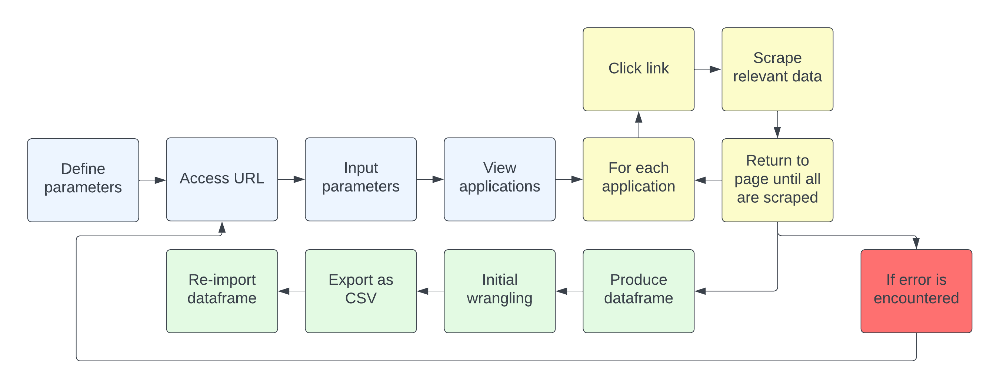

Of the 33 planning authority portals scraped, many share similar back-end infrastructure. For instance, the Wandsworth, Merton, Islington, and Camden planning authority portals are all developed by Northgate. Similarly, the planning portals of 17 of the 33 planning authorities are all developed by IDOX Solutions. This means that the same code can be used to scrape portals of the same provider. In cases where the infrastructure of a planning portal is unique to the authority, such as Harrow, these portals were scraped individually.

**NOTE:** Each iteration of the scraping process takes approximately 1 hour. In some cases, such as when scraping the Westminster portal, the code may run for over 5 hours, depending on network conditions. For this reason, each code block is set to run an example process, only scraping applications between 10-02-2022 and 11-02-2022, and is currently disabled. To enable the block and run the example code, remove the '%%script echo' tag.


#### 3.2.2. IDOX Solutions

IDOX Solutions provides the portals for 17 of the 33 planning authorities in London, allowing all to be scraped using the same code. However, scraping all 17 portals concurrently increases the risk of errors and timeouts and is computationally intensive. To mitigate this, each website was scraped individually for each month in the time period. In the case of Westminster, for example, the first iteration scraped applications between 01-01-2022 and 31-01-2022,  the second iteration between 01-02-2022 and 28-02-2022, and the third iteration between 01-03-2022 and 31-03-2022. This batch approach was repeated for all 17 planning portals that use the IDOX Solutions infrastructure.

IDOX portals have the most stringent anti-bot protections of the 33 planning authority portals and so require a slow and persistent approach to work around the protections. IDOX portals also return an error if there are too many applications returned for a given date range, and so each month was scraped individually. Below, the iterative date range to be scraped is defined. As noted above, this is an example that would scrape applications received between 10-02-2022 and 11-02-2022 by the City of London planning authority.

In [6]:
# Function to calculate the dates in the given range according to the step interval chosen (1 in this example)
def date_range(start_date, end_date):
    for d in range(0, int((end_date - start_date).days) + 1, 1): # Modify the step interval
        yield start_date + timedelta(d)

date_idox = []

# Defining the date range
start_date = date(2022, 2, 10)
end_date = date(2022, 2, 11)

# Applying the function and appending the resulting dates to a list
for dt in date_range(start_date, end_date):
    dt = dt.strftime('%d/%m/%Y')
    date_idox.append(dt)

print(date_idox)

['10/02/2022', '11/02/2022']


In [7]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run ** # Remove to enable running

description_text = []
address_text = []
meta_text = []
decision_text = []
link_numbers = []

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver and setting a default wait time of 10 seconds for an element to become clickable
driver = webdriver.Chrome()
wait = WebDriverWait(driver, 10)

# Enter relevant url
url = 'https://www.planning2.cityoflondon.gov.uk/online-applications/search.do?action=advanced'

for i in range(len(date_idox)):
    while (i + 1) < len(date_idox):
        driver.get(url) # Starting the Chromedriver and getting the URL
        print(f"""
-------------------------------------
Getting url: {url} for date range: {i}""")
        time.sleep(20) # Once URL has been reached, wait 20 seconds

        # Inputting start and end dates into their respective fields
        try:
            start_input = driver.find_element(By.XPATH, '//input[@id="applicationReceivedStart"]')
            start_input.send_keys(date_idox[i])

            end_input = driver.find_element(By.XPATH, '//input[@id="applicationReceivedEnd"]')
            end_input.send_keys(date_idox[i + 1])
        except:
            start_input = driver.find_element(By.XPATH, '//input[@id="applicationValidatedStart"]')
            start_input.send_keys(date_idox[i])

            end_input = driver.find_element(By.XPATH, '//input[@id="applicationValidatedEnd"]')
            end_input.send_keys(date_idox[i + 1])

        # Wait until the 'Search' button is clickable, then click it and wait for 5 seconds
        try:
            wait.until(EC.element_to_be_clickable((By.XPATH, '//input[@class="button primary recaptcha-submit"]')))
            search_button = driver.find_element(By.XPATH, '//input[@class="button primary recaptcha-submit"]')
            search_button.click()
        except:
            wait.until(EC.element_to_be_clickable((By.XPATH, '//input[@value="Search"]')))
            search_button = driver.find_element(By.XPATH, '//input[@value="Search"]')
            search_button.click()
            time.sleep(5)

        # If multiple applications are returned:
        if driver.find_elements(By.XPATH, '//*[@id="resultsPerPage"]'):

            # Click the 'Results per page' dropdown and choose to display 100 results
            dropdown_results_pp = Select(driver.find_element(By.XPATH, '//*[@id="resultsPerPage"]'))
            dropdown_results_pp.select_by_visible_text('100')

            # Wait until the 'Go' button is clickable, then click it to display 100 results and wait 5 seconds
            wait.until(EC.element_to_be_clickable((By.XPATH, '//input[@type="submit"]')))
            go_button = driver.find_element(By.XPATH, '//input[@type="submit"]')
            go_button.click()
            time.sleep(5)

            # Find all <a> elements (links) on the page
            page_links = driver.find_elements(By.XPATH, '//ul[@id="searchresults"]//a')

            # Creating a variable of the number of links present on the page
            no_page_links = len(page_links)

            # Iterating through the links on the page
            try:
                for link in range(no_page_links):

                    # Storing the current link number for use in dealing with errors
                    link_numbers.append(link)
                    print(f"Link {link+1} of {no_page_links}")

                    # Wait until the link is clickable, then click it and wait 10 seconds for page loading
                    wait.until(EC.element_to_be_clickable((By.XPATH,'//ul[@id="searchresults"]//a')))
                    link = driver.find_elements(By.XPATH, '//ul[@id="searchresults"]//a')[link]
                    link.click()
                    time.sleep(10)

                    # Identify all <th> elements (row names) on the page
                    th_text = []
                    ths = driver.find_elements(By.XPATH, '//tbody//tr/th')  # Finding all 'th' elements
                    th_text.append([th.text for th in ths])  # Converting all 'th' elements to their text string
                    th_text = [item for sublist in th_text for item in sublist]  # Flattening the list

                    # Identifying the position of each relevant <th> element in the list
                    meta_index = int(th_text.index("Reference"))
                    add_index = int(th_text.index("Address"))
                    prop_index = int(th_text.index("Proposal"))

                    # Using the positions of the <th> elements to access the relevant
                    # <td> elements on the page
                    desc = driver.find_elements(By.XPATH, (f'//tbody//tr[{prop_index + 1}]//td'))
                    address = driver.find_elements(By.XPATH, (f'//tbody//tr[{add_index + 1}]//td'))
                    meta = driver.find_elements(By.XPATH, (f'//tbody//tr[{meta_index + 1}]//td'))

                    # Extracting the text of each relevant <td> element
                    description_text.append([d.get_attribute("innerHTML").strip() for d in desc])
                    address_text.append([a.text for a in address])
                    meta_text.append([m.text for m in meta])

                    # If a 'Decision' row is on the page:
                    if driver.find_elements(By.XPATH, '//th[contains(text(), "Decision")]'):
                        try:
                            # Identify the position of the 'Decision' <th> element
                            deci_index = int(th_text.index("Decision"))
                            # Use this position to find the corresponding <td> element
                            decision = driver.find_elements(By.XPATH, (f'//tbody//tr[{deci_index + 1}]//td'))
                            # Extracting the text of the 'Decision' <td> element
                            decision_text.append([ds.text for ds in decision])
                        except:
                            # If no 'Decision' is found:
                            print('No decision made')
                            decision_text.append(['No decision made'])

                    # Once complete, wait for the 'Back to search results' button to become clickable,
                    # then click it and wait 30 seconds
                    wait.until(EC.element_to_be_clickable((By.XPATH, '//div[@id="applicationTools"]//a[@id="searchresultsback"]')))
                    back_to_search_btn = driver.find_element(By.XPATH, '//div[@id="applicationTools"]//a[@id="searchresultsback"]')
                    back_to_search_btn.click()
                    time.sleep(30)

                break # Move on to the next date range if the above is successfully completed

            # If a NoSuchElementException arises (this usually occurs when the page is slow to load), attempt
            # to repeat the entire above process:
            except NoSuchElementException:
                print('TimeOut- trying again')
                driver.get(url) # Starting the Chromedriver and getting the URL
                time.sleep(20) # Once URL has been reached, wait 20 seconds

                # Inputting start and end dates into their respective fields
                try:
                    start_input = driver.find_element(By.XPATH, '//input[@id="applicationReceivedStart"]')
                    start_input.send_keys(date_idox[i])

                    end_input = driver.find_element(By.XPATH, '//input[@id="applicationReceivedEnd"]')
                    end_input.send_keys(date_idox[i + 1])
                except:
                    start_input = driver.find_element(By.XPATH, '//input[@id="applicationValidatedStart"]')
                    start_input.send_keys(date_idox[i])

                    end_input = driver.find_element(By.XPATH, '//input[@id="applicationValidatedEnd"]')
                    end_input.send_keys(date_idox[i + 1])

                # Wait until the 'Search' button is clickable, then click it and wait for 5 seconds
                try:
                    wait.until(EC.element_to_be_clickable(
                        (By.XPATH, '//input[@class="button primary recaptcha-submit"]')))
                    search_button = driver.find_element(By.XPATH,
                                                        '//input[@class="button primary recaptcha-submit"]')
                    search_button.click()
                except:
                    wait.until(EC.element_to_be_clickable((By.XPATH, '//input[@value="Search"]')))
                    search_button = driver.find_element(By.XPATH, '//input[@value="Search"]')
                    search_button.click()
                    time.sleep(5)

                # If multiple applications are returned:
                if driver.find_elements(By.XPATH, '//*[@id="resultsPerPage"]'):

                    # Click the 'Results per page' dropdown and choose to display 100 results
                    dropdown_results_pp = Select(driver.find_element(By.XPATH, '//*[@id="resultsPerPage"]'))
                    dropdown_results_pp.select_by_visible_text('100')

                    # Wait until the 'Go' button is clickable, then click it to display 100 results and wait 5 seconds
                    wait.until(EC.element_to_be_clickable((By.XPATH, '//input[@type="submit"]')))
                    go_button = driver.find_element(By.XPATH, '//input[@type="submit"]')
                    time.sleep(10)
                    go_button.click()
                    time.sleep(10)

                    # Iterating through the links on the page
                    try:
                        # Identifying the last link clicked before the website crash
                        for relevant_link in range(link_numbers[-1], no_page_links):
                            link_numbers.append(relevant_link)
                            print(f'Relevant link number: {relevant_link+1}')

                            # Waiting until links on the page are clickable
                            wait.until(EC.element_to_be_clickable((By.XPATH, '//ul[@id="searchresults"]//a')))

                            # Clicking on the link that was clicked before the crash and waiting 10 seconds
                            link = driver.find_elements(By.XPATH, '//ul[@id="searchresults"]//a')[relevant_link]
                            link.click()
                            time.sleep(10)

                            # Identify all <th> elements (row names) on the page
                            th_text = []
                            ths = driver.find_elements(By.XPATH, '//tbody//tr/th')  # Finding all 'th' elements
                            th_text.append([th.text for th in ths])  # Converting all 'th' elements to their text string
                            th_text = [item for sublist in th_text for item in sublist]  # Flattening the list

                            # Identifying the position of each relevant <th> element in the list
                            meta_index = int(th_text.index("Reference"))
                            add_index = int(th_text.index("Address"))
                            prop_index = int(th_text.index("Proposal"))

                            # Using the positions of the <th> elements to access the relevant
                            # <td> elements on the page
                            desc = driver.find_elements(By.XPATH, (f'//tbody//tr[{prop_index + 1}]//td'))
                            address = driver.find_elements(By.XPATH, (f'//tbody//tr[{add_index + 1}]//td'))
                            meta = driver.find_elements(By.XPATH, (f'//tbody//tr[{meta_index + 1}]//td'))

                            # Extracting the text of each relevant <td> element
                            description_text.append([d.get_attribute("innerHTML").strip() for d in desc])
                            address_text.append([a.text for a in address])
                            meta_text.append([m.text for m in meta])

                            # If a 'Decision' row is on the page:
                            if driver.find_elements(By.XPATH, '//th[contains(text(), "Decision")]'):
                                try:
                                    # Identify the position of the 'Decision' <th> element
                                    deci_index = int(th_text.index("Decision"))
                                    # Use this position to find the corresponding <td> element
                                    decision = driver.find_elements(By.XPATH,(f'//tbody//tr[{deci_index + 1}]//td'))
                                    # Extracting the text of the 'Decision' <td> element
                                    decision_text.append([ds.text for ds in decision])
                                except:
                                    # If no 'Decision' is found:
                                    decision_text.append(['No decision made'])

                            # Once complete, wait for the 'Back to search results' button to become clickable,
                            # then click it and wait 30 seconds
                            wait.until(EC.element_to_be_clickable((By.XPATH, '//div[@id="applicationTools"]//a[@id="searchresultsback"]')))
                            back_to_search_btn = driver.find_element(By.XPATH, '//div[@id="applicationTools"]//a[@id="searchresultsback"]')
                            back_to_search_btn.click()
                            time.sleep(30)

                        break # Move on to the next date range if the above is successfully completed

                    except: # If this has not worked, return to the beginning of the whole code block
                        print('Website completely crashed- starting from the beginning')

                # If there is only one application on the page:
                elif driver.find_elements(By.XPATH, '//table[@id="simpleDetailsTable"]'):
                    print('Only one result found')

                    # Identify all <th> elements (row names) on the page
                    th_text = []
                    ths = driver.find_elements(By.XPATH, '//tbody//tr/th')  # Finding all 'th' elements
                    th_text.append([th.text for th in ths])  # Converting all 'th' elements to their text string
                    th_text = [item for sublist in th_text for item in sublist]  # Flattening the list

                    # Identifying the position of each relevant <th> element in the list
                    meta_index = int(th_text.index("Reference"))
                    add_index = int(th_text.index("Address"))
                    prop_index = int(th_text.index("Proposal"))

                    # Using the positions of the <th> elements to access the relevant
                    # <td> elements on the page
                    desc = driver.find_elements(By.XPATH, (f'//tbody//tr[{prop_index + 1}]//td'))
                    address = driver.find_elements(By.XPATH, (f'//tbody//tr[{add_index + 1}]//td'))
                    meta = driver.find_elements(By.XPATH, (f'//tbody//tr[{meta_index + 1}]//td'))

                    # Extracting the text of each relevant <td> element
                    description_text.append([d.get_attribute("innerHTML").strip() for d in desc])
                    address_text.append([a.text for a in address])
                    meta_text.append([m.text for m in meta])

                    # If a 'Decision' row is on the page:
                    if driver.find_elements(By.XPATH, '//th[contains(text(), "Decision")]'):
                        try:
                            # Identify the position of the 'Decision' <th> element
                            deci_index = int(th_text.index("Decision"))
                            # Use this position to find the corresponding <td> element
                            decision = driver.find_elements(By.XPATH, (f'//tbody//tr[{deci_index + 1}]//td'))
                            # Extracting the text of the 'Decision' <td> element
                            decision_text.append([ds.text for ds in decision])
                        except:
                            # If no 'Decision' is found:
                            decision_text.append(['No decision made'])
                    break # Move on to the next date range if the above is successfully completed

                # If there are no applications on the page:
                elif driver.find_element(By.XPATH, '//div[@class="messagebox"]'):
                    print('No results for this date range')
                    break # Move on to the next date range
                else:
                    break

            # If there are any other errors, repeat the above process
            except:
                print('Website crashed- trying to carry on')
                driver.get(url) # Starting the Chromedriver and getting the URL
                time.sleep(20) # Once URL has been reached, wait 20 seconds

                # Inputting start and end dates into their respective fields
                try:
                    start_input = driver.find_element(By.XPATH, '//input[@id="applicationReceivedStart"]')
                    start_input.send_keys(date_idox[i])

                    end_input = driver.find_element(By.XPATH, '//input[@id="applicationReceivedEnd"]')
                    end_input.send_keys(date_idox[i + 1])
                except:
                    start_input = driver.find_element(By.XPATH, '//input[@id="applicationValidatedStart"]')
                    start_input.send_keys(date_idox[i])

                    end_input = driver.find_element(By.XPATH, '//input[@id="applicationValidatedEnd"]')
                    end_input.send_keys(date_idox[i + 1])

                # Wait until the 'Search' button is clickable, then click it and wait for 5 seconds
                try:
                    wait.until(EC.element_to_be_clickable(
                        (By.XPATH, '//input[@class="button primary recaptcha-submit"]')))
                    search_button = driver.find_element(By.XPATH,
                                                        '//input[@class="button primary recaptcha-submit"]')
                    search_button.click()
                except:
                    wait.until(EC.element_to_be_clickable((By.XPATH, '//input[@value="Search"]')))
                    search_button = driver.find_element(By.XPATH, '//input[@value="Search"]')
                    search_button.click()
                    time.sleep(5)

                # If multiple applications are returned:
                if driver.find_elements(By.XPATH, '//*[@id="resultsPerPage"]'):

                    # Click the 'Results per page' dropdown and choose to display 100 results
                    dropdown_results_pp = Select(driver.find_element(By.XPATH, '//*[@id="resultsPerPage"]'))
                    dropdown_results_pp.select_by_visible_text('100')

                    # Wait until the 'Go' button is clickable, then click it to display 100 results and wait 5 seconds
                    wait.until(EC.element_to_be_clickable((By.XPATH, '//input[@type="submit"]')))
                    go_button = driver.find_element(By.XPATH, '//input[@type="submit"]')
                    time.sleep(10)
                    go_button.click()
                    time.sleep(10)

                    # Iterating through the links on the page
                    try:
                        # Identifying the last link clicked before the website crash
                        for relevant_link in range(link_numbers[-1], no_page_links):
                            link_numbers.append(relevant_link)
                            print(f'Relevant link number: {relevant_link+1}')

                            # Waiting until links on the page are clickable
                            wait.until(EC.element_to_be_clickable((By.XPATH, '//ul[@id="searchresults"]//a')))

                            # Clicking on the link that was clicked before the crash and waiting 10 seconds
                            link = driver.find_elements(By.XPATH, '//ul[@id="searchresults"]//a')[relevant_link]
                            link.click()
                            time.sleep(10)

                            # Identify all <th> elements (row names) on the page
                            th_text = []
                            ths = driver.find_elements(By.XPATH, '//tbody//tr/th')  # Finding all 'th' elements
                            th_text.append([th.text for th in ths])  # Converting all 'th' elements to their text string
                            th_text = [item for sublist in th_text for item in sublist]  # Flattening the list

                            # Identifying the position of each relevant <th> element in the list
                            meta_index = int(th_text.index("Reference"))
                            add_index = int(th_text.index("Address"))
                            prop_index = int(th_text.index("Proposal"))

                            # Using the positions of the <th> elements to access the relevant
                            # <td> elements on the page
                            desc = driver.find_elements(By.XPATH, (f'//tbody//tr[{prop_index + 1}]//td'))
                            address = driver.find_elements(By.XPATH, (f'//tbody//tr[{add_index + 1}]//td'))
                            meta = driver.find_elements(By.XPATH, (f'//tbody//tr[{meta_index + 1}]//td'))

                            # Extracting the text of each relevant <td> element
                            description_text.append([d.get_attribute("innerHTML").strip() for d in desc])
                            address_text.append([a.text for a in address])
                            meta_text.append([m.text for m in meta])

                            # If a 'Decision' row is on the page:
                            if driver.find_elements(By.XPATH, '//th[contains(text(), "Decision")]'):
                                try:
                                    # Identify the position of the 'Decision' <th> element
                                    deci_index = int(th_text.index("Decision"))
                                    # Use this position to find the corresponding <td> element
                                    decision = driver.find_elements(By.XPATH,(f'//tbody//tr[{deci_index + 1}]//td'))
                                    # Extracting the text of the 'Decision' <td> element
                                    decision_text.append([ds.text for ds in decision])
                                except:
                                    # If no 'Decision' is found:
                                    decision_text.append(['No decision made'])

                            # Once complete, wait for the 'Back to search results' button to become clickable,
                            # then click it and wait 30 seconds
                            wait.until(EC.element_to_be_clickable((By.XPATH, '//div[@id="applicationTools"]//a[@id="searchresultsback"]')))
                            back_to_search_btn = driver.find_element(By.XPATH, '//div[@id="applicationTools"]//a[@id="searchresultsback"]')
                            back_to_search_btn.click()
                            time.sleep(30)

                        break # Move on to the next date range if the above is successfully completed

                    except: # If this has not worked, return to the beginning of the whole code block
                        print('Website completely crashed- starting from the beginning')

                # If there is only one application on the page:
                elif driver.find_elements(By.XPATH, '//table[@id="simpleDetailsTable"]'):
                    print('Only one result found')

                    # Identify all <th> elements (row names) on the page
                    th_text = []
                    ths = driver.find_elements(By.XPATH, '//tbody//tr/th')  # Finding all 'th' elements
                    th_text.append([th.text for th in ths])  # Converting all 'th' elements to their text string
                    th_text = [item for sublist in th_text for item in sublist]  # Flattening the list

                    # Identifying the position of each relevant <th> element in the list
                    meta_index = int(th_text.index("Reference"))
                    add_index = int(th_text.index("Address"))
                    prop_index = int(th_text.index("Proposal"))

                    # Using the positions of the <th> elements to access the relevant
                    # <td> elements on the page
                    desc = driver.find_elements(By.XPATH, (f'//tbody//tr[{prop_index + 1}]//td'))
                    address = driver.find_elements(By.XPATH, (f'//tbody//tr[{add_index + 1}]//td'))
                    meta = driver.find_elements(By.XPATH, (f'//tbody//tr[{meta_index + 1}]//td'))

                    # Extracting the text of each relevant <td> element
                    description_text.append([d.get_attribute("innerHTML").strip() for d in desc])
                    address_text.append([a.text for a in address])
                    meta_text.append([m.text for m in meta])

                    # If a 'Decision' row is on the page:
                    if driver.find_elements(By.XPATH, '//th[contains(text(), "Decision")]'):
                        try:
                            # Identify the position of the 'Decision' <th> element
                            deci_index = int(th_text.index("Decision"))
                            # Use this position to find the corresponding <td> element
                            decision = driver.find_elements(By.XPATH, (f'//tbody//tr[{deci_index + 1}]//td'))
                            # Extracting the text of the 'Decision' <td> element
                            decision_text.append([ds.text for ds in decision])
                        except:
                            # If no 'Decision' is found:
                            decision_text.append(['No decision made'])
                    break # Move on to the next date range if the above is successfully completed

                # If there are no applications on the page:
                elif driver.find_element(By.XPATH, '//div[@class="messagebox"]'):
                    print('No results for this date range')
                    break # Move on to the next date range
                else:
                    break

        # If there is only one application on the page:
        elif driver.find_elements(By.XPATH, '//table[@id="simpleDetailsTable"]'):
            print('Only one result found')

            # Identify all <th> elements (row names) on the page
            th_text = []
            ths = driver.find_elements(By.XPATH, '//tbody//tr/th')  # Finding all 'th' elements
            th_text.append([th.text for th in ths])  # Converting all 'th' elements to their text string
            th_text = [item for sublist in th_text for item in sublist]  # Flattening the list

            # Identifying the position of each relevant <th> element in the list
            meta_index = int(th_text.index("Reference"))
            add_index = int(th_text.index("Address"))
            prop_index = int(th_text.index("Proposal"))

            # Using the positions of the <th> elements to access the relevant
            # <td> elements on the page
            desc = driver.find_elements(By.XPATH, (f'//tbody//tr[{prop_index + 1}]//td'))
            address = driver.find_elements(By.XPATH, (f'//tbody//tr[{add_index + 1}]//td'))
            meta = driver.find_elements(By.XPATH, (f'//tbody//tr[{meta_index + 1}]//td'))

            # Extracting the text of each relevant <td> element
            description_text.append([d.get_attribute("innerHTML").strip() for d in desc])
            address_text.append([a.text for a in address])
            meta_text.append([m.text for m in meta])

            # If a 'Decision' row is on the page:
            if driver.find_elements(By.XPATH, '//th[contains(text(), "Decision")]'):
                try:
                    # Identify the position of the 'Decision' <th> element
                    deci_index = int(th_text.index("Decision"))
                    # Use this position to find the corresponding <td> element
                    decision = driver.find_elements(By.XPATH, (f'//tbody//tr[{deci_index + 1}]//td'))
                    # Extracting the text of the 'Decision' <td> element
                    decision_text.append([ds.text for ds in decision])
                except:
                    # If no 'Decision' is found:
                    decision_text.append(['No decision made'])
            break # Move on to the next date range if the above is successfully completed
        # If there are no applications on the page:
        elif driver.find_element(By.XPATH, '//div[@class="messagebox"]'):
            print('No results for this date range')
            break # Move on to the next date range
        else:
            break

# Flattening the lists of descriptions, addresses, metadata, and decisions
description_text = [item for sublist in description_text for item in sublist]
address_text = [item for sublist in address_text for item in sublist]
meta_text = [item for sublist in meta_text for item in sublist]
decision_text = [item for sublist in decision_text for item in sublist]

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text}

# Creating a dataframe from the dictionary
example_feb = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
example_feb = example_feb.transpose()

# Dropping duplicate metadata (application reference) values
example_feb = example_feb.drop_duplicates(subset = ["metadata"], keep = 'first')

# Saving the output to a CSV
example_feb.to_csv('example_feb.csv')

# Viewing the head of the dataframe and checking the length
display(example_feb.head(5))

print(f'Number of applications scraped in {url}: {len(example_feb)}')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run ** # Remove to enable running


As noted above, each IDOX Solutions portal was scraped individually for each month in the time period. The output of each iteration is saved to a CSV  with a filename ending in either '_jan', '_feb', or '_mar' corresponding to the relevant month. Each of the 17 CSV files for each month are imported below.

The importation process appends a new column to each dataframe that contains a string of the filename- for example, the applications scraped from the Bexley planning authority in March 2022 are stored in a CSV named 'bexley_mar'. Thus, upon importation, a new column is  appended to this dataframe containing the string 'bexley_mar'. From this, we can identify the planning authority that each application was submitted to.

In [8]:
# Identifiying the notebook directory path
path: str = os.path.abspath(os.path.dirname('GEOG5405_201328288.ipynb'))
print(path)

/Users/Callum/Library/CloudStorage/OneDrive-UniversityofLeeds/PyCharm/POSTGRAD_DISS/Scraped_Data/GEOG5405_201328288


In [9]:
# Importing all CSV ending in '_jan'
january = Path(path).glob('*_jan.csv')

# Adding each CSV to a list and adding a new column containing the corresponding filename to each
dfs = list()
for j in january:
    data = pd.read_csv(j)
    data['planning_authority_month'] = j.stem
    dfs.append(data)

# Concatenating all dataframes in the list to form a single dataframe
january = pd.concat(dfs, ignore_index=True)

# Checking the number of applications scraped in January
print(f'Number of applications scraped in January: {january.shape[0]}')

# Checking the number of dataframes concatenated
print(f'Number of individual dataframes: {january.planning_authority_month.nunique()}')

# Viewing the resulting dataframe
display(january.head(2))

Number of applications scraped in January: 4830
Number of individual dataframes: 17


,Unnamed: 0,description,address,metadata,decision,planning_authority_month
0,0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,lewisham_jan
1,1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,lewisham_jan


In [10]:
# Importing all CSV ending in '_feb'
february = Path(path).glob('*_feb.csv')

# Adding each CSV to a list and adding a new column containing the corresponding filename to each
dfs = list()
for f in february:
    data = pd.read_csv(f)
    data['planning_authority_month'] = f.stem
    dfs.append(data)

# Concatenating all dataframes in the list to form a single dataframe
february = pd.concat(dfs, ignore_index=True)

# Checking the number of applications scraped in February
print(f'Number of applications scraped in February: {february.shape[0]}')

# Checking the number of dataframes concatenated
print(f'Number of individual dataframes: {february.planning_authority_month.nunique()}')

# Viewing the resulting dataframe
display(february.head(2))

Number of applications scraped in February: 5701
Number of individual dataframes: 17


,Unnamed: 0,description,address,metadata,decision,planning_authority_month
0,0,(T1) Mimosa (M. dealbata) - reduce side spread...,138 Dalling Road London W6 0EP,2022/00294/TREE,Tree Six Week Notice Expired,hf_feb
1,1,1 - Alder; 2 - Malus; 3 - Atmalanthia; 4 - Cra...,104 Wormholt Road London W12 0LP,2022/00276/TREE,Tree Six Week Notice Expired,hf_feb


In [11]:
# Importing all CSV ending in '_mar'
march = Path(path).glob('*_mar.csv')

# Adding each CSV to a list and adding a new column containing the corresponding filename to each
dfs = list()
for m in march:
    data = pd.read_csv(m)
    data['planning_authority_month'] = m.stem
    dfs.append(data)

# Concatenating all dataframes in the list to form a single dataframe
march = pd.concat(dfs, ignore_index=True)

# Checking the number of applications scraped in March
print(f'Number of applications scraped in March: {march.shape[0]}')

# Checking the number of dataframes concatenated
print(f'Number of individual dataframes: {march.planning_authority_month.nunique()}')

# Viewing the resulting dataframe
display(march.head(2))

Number of applications scraped in March: 6437
Number of individual dataframes: 17


,Unnamed: 0,description,address,metadata,decision,planning_authority_month
0,0,Application for a non-material amendment to pr...,74B Selwyn Crescent Welling Kent DA16 2AN,18/00776/FULMIN,Permission Granted without Conditions,bexley_mar
1,1,Application for a minor material amendment to ...,Sikh Temple 31 Mitchell Close Belvedere Kent D...,22/00525/FULM,Permission Granted with Conditions,bexley_mar


As each of the above dataframes consist of 17 individual dataframes, we can be confident that the scraping and importation process has worked. These dataframes can now be concatenated to form a single dataframe containing all the planning applications scraped from the 17 IDOX Solutions planning portals between 01-01-2022 and 31-03-2022.

In [12]:
# Concatenating the 'january', 'february', and 'march' dataframes to produce one full dataframe for the IDOX portals
idox = pd.concat([january, february, march], ignore_index=True)

# Splitting the 'planning_authority_month' column to keep only the 'authority' part
idox['authority'] = idox['planning_authority_month'].str.split('_').str[0]

# Converting the authority name to a title
idox['authority'] = idox['authority'].str.title()

# Dropping unneccessary columns
idox = idox.drop(['Unnamed: 0'], axis = 1)
idox = idox.drop(['planning_authority_month'], axis = 1)

# Checking the number of applications scraped from all 17 IDOX portals
print(f'Number of applications scraped from IDOX Solutions planning portals: {idox.shape[0]}')

# Viewing the head of the full IDOX dataframe
display(idox.head(2))

Number of applications scraped from IDOX Solutions planning portals: 16968


,description,address,metadata,decision,authority
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham


Above, we have a dataframe containing the 16,968 planning applications scraped from the 17 IDOX Solutions planning authority portals.

#### 3.2.3. Northgate

The planning portals of Islington, Wandsworth, Merton, and Camden are provided by Northgate. However, the latter portal is slightly different from the three former portals, meaning they must be scraped seperately.

Unlike the IDOX Portals, the Northgate portals have less stringent anti-bot protections in place, allowing multiple portals to be scraped concurrently. These portals also do not have a maximum number of applications that can be returned for a date range, meaning the full date range can be inputted directly in the search.

**Islington, Wandsworth, and Merton**

As noted previously, the below code block is currently disabled and contains an example date range between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [13]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

## Scraping the Islington, Wandsworth, and Merton Northgate portals
description_text = []
address_text = []
meta_text = []
decision_text = []
current_url = []

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver and setting a default wait time of 10 seconds
driver = webdriver.Chrome(options = chrome_options)
wait = WebDriverWait(driver, 10)

# Enter relevant urls
urls = ['https://planning.islington.gov.uk/northgate/planningexplorer/generalsearch.aspx',
        'https://planning.wandsworth.gov.uk/Northgate/PlanningExplorer/GeneralSearch.aspx',
        'https://planning.merton.gov.uk/Northgate/PlanningExplorerAA/GeneralSearch.aspx']

for url in urls:
    driver.get(url) # Starting the Chromedriver and getting the URL

    # Clicking the radio button that allows for a date range search
    radio_button = driver.find_element(By.XPATH, '//*[@id="rbRange"]')
    radio_button.click()

    # Inputting start and end dates into their respective fields
    start_input = driver.find_element(By.XPATH, '//*[@id="daapplications_w_decisionsart"]')
    start_input.send_keys('10-02-22')

    end_input = driver.find_element(By.XPATH, '//*[@id="dateEnd"]')
    end_input.send_keys('11-02-22')

    # Clicking the 'Search' button and waiting for 10 seconds
    search_button = driver.find_element(By.XPATH, '//*[@id="csbtnSearch"]')
    search_button.click()
    time.sleep(10)

    # Clicking to the last page
    last_page_btn = wait.until(EC.element_to_be_clickable((By.XPATH, '//*[@title="Go to last page "]')))
    last_page_btn.click()
    time.sleep(20)

    # Getting the page number of the last page
    last_page = driver.find_element(By.CLASS_NAME, 'results_page_number_sel')
    last_page_no = int(last_page.text)

    # Returning to the first page
    first_page = driver.find_element(By.XPATH, '//*[@title="Go to first page "]')
    first_page.click()
    time.sleep(20)

    anything = True
    while anything == True:
        # Getting the current page number
        page_no = driver.find_element(By.CLASS_NAME, 'results_page_number_sel')
        current_page_number = int(page_no.text)
        # If current page number is less than the last page number
        if current_page_number < last_page_no:
            time.sleep(2)
            # Finding all elements with the XPATH of the description field
            desc = driver.find_elements(By.XPATH,
                                       '//td[@title="Development Description"]')
            # Finding all elements with the XPATH of the address description field
            address = driver.find_elements(By.XPATH,
                                          '//td[@title="Site Address"]')
            # Finding all elements with the XPATH of the metadata field
            meta = driver.find_elements(By.XPATH,
                                       '//td[@title="View Application Details"]')
            # Finding all elements with the XPATH of the decision field
            decision = driver.find_elements(By.XPATH, '//td[@title="Decision"]')

            # For each element returned, appending the text to the relevant list
            for d in desc:
                description_text.append(d.text)
                c_url = str(url)
                current_url.append(str(c_url)) # Appending the current URL of the page being scraped
            for a in address:
                address_text.append(a.text)
            for m in meta:
                meta_text.append(m.text)
            for s in decision:
                decision_text.append(s.text)

            # Once complete, click the next button
            next_btn = wait.until(EC.element_to_be_clickable((By.XPATH, '//*[@title="Go to next page "]')))
            next_btn.click()
        # If on the last page
        else:
            time.sleep(2)
            anything = False
            # Finding all elements with the XPATH of the description field
            desc = driver.find_elements(By.XPATH,
                                       '//td[@title="Development Description"]')
            # Finding all elements with the XPATH of the address field
            address = driver.find_elements(By.XPATH,
                                          '//td[@title="Site Address"]')
            # Finding all elements with the XPATH of the metadata field
            meta = driver.find_elements(By.XPATH,
                                       '//td[@title="View Application Details"]')
            # Finding all elements with the XPATH of the decision field
            decision = driver.find_elements(By.XPATH, '//td[@title="Decision"]')

            # For each element returned, appending the text to the relevant list
            for d in desc:
                description_text.append(d.text)
                c_url = str(url)
                current_url.append(str(c_url)) # Appending the current URL of the page being scraped
            for a in address:
                address_text.append(a.text)
            for m in meta:
                meta_text.append(m.text)
            for s in decision:
                decision_text.append(s.text)

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text, 'authority': current_url}

# Creating a dataframe from the dictionary
islington_wandsworth_merton = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
islington_wandsworth_merton = islington_wandsworth_merton.transpose()

# Dropping duplicate metadata (application reference) values
islington_wandsworth_merton = islington_wandsworth_merton.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
islington_wandsworth_merton = islington_wandsworth_merton.replace({'https://planning.islington.gov.uk/northgate/planningexplorer/generalsearch.aspx': 'Islington', 
'https://planning.wandsworth.gov.uk/Northgate/PlanningExplorer/GeneralSearch.aspx': 'Wandsworth', 'https://planning.merton.gov.uk/Northgate/PlanningExplorerAA/GeneralSearch.aspx' : 'Merton'}, regex=True)

# Saving the output to a CSV
islington_wandsworth_merton.to_csv('islington_wandsworth_merton_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [14]:
# Re-importing the above dataframe
islington_wandsworth_merton_import = pd.read_csv('islington_wandsworth_merton.csv')

# Viewing the head of the dataframe and checking the number of applications scraped from each portal
print(f'''Number of applications scraped: {len(islington_wandsworth_merton_import)}
{islington_wandsworth_merton_import.authority.value_counts()}''')

display(islington_wandsworth_merton_import.head(5))

Number of applications scraped: 2964
authority
Wandsworth    1275
Merton         945
Islington      744
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Proposed replacement of fixed second floor win...,1 Willow Walk London N1 8BH,P2022/1151/FUL,Approve with conditions,Islington
1,1,Joint application to number 57 and 68 Bunning ...,57 & 68 Bunning Way London N7 9UP,P2022/1120/FUL,Refusal of permission,Islington
2,2,Proposed second floor rear extension to provid...,452 and 454 Hornsey Road London N19 4EE,P2022/0490/FUL,Refusal of permission,Islington
3,3,Rear garden (TPO ref: T1 of TPO 126/1992) (T1)...,8 Southcote Road London N19 5BJ,P2022/1111/TRE,Approve with conditions,Islington
4,4,Certificate of lawfulness (Existing) for Garde...,8 Whitehall Park London N19 3TL,P2022/0576/COL,Approve with no conditions,Islington


The above dataframe contains the 2,964 planning applications submitted to the Islington, Wandsworth, and Merton planning portals between 01-01-2022 and 31-03-2022.

**Camden**

Unlike the previous Northgate portals, the Camden Northgate portal requires an iterative date range in the format '01-01-2022'. Many of the page links and buttons are also unique to the Camden portal. For these reasons, it is scraped individually.

As noted previously, the below code block is currently disabled and contains an example date range between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [15]:
# Function to calculate the dates in the given range according to the step interval chosen (1 in this example)
def daterange(start_date, end_date):
    for n in range(0, int((end_date - start_date).days) + 1, 1): # Modify the step interval
        yield start_date + timedelta(n)

date_hyphen = []

# Defining the date range
start_dt = date(2022, 2, 10)
end_dt = date(2022, 2, 10)

# Applying the function and appending the resulting dates to a list
for dt in daterange(start_dt, end_dt):
    dt = dt.strftime('%d-%m-%Y')
    end_date = '11-02-2022'
    date_hyphen.append(dt) # Manually specifiying the end date

date_hyphen.append(end_date)

print(date_hyphen)

['10-02-2022', '11-02-2022']


In [16]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

## Scraping the Camden Northgate portal

description_text = []
address_text = []
meta_text = []
decision_text = []
current_url = []

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver and setting a default wait time of 10 seconds
driver = webdriver.Chrome(options = chrome_options)
wait = WebDriverWait(driver, 10)

# Enter relevant url
url = 'https://planningrecords.camden.gov.uk/Northgate/PlanningExplorer17/GeneralSearch.aspx'

for i in range (len(date_hyphen_Y)):
    while (i+1) < len(date_hyphen_Y):
        driver.get(url) # Starting the Chromedriver and getting the URL

        # Inputting start and end dates into their respective fields
        start_input = driver.find_element(By.XPATH, '//*[@id="daapplications_w_decisionsart"]')
        start_input.send_keys(date_hyphen_Y[i])

        end_input = driver.find_element(By.XPATH, '//*[@id="dateEnd"]')
        end_input.send_keys(date_hyphen_Y[i +1])

        # Clicking the 'Search' button and waiting for 4 seconds
        search_button = driver.find_element(By.XPATH, '//*[@id="csbtnSearch"]')
        search_button.click()
        time.sleep(4)

        # Clicking to the last page
        go_last_page_button = wait.until(EC.element_to_be_clickable((By.XPATH, '//*[@title="Go to last page"]')))
        go_last_page_button.click()

        # Getting the page number of the last page
        last_page = driver.find_element(By.XPATH, '//*[@id="Template"]/div[3]/div[3]/span')
        last_page_no = int(last_page.text)

        # Returning to the first page
        first_page = driver.find_element(By.XPATH, '//*[@id="Template"]/div[3]/div[3]/a[1]')
        first_page.click()

        anything = True
        while anything == True:
            # Getting the current page number
            page_no = driver.find_element(By.CLASS_NAME, 'results_page_number_sel')
            current_page_number = int(page_no.text)
            # If the current page number is less than the last page number
            if current_page_number < last_page_no:
                time.sleep(5) # Wait for 5 seconds

                # Finding all elements with the XPATH of the description field
                desc =  driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[3]')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[2]')
                # Finding all elements with the XPATH of the metadata field
                meta = driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[1]')
                # Finding all elements with the XPATH of the decision field
                decision = driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[6]')

                # For each element returned, appending the text to the relevant list
                for d in desc:
                    description_text.append(d.text)
                    c_url = str(url)
                    current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                for a in address:
                    address_text.append(a.text)
                for m in meta:
                    meta_text.append(m.text)
                for s in decision:
                    decision_text.append(s.text)

                # Once complete, click the next page button
                next_page_button = wait.until(EC.element_to_be_clickable((By.XPATH, '//*[@title="Go to next page"]')))
                next_page_button.click()
            else:
                # If the current page number is equal to the last page number
                time.sleep(5) # Wait for 5 seconds
                anything = False # Closing the while loop

                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[3]')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[2]')
                # Finding all elements with the XPATH of the metadata field
                meta = driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[1]')
                # Finding all elements with the XPATH of the decision field
                decision = driver.find_elements(By.XPATH, '//*[@id="Template"]/div[3]/table/tbody/tr/td[6]')

                # For each element returned, appending the text to the relevant list
                for d in desc:
                    description_text.append(d.text)
                    c_url = str(url)
                    current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                for a in address:
                    address_text.append(a.text)
                for m in meta:
                    meta_text.append(m.text)
                for s in decision:
                    decision_text.append(s.text)

        break # Move to the next date range

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text, 'authority': current_url}

# Creating a dataframe from the dictionary
camden = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
camden = camden.transpose()

# Dropping duplicate metadata (application reference) values
camden = camden.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
camden = camden.replace({'https://planningrecords.camden.gov.uk/Northgate/PlanningExplorer17/GeneralSearch.aspx' : 'Camden'}, regex=True)

# Saving the output to a CSV
camden.to_csv('camden_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [17]:
# Re-importing the above dataframe
camden_import = pd.read_csv('camden.csv')

# Viewing the head of the dataframe and checking the number of applications scraped from each portal
print(f'''Number of applications scraped: {len(camden_import)}
{camden_import.authority.value_counts()}''')

display(camden_import.head(5))

Number of applications scraped: 1176
authority
Camden    1176
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Prior Approval for a proposed change of use fr...,5 Peto Place London NW1 4DT,2022/0107/INVALID,Withdrawn Decision,Camden
1,1,Replacement of steel crittall windows with alu...,2-8 Lowlands Eton Avenue London NW3 3EJ,2022/0032/INVALID,Withdrawn Decision,Camden
2,2,Replacement of disused doorway in ground floor...,26 Frederick Street London WC1X 0ND,2022/0030/INVALID,Withdrawn Decision,Camden
3,3,Installation of new air condenser units with e...,32-34 Rosslyn Hill London NW3 1NH,2022/0021/INVALID/INVALID,Withdrawn Decision,Camden
4,4,Non-material amendment to allow changes to the...,Garden Studio 5 Parsifal Road London NW6 1UG,2022/0010/P,Granted,Camden


Above, we can see the dataframe containing the 1,176 planning applications submitted to the Camden planning authority between 01-01-2022 and 31-03-2022.

#### 3.2.4. Council Direct

The Council Direct portals of Hackney, Barking and Dagenham, and Waltham Forest similarly have very few anti-bot protections. Though, their user interface makes the scraping process more complex as it is only possible to search by the start of a week. For example, entering '27-12-2021' in the search box would return all applications submitted in the week commencing 27-12-2021, but entering '28-12-2021' would cause an error. This means that applications submitted outside of the time period of interest (January-March 2022) are likely to be scraped, but these will be removed in a data wrangling step. In addition, each application opens in a new tab, meaning a 'headless' browser cannot be used and thus slowing the scraping process.

As noted previously, the below code block is currently disabled and contains an example date range that would scrape applications between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.



In [18]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the Hackney, Barking & Dagenham, and Waltham Forest Council Direct portals

description_text = []
address_text = []
meta_text = []
decision_text = []
date_text = []
current_url = []

weeks = ['07-02-2022', '14-02-2022']

# Configuring the driver and setting a default wait time of 10 seconds- not utilising the headless browser as it causes an error
driver = webdriver.Chrome()
wait = WebDriverWait(driver, 10)

# Enter relevant urls
urls = ['https://developmentandhousing.hackney.gov.uk/planning/index.html?fa=getReceivedWeeklyList',
        'https://online-befirst.lbbd.gov.uk/planning/index.html?fa=getReceivedWeeklyList',
        'https://builtenvironment.walthamforest.gov.uk/planning/index.html?fa=getReceivedWeeklyList']

for url in urls:
    for i in range(len(weeks)):
        while (i + 1) <= len(weeks):
            driver.get(url) # Starting the Chromedriver and getting the URL
            time.sleep(2)

            # Clicking on the week search box
            week_input = driver.find_element(By.XPATH, '//input[@class="form-control weekpicker"]')
            week_input.click()
            time.sleep(1)

            # Clearing the placeholder text
            week_input.clear()

            # Inputting the week
            week_input.send_keys(weeks[i])
            time.sleep(2)

            # Finding and clicking the 'Search' button
            search_button = driver.find_element(By.XPATH, "//button[@class='btn btn-sm btn-success']")
            search_button.click()
            time.sleep(3)

            # Identifiying all application links on the page
            page_links = driver.find_elements(By.XPATH,'//tbody/tr')
            x = len(page_links)

            # For each application
            for page in range(x):
                t = int(page+1) # Appending the link number for error resolving purposes

                try:
                    # Click the 'View More' button to go to the application details
                    view_more_btn = driver.find_element(By.XPATH, (f'//tbody//tr[{t}]//td[6]//a'))
                    view_more_btn.click()
                    time.sleep(5)

                    # Switch to the newly-opened tab
                    driver.switch_to.window(driver.window_handles[-1])

                    # Finding all elements with the XPATH of the description field
                    desc = driver.find_elements(By.XPATH, '//strong[contains(text(), "Proposal:")]/following::div[1]')
                    # Finding all elements with the XPATH of the address field
                    address = driver.find_elements(By.XPATH, '//strong[contains(text(), "Location:")]/following::div[1]')
                    # Finding all elements with the XPATH of the metadata field
                    meta = driver.find_elements(By.XPATH, '//strong[contains(text(), "Application Reference Number:")]/following::div[1]')
                    # Finding all elements with the XPATH of the date field
                    date = driver.find_elements(By.XPATH, '//strong[contains(text(), "Received Date:")]/following::div[1]')

                    # For each element returned, appending the text to the relevant list
                    for d in desc:
                        description_text.append(d.text)
                        c_url = str(url)
                        current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                    for a in address:
                        address_text.append(a.text)
                    for m in meta:
                        meta_text.append(m.text)
                    for dt in date:
                        date_text.append(dt.text)

                    # If there is a decision field present
                    try:
                      decision = driver.find_elements(By.XPATH, '//div[@class="row pad-bottom-5"][11]/div[2]')
                      decision_text.append([ds.text for ds in decision])

                    except:
                      decision_text.append(['No decision made'])

                    # Close the tab
                    driver.close()

                    # Return to main window and wait for 10 seconds
                    driver.switch_to.window(driver.window_handles[0])
                    time.sleep(10)

                # If the above fails
                except:
                    # Finding all elements with the XPATH of the description field
                    desc = driver.find_elements(By.XPATH, (f'//tr[{t}]//td[3]'))
                    # Finding all elements with the XPATH of the description field
                    address = driver.find_elements(By.XPATH, (f'//tr[{t}]//td[2]'))
                    # Finding all elements with the XPATH of the description field
                    meta = driver.find_elements(By.XPATH, (f'//tr[{t}]//td[1]'))

                    # For each element returned, appending the text to the relevant list
                    for d in desc:
                        description_text.append(d.text)
                        c_url = str(url)
                        current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                    for a in address:
                        address_text.append(a.text)
                    for m in meta:
                        meta_text.append(m.text)
                    decision_text.append(['No decision made'])

                    # Try to find the date field and append to the list
                    try:
                        date_text.append([date_text[-1]])
                    except:
                        date_text.append(['No date'])

            break # Once complete, move to the next week

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text, 'authority': current_url, 'date': date_text}

# Creating a dataframe from the dictionary
hackney_bd_wf = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
hackney_bd_wf = hackney_bd_wf.transpose()

# Dropping duplicate metadata (application reference) values
hackney_bd_wf = hackney_bd_wf.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
hackney_bd_wf['authority'] = hackney_bd_wf['authority'].str.replace('https://developmentandhousing.hackney.gov.uk/planning/index.html?fa=getReceivedWeeklyList','Hackney')
hackney_bd_wf['authority'] = hackney_bd_wf['authority'].str.replace('https://online-befirst.lbbd.gov.uk/planning/index.html?fa=getReceivedWeeklyList','Barking & Dagenham')
hackney_bd_wf['authority'] = hackney_bd_wf['authority'].str.replace('https://builtenvironment.walthamforest.gov.uk/planning/index.html?fa=getReceivedWeeklyList','Waltham Forest')

# Saving the output to a CSV
hackney_bd_wf.to_csv('hackney_bd_wf_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [19]:
# Re-importing the above dataframe
hackney_bd_wf_import = pd.read_csv('hackney_bd_wf.csv')

As noted above, these applications must be subset to only include those in the relevant time period (January-March 2022). To reduce the likelihood of errors in the above code block, this wrangling is performed below.

In [20]:
# Flattening the lists of dates in the date column
hackney_bd_wf_import = hackney_bd_wf_import.explode('date').reset_index(drop=True)

# Converting the date column to datetime format
hackney_bd_wf_import['date'] = pd.to_datetime(hackney_bd_wf_import['date'], errors = 'coerce' , format = '%d-%m-%Y')

# Dropping applications with a date before 01-01-2022
hackney_bd_wf_import = hackney_bd_wf_import[~(hackney_bd_wf_import['date'] < '01-01-2022')]

# Dropping applications with a date after 31-03-2022
hackney_bd_wf_import = hackney_bd_wf_import[~(hackney_bd_wf_import['date'] > '31-03-2022')]

# Dropping the now unnecessary 'date' column
hackney_bd_wf_import = hackney_bd_wf_import.drop(['date'], axis = 1)

# Viewing the head of the dataframe and checking the number of applications scraped from each portal
print(f'''Number of applications scraped: {len(hackney_bd_wf_import)}
{hackney_bd_wf_import.authority.value_counts()}''')

display(hackney_bd_wf_import.head(5))

Number of applications scraped: 1957
authority
Waltham Forest        750
Hackney               670
Barking & Dagenham    536
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Front Garden : T1-Magnolia -the tree is overgr...,"104 De Beauvoir Road, Hackney, London, N1 4DJ",2022/0001,['No Objection'],Hackney
9,9,Notification from LLDC of application 21/00537...,"London Legacy, London, London, London, E9 5LW",2022/0053,['No decision made'],Hackney
10,10,Install 2.no external and secure bicycle enclo...,"Colour House Bentley Road, Hackney, London, N1...",2022/0037,"['Final Decision', 'Grant']",Hackney
11,11,The proposal is to replace the existing CCTV c...,"Haggerston School, Haggerston Secondary School...",2022/0036,['Grant'],Hackney
12,12,Notification from LB Tower Hamlets of receipt ...,"17 Admirals Way, London, E14 9XQ",2022/0034,['No decision made'],Hackney


This dataframe contains the 1,957 planning applications scraped from the Hackney, Barking and Dagenham, and Waltham Forest planning portals between 01-01-2022 and 31-03-2022.

#### 3.2.5. OcellaWeb

The OcellaWeb portals of Hillingdon and Havering are scraped below. These require iterative date inputs in the format '01-01-22', unlike the Camden Northgate portal ('01-01-2022') and the IDOX Solutions portals ('01/01/2022'), meaning a new date range function is required.

In [21]:
# Function to calculate the dates in the given range according to the step interval chosen (1 in this example)
def daterange(start_date, end_date):
    for n in range(0, int((end_date - start_date).days) + 1, 1): # Modify the step interval
        yield start_date + timedelta(n)

date_hyphen = []

# Defining the date range
start_dt = date(2022, 2, 10)
end_dt = date(2022, 2, 10)

# Applying the function and appending the resulting dates to a list
for dt in daterange(start_dt, end_dt):
    dt = dt.strftime('%d-%m-%y')
    date_end = '11-02-22'
    date_hyphen.append(dt) # Manually specifiying the end date

date_hyphen.append(date_end)
print(date_hyphen)

['10-02-22', '11-02-22']


As noted previously, the below code block is currently disabled and contains an example date range between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [22]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the Hillingdon and Havering OcellaWeb portals
description_text = []
address_text = []
meta_text = []
decision_text = []
current_url = []

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver
driver = webdriver.Chrome(options = chrome_options)

# Enter relevant urls
urls = ['https://planning.hillingdon.gov.uk/OcellaWeb/planningSearch',
        'https://development.havering.gov.uk/OcellaWeb/planningSearch']

for url in urls:
    for i in range(len(date_hyphen)):
        while (i+1) <= len(date_hyphen):
            try:
                driver.get(url) # Starting the Chromedriver and getting the URL

                # Inputting start and end dates into their respective fields
                start_input = driver.find_element(By.XPATH, '//*[@id="receivedFrom"]')
                start_input.send_keys(date_hyphen[i])

                end_input = driver.find_element(By.XPATH, '//*[@id="receivedTo"]')
                end_input.send_keys(date_hyphen[i+1])
                time.sleep(2)

                # Clicking the 'Search' button and waiting for 4 seconds
                search_button = driver.find_element("xpath", '//input[@value="Search"]')
                search_button.click()
                time.sleep(4)

                # Clicking the 'Show all results' button and waiting for 4 seconds
                show_all_results = driver.find_element("xpath", '//input[@value="Show all results"]')
                time.sleep(4)
                show_all_results.click()
                time.sleep(4)

                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH, '//table[2]//tbody//td[3]')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH, '//table[2]//tbody//td[2]')
                # Finding all elements with the XPATH of the metadata field
                meta = driver.find_elements(By.XPATH, '//table[2]//tbody//td[1]')

                # Each website has a unique XPATH for the decision field
                # This varies and finds the XPATH based on the website being scraped
                if url == urls[0]:
                    decision = driver.find_elements(By.XPATH, '//table[2]//tbody//td[5]')
                elif url == urls[1]:
                    decision = driver.find_elements(By.XPATH, '//table[2]//tbody//td[4]')

                # For each element returned, appending the text to the relevant list
                for d in desc:
                    description_text.append(d.text)
                    c_url = str(url)
                    current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                for a in address:
                    address_text.append(a.text)
                for m in meta:
                    meta_text.append(m.text)
                for s in decision:
                    decision_text.append(s.text)

                break # Go to the next date range

            # If there are no results found, continue to the next date range
            except:
                break

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text, 'authority': current_url}

# Creating a dataframe from the dictionary
havering_hillingdon = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
havering_hillingdon = havering_hillingdon.transpose()

# Dropping duplicate metadata (application reference) values
havering_hillingdon = havering_hillingdon.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
havering_hillingdon = havering_hillingdon.replace({'https://planning.hillingdon.gov.uk/OcellaWeb/planningSearch': 'Hillingdon', 'https://development.havering.gov.uk/OcellaWeb/planningSearch': 'Havering'}, regex=True)

# Saving the output to a CSV
havering_hillingdon.to_csv('havering_hillingdon_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [23]:
# Re-importing the above dataframe
havering_hillingdon_import = pd.read_csv('havering_hillingdon.csv')

# Viewing the head of the dataframe and checking the number of applications scraped from each portal
print(f'''Number of applications scraped: {len(havering_hillingdon_import)}
{havering_hillingdon_import.authority.value_counts()}''')

display(havering_hillingdon_import.head(5))

Number of applications scraped: 1951
authority
Hillingdon    1065
Havering       886
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Conversion of roof space to habitable use to i...,8 WESTFIELD WAY RUISLIP,10241/APP/2022/36,Approval,Hillingdon
1,1,Conversion of roof space to habitable use to i...,12 CHARNWOOD ROAD HILLINGDON,13377/APP/2022/33,Approval,Hillingdon
2,2,Erection of a single storey rear extension to ...,12 CHARNWOOD ROAD HILLINGDON,13377/APP/2022/34,Approval,Hillingdon
3,3,Details pursuant to the discharge of Condition...,THE SIX BELLS PH DUCKS HILL ROAD RUISLIP,14387/APP/2022/39,Approval,Hillingdon
4,4,Installation of 18 no. external fixed CCTV cam...,4 ROUNDWOOD AVENUE STOCKLEY PARK UB11 1AF,37205/APP/2022/35,Approval,Hillingdon


This dataframe contains the 1,951 planning applications submitted to the Hillingdon and Havering planning portals between 01-01-2022 and 31-03-2022.

#### 3.2.6. Agile Applications

The Agile Applications portals of Redbridge and the Old Oak and Park Royal Development Corporation (OPDC) are scraped below. These do not require an iterative date range, rather the start and end dates of the whole time period can be inputted directly.

As noted previously, the below code block is currently disabled and contains an example date range between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [24]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the Redbridge and OPDC Agile Applications portals

# Function to click through the pages returned
def click_through_pages(i):
    # Wait until the page link is clickable
    wait.until(EC.element_to_be_clickable((By.XPATH,
                                           '//div[@class="sas-table table-responsive hidden-xs hidden-sm"]//table[@name="results"]//tbody//tr')))

    # Click relevant page link (i) and wait for 3 seconds
    element = driver.find_elements(By.XPATH, '//div[@class="sas-table table-responsive hidden-xs hidden-sm"]//table[@name="results"]//tbody//tr')[i]
    element.click()
    time.sleep(3)

    # Find the 'decision' element and append the text to the list
    decision = driver.find_elements(By.XPATH, '//*[@id="summaryTab"]/form/div[13]')
    decision_text.append([ds.text for ds in decision])

    # Return to the previous page of the list of pages
    driver.back()

description_text = []
address_text = []
meta_text = []
decision_text = []
page_numbers = []
current_url = []

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver and setting the default wait time to 10 seconds
driver = webdriver.Chrome()
wait = WebDriverWait(driver, 10)

# Enter relevant urls
urls = ['https://planning.redbridge.gov.uk/redbridge/search-applications/',
        'https://planning.agileapplications.co.uk/opdc/search-applications/']

for url in urls:
    driver.get(url) # Starting the Chromedriver, getting the URL and waiting 10 seconds
    time.sleep(10)

    # Finding and accepting the terms and conditions
    termsandconditions = driver.find_element(By.XPATH, '//*[@id="header"]/sas-cookie-consent/section/section/div[1]/button[1]')
    termsandconditions.click()
    time.sleep(3)

    # Selecting button to open Advanced Search options
    adv_search_button = driver.find_element(By.XPATH, '//label[contains(text(), "Advanced search")]')
    adv_search_button.click()
    time.sleep(2)

    # Inputting start and end dates into their respective fields
    date_input = driver.find_element(By.XPATH, "//input[@placeholder='Enter registration date...']")
    date_input.send_keys('10/02/2022 - 11/02/2022')

    # Clicking the 'Search' button and waiting for 10 seconds
    search_button = driver.find_element(By.XPATH, "//button[@ID='btnSearch']")
    search_button.click()
    time.sleep(10)

    # Whilst there is a last page to click (in the case of Redbridge)
    try:
        # Find the page number of the last page
        last_page = driver.find_element(By.XPATH, '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/div/div/div/ul/li[10]/a/span')
        last_page_no = int(last_page.text)

        anything = True
        while anything == True:
            # Get current page number
            current_page_number = int(driver.find_element(By.XPATH, "//li[@class='page-item ng-scope active']").text)

            # If current page number is less than the last page number
            if current_page_number < last_page_no:
                # And if current page number has not already been clicked
                if current_page_number not in page_numbers:
                    # Append the current page number
                    page_numbers.append(int(current_page_number))

                    # Finding all elements with the XPATH of the description field
                    desc = driver.find_elements(By.XPATH,
                                                '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[2]')
                    # Finding all elements with the XPATH of the address field
                    address = driver.find_elements(By.XPATH,
                                                   '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[3]')
                    # Finding all elements with the XPATH of the metadata field
                    meta = driver.find_elements(By.XPATH,
                                                '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[1]')

                    # For each element returned, appending the text to the relevant list
                    description_text.append([d.text for d in desc])
                    c_url = str(url)
                    current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                    address_text.append([a.text for a in address])
                    meta_text.append([m.text for m in meta])

                    # Click through all page links on the page and scrape the decision field
                    page_links = driver.find_elements(By.XPATH,'//div[@class="sas-table table-responsive hidden-xs hidden-sm"]//table[@name="results"]//tbody//tr')
                    x = len(page_links)
                    [click_through_pages(i) for i in range(x)]

                    # Once complete, wait 14 seconds, click the next page button, and wait 10 seconds
                    time.sleep(4)
                    next_page_button = wait.until(EC.element_to_be_clickable((By.XPATH,'//a[contains(text(), "»")]')))
                    time.sleep(10)
                    next_page_button.click()
                    time.sleep(10)

                # Else if current page number has already been clicked, move to the next page
                elif current_page_number in page_numbers:
                    next_page_button = wait.until(EC.element_to_be_clickable((By.XPATH, '//a[contains(text(), "»")]')))
                    next_page_button.click()
                    time.sleep(2)

            # Else if the current page number is equal to the last page number
            else:
                # Get the number of links on the page
                page_links = driver.find_elements(By.XPATH, '//div[@class="sas-table table-responsive hidden-xs hidden-sm"]//table[@name="results"]//tbody//tr')
                x = len(page_links)

                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH,
                                            '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[2]')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH,
                                               '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[3]')
                # Finding all elements with the XPATH of the metadata field
                meta = driver.find_elements(By.XPATH,
                                            '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[1]')

                # For each element returned, appending the text to the relevant list
                description_text.append([d.text for d in desc])
                c_url = str(url)
                current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                address_text.append([a.text for a in address])
                meta_text.append([m.text for m in meta])

                # Click through all page links on the page and scrape the decision field
                [click_through_pages(i) for i in range(x)]
                anything = False # Move on to the next URL

    # If there is no last page to click on (in the case of OPDC)
    except:
        anything = True
        while anything == True:
            # Get the current page number
            current_page_number = int(driver.find_element(By.XPATH, "//li[@class='page-item ng-scope active']").text)
            # If current page number is less than 6 (manually found maximum page number)
            if current_page_number < 6:
                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH,
                                            '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[2]')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH,
                                               '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[3]')
                # Finding all elements with the XPATH of the metadata field
                meta = driver.find_elements(By.XPATH,
                                            '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[1]')

                # For each element returned, appending the text to the relevant list
                description_text.append([d.text for d in desc])
                c_url = str(url)
                current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                address_text.append([a.text for a in address])
                meta_text.append([m.text for m in meta])

                # Click through all page links on the page and scrape the decision field
                page_links = driver.find_elements(By.XPATH,'//div[@class="sas-table table-responsive hidden-xs hidden-sm"]//table[@name="results"]//tbody//tr')
                x = len(page_links)
                [click_through_pages(i) for i in range(x)]

                # Once complete, wait 14 seconds, click the next button, and wait for 10 seconds
                time.sleep(4)
                next_page_button = wait.until(EC.element_to_be_clickable((By.XPATH,'//a[contains(text(), "»")]')))
                time.sleep(10)
                next_page_button.click()
                time.sleep(10)

            # Else if current page number is equal to 6 (the last page number)
            elif current_page_number == 6:
                # Get the number of links on the page
                page_links = driver.find_elements(By.XPATH, '//div[@class="sas-table table-responsive hidden-xs hidden-sm"]//table[@name="results"]//tbody//tr')
                x = len(page_links)

                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH,
                                            '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[2]')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH,
                                               '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[3]')
                # Finding all elements with the XPATH of the metadata field
                meta = driver.find_elements(By.XPATH,
                                            '//*[@id="ui-view"]/search-applications-results/section/sas-table/div[1]/table/tbody/tr/td[1]')

                # For each element returned, appending the text to the relevant list
                description_text.append([d.text for d in desc])
                c_url = str(url)
                current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                address_text.append([a.text for a in address])
                meta_text.append([m.text for m in meta])

                # Click through all page links on the page and scrape the decision field
                [click_through_pages(i) for i in range(x)]
                anything = False # Close while loop

                break

# Flattening the lists of descriptions, addresses, metadata, and decisions
description_text = [item for sublist in description_text for item in sublist]
address_text = [item for sublist in address_text for item in sublist]
meta_text = [item for sublist in meta_text for item in sublist]
decision_text = [item for sublist in decision_text for item in sublist]

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text, 'authority': current_url}

# Creating a dataframe from the dictionary
redbridge_opdc = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
redbridge_opdc = redbridge_opdc.transpose()

# Dropping duplicate metadata (application reference) values
redbridge_opdc = redbridge_opdc.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
redbridge_opdc = redbridge_opdc.replace({'https://planning.redbridge.gov.uk/redbridge/search-applications/': 'Redbridge', 'https://planning.agileapplications.co.uk/opdc/search-applications/': 'OPDC'}, regex=True)

# Saving the output to a CSV
redbridge_opdc.to_csv('redbridge_opdc_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [25]:
# Re-importing the above dataframe
redbridge_opdc_import = pd.read_csv('redbridge_opdc.csv')

# Viewing the head of the dataframe and checking the number of applications scraped from each portal
print(f'''Number of applications scraped: {len(redbridge_opdc_import)}
{redbridge_opdc_import.authority.value_counts()}''')

display(redbridge_opdc_import.head(5))


Number of applications scraped: 1191
authority
Redbridge    1134
OPDC           57
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,T1 (Silver birch) - prune by 1m all around can...,"95, Wanstead Park Avenue, Wanstead, London, E1...",0258/22,Decision No Objection Raised,Redbridge
1,1,Demolish existing dwelling and side garage. Er...,"Development At 23, Holcombe Road, Ilford",5023/21,Decision Granted/Approved - with conditions,Redbridge
2,2,Part conversion of garage into a habitable roo...,"Development At 76, Highlands Gardens, Cranbroo...",0017/22,Decision Granted/Approved - with conditions,Redbridge
3,3,Single storey side extension. Single storey re...,"1, Canfield Road, Woodford Green, IG8 8JL",0120/22,Decision Granted/Approved - with conditions,Redbridge
4,4,Partial demolition of existing garage. Single ...,"24, Monkswood Gardens, Clayhall, Ilford, IG5 0DG",0164/22,Decision Withdrawn,Redbridge


The above dataframe contains the 1,191 planning applications submitted to the Redbridge and OPDC planning authorities between 01-01-2022 and 31-03-2022.

#### 3.2.7. Unique portals

**Haringey**

The Haringey planning portal is unique in that it does not share the same back-end infrastructure as any of the other portals. It is, however, similar to the Council Direct portals of Hackney, Barking and Dagenham, and Waltham Forest, in that it also requires the date input to be the first day of a week. This means that applications scraped outside of the intended time period (January-March 2022) must be removed.

As noted previously, the below code block is currently disabled and contains an example date range that would scrape applications between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [26]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the unique Haringey portal

description_text = []
address_text = []
meta_text = []
decision_text = []
current_url = []
date_text = []


weeks = ['02/07/2022', '02/14/2022']

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver and setting a default wait time of 10 seconds
driver = webdriver.Chrome()
wait = WebDriverWait(driver, 10)

# Enter relevant url
url = "https://publicregister.haringey.gov.uk/pr/s/register-view?c__r=Arcus_BE_Public_Register"

for i in range(len(weeks)):
    while (i + 1) <= len(weeks):
        driver.get(url) # Starting the Chromedriver and getting the URL
        time.sleep(15)

        # Clicking to go to the 'Weekly List' search page
        weekly_list_button = driver.find_element(By.XPATH, '//button[text()="User Defined Weekly List"]')
        weekly_list_button.click()
        time.sleep(2)

        # Identifiying the week input
        week_input = driver.find_element(By.XPATH, '//input[@class="slds-input"]')
        week_input.click()

        # Removing placeholder text
        week_input.clear()

        # Inputting the relevant week
        week_input.send_keys(weeks[i])
        time.sleep(2)

        # Click the 'Search' button
        search_button = driver.find_element(By.XPATH, "//button[@class='slds-button slds-button_brand']")
        search_button.click()
        time.sleep(6)

        # Try to find the page number of the last page of results returned
        try:
            last_page_parent = driver.find_element(By.XPATH, '//li[@class="pr-pagination__item"]')
            last_page_child = last_page_parent.find_element(By.XPATH, './a')
            last_page_no = int(last_page_child.text)
        except:
            pass

        # Click to view results as a table rather than list
        view_results_table = driver.find_element(By.XPATH, "//button[@class='slds-button']")
        view_results_table.click()
        time.sleep(3)

        anything = True
        while anything == True:
            # Get the current page number
            page_no = driver.find_element(By.XPATH,'//li[@class="pr-dynamic-items pr-pagination__item pr-pagination__item__active"]')
            current_page_number = int(page_no.text)

            # If not on the last page
            if current_page_number < last_page_no:
                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH,
                                           '//td[2]')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH,
                                              '//td[4]')
                # Finding all elements with the XPATH of the metadata field

                meta = driver.find_elements(By.XPATH,
                                           '//td[1]')
                # Finding all elements with the XPATH of the decision field
                decision = driver.find_elements(By.XPATH, '//td[6]')
                # Finding all elements with the XPATH of the date field
                date = driver.find_elements(By.XPATH, '//td[5]')

                # For each element returned, appending the text to the relevant list
                for d in desc:
                    description_text.append(d.text)
                for a in address:
                    address_text.append(a.text)
                for m in meta:
                    meta_text.append(m.text)
                for s in decision:
                    decision_text.append(s.text)
                for dt in date:
                    date_text.append(dt.text)

                # Try to click the next button
                try:
                    next_button = wait.until(EC.element_to_be_clickable((By.XPATH, '//a[text()="Next"]')))
                    next_button.click()
                    time.sleep(2)
                except:
                    pass
            # If on the last page
            else:
                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH,
                                           '//td[2]')
                # Finding all elements with the XPATH of the address field

                address = driver.find_elements(By.XPATH,
                                              '//td[4]')
                # Finding all elements with the XPATH of the metadata field

                meta = driver.find_elements(By.XPATH,
                                           '//td[1]')
                # Finding all elements with the XPATH of the decision field
                decision = driver.find_elements(By.XPATH, '//td[6]')
                # Finding all elements with the XPATH of the date field
                date = driver.find_elements(By.XPATH, '//td[5]')

                # For each element returned, appending the text to the relevant list
                for d in desc:
                    description_text.append(d.text)
                for a in address:
                    address_text.append(a.text)
                for m in meta:
                    meta_text.append(m.text)
                for s in decision:
                    decision_text.append(s.text)
                for dt in date:
                    date_text.append(dt.text)
                anything = False # Move to next date range

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text, 'authority': current_url, 'date' : date_text}

# Creating a dataframe from the dictionary
haringey = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
haringey = haringey.transpose()

# Dropping duplicate metadata (application reference) values
haringey = haringey.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
haringey['authority'] = 'Haringey'

# Converting the date column to datetime format
haringey_import['date'] = pd.to_datetime(haringey_import['date'])

# Dropping applications with a date before 01-01-2022
haringey_import = haringey_import[~(haringey_import['date'] < '2022-01-01')]

# Dropping applications with a date after 31-03-2022
haringey_import = haringey_import[~(haringey_import['date'] > '2022-03-31')]

# Dropping the now unnecessary 'date' column
haringey_import = haringey_import.drop(['date'], axis = 1)

# Saving the output to a CSV
haringey.to_csv('haringey_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [27]:
# Re-importing the above dataframe
haringey_import = pd.read_csv('haringey.csv')

In [28]:
# Viewing the head of the dataframe and checking the number of applications scraped from the portal
print(f'''Number of applications scraped: {len(haringey_import)}
{haringey_import.authority.value_counts()}''')

display(haringey_import.head(5))

Number of applications scraped: 961
authority
Haringey    961
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,38,"Sycamore ( T1)- fell, as the tree is half dead...",47 Cecile Park London N8 9AX,CON/2021/0671,NaN,Haringey
1,39,Application for prior approval of a proposed: ...,Lionel House Palmerston Road London N22 8QN,HGY/2022/0564,Refuse,Haringey
2,40,Trees located on Church Grounds:\nGRP1 - Large...,29 Beaufoy Road London N17 8AX,CON/2021/0689,NaN,Haringey
3,41,T1 Oak - crown reduction (height and spread). ...,16 Grove Avenue London N10 2AR,CON/2021/0667,NaN,Haringey
4,42,Application for prior approval of a proposed: ...,Palm Court Palmerston Road London N22 8QL,HGY/2022/0258,Refuse,Haringey


The above dataframe contains the 961 planning applications scraped from the Haringey planning authority portal between 01-01-2022 and 31-03-2022.

**Hounslow**

The Hounslow planning authority portal is unique in that it does not share the same back-end infrastructure as any of the other portals, and that it requires more search parameters than the others- you cannot only input the date range, rather an area selection must also be made. Additionally, the applications scraped from the portal require much more extensive data wrangling because the scraping process also collects superfluous information from across the webpage (due to the HTML of the pages).

As noted previously, the below code block is currently disabled and contains an example date range that scrapes applications between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [29]:
# Function to calculate the dates in the given range according to the step interval chosen (1 in this example)
def daterange(start_date, end_date):
    for n in range(0, int((end_date - start_date).days) + 1, 1): # Modify the step interval
        yield start_date + timedelta(n)

date_slash = []

# Defining the date range
start_dt = date(2022, 2, 10)
end_dt = date(2022, 2, 10)

# Applying the function and appending the resulting dates to a list
for dt in daterange(start_dt, end_dt):
    dt = dt.strftime('%d/%m/%Y')
    date_end = '11/02/2022'
    date_slash.append(dt) # Manually specifiying the end date

date_slash.append(date_end)
print(date_slash)

['10/02/2022', '11/02/2022']


In [30]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the unique Hounslow portal

area_name = []
description_text = []
address_text = []
meta_text = []
decision_text = []

# Configuring the driver
driver = webdriver.Chrome()

# Enter relevant url
url = 'https://planning.hounslow.gov.uk/planning_search.aspx'

# Starting the Chromedriver and getting the URL
driver.get(url)
time.sleep(10)

# Clicking to accept the Terms and Conditions pop up
termsandconditions = driver.find_element(By.XPATH, '//input[@id="MainContent_btn_AcceptTnC"]')
termsandconditions.click()
time.sleep(4)

# Clicking the 'Planning Applications' button
planning_applications_button = driver.find_element(By.XPATH, '//h2[@class="card__heading"]')
planning_applications_button.click()
time.sleep(4)

# Clicking for an Advanced Search
advanced_search = driver.find_element(By.XPATH, '//a[@href="Planning_Search_Advanced.aspx"]')
advanced_search.click()
time.sleep(4)

# Identifiying the 'Area' dropdown element
find_areas = driver.find_elements(By.XPATH , '//select[@id="MainContent_ddArea"]')

# For each area in the dropdown
for d in find_areas:
    # Return the name of the area
    areas = d.find_elements(By.XPATH, '//*[@id="MainContent_ddArea"]/option')

    # Append this to a list
    for area in areas:
        area_name.append(area.text)

    # Remove areas that are outdated and broken links
    area_name.pop(0)
    area_name.pop(4)

# For each area
for area in area_name:
    for i in range (len(date_slash)):
        while (i+1) < len(date_slash):
            driver.get(url) # Starting the Chromedriver and getting the URL
            time.sleep(2)

            try:
                # Clicking to accept the Terms and Conditions pop up
                termsandconditions = driver.find_element(By.XPATH, '//input[@id="MainContent_btn_AcceptTnC"]')
                termsandconditions.click()
                time.sleep(4)

                # Clicking the 'Planning Applications' button
                planning_applications_button = driver.find_element(By.XPATH, '//h2[@class="card__heading"]')
                planning_applications_button.click()
                time.sleep(4)
            except:
                pass

            try:
                # Clicking for an Advanced Search
                advanced_search = driver.find_element(By.XPATH, '//a[@href="Planning_Search_Advanced.aspx"]')
                advanced_search.click()
                time.sleep(2)
            except:
                pass

            try:
                # Inputting start and end dates
                start_input = driver.find_element(By.XPATH, '//input[@id="MainContent_txt_RecFrom"]')
                start_input.send_keys(date_slash[i])

                end_input = driver.find_element(By.XPATH, '//input[@id="MainContent_txt_RecTo"]')
                end_input.send_keys(date_slash[i + 1])

                # Select the relevant area from the dropdown
                dropdown_results_area = Select(driver.find_element(By.XPATH, '//select[@id="MainContent_ddArea"]'))
                dropdown_results_area.select_by_visible_text(str(area))

                # Click the Search button
                search_button = driver.find_element(By.XPATH, '//input[@id="MainContent_btn_Search"]')
                search_button.click()
                time.sleep(3)
            except:
                pass

            try:
                # Click to show 100 results on the page
                dropdown_results = Select(driver.find_element(By.ID, 'MainContent_SelectPageSize'))
                dropdown_results.select_by_visible_text('100')
                time.sleep(2)

                # Click to update the page with the full results
                update_display_button = driver.find_element(By.XPATH, '//input[@id="MainContent_UpdateDisplayButton"]')
                update_display_button.click()
                time.sleep(3)
            except:
                pass

            try:
                # Finding all elements with the XPATH of the description field
                desc = driver.find_elements(By.XPATH, '//*[@id="form1"]/p')
                # Finding all elements with the XPATH of the address field
                address = driver.find_elements(By.XPATH, '//*[@id="form1"]/p/strong')
                # Finding all elements with the XPATH of the metadata field
                meta = driver.find_elements(By.XPATH, '//*[@id="form1"]/dl/dd[1]')
                # Finding all elements with the XPATH of the decision field
                decision = driver.find_elements(By.XPATH, '//*[@id="form1"]/dl/dd[4]')

                # For each element returned, appending the text to the relevant list
                for d in desc:
                    description_text.append(d.text)
                for a in address:
                    address_text.append(a.text)
                for m in meta:
                    meta_text.append(m.text)
                for s in decision:
                    decision_text.append(s.text)

            except:
                pass
                break # Move to the next date range
            break

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text}

# Creating a dataframe from the dictionary
df = pd.DataFrame.from_dict(dic, orient='index')

# Transposing the dataframe
df = df.transpose()

# Converting each column of the dataframe to a unique list
desc_col = df['description']
address_col = df['address']
meta_col = df['metadata']
deci_col= df['decision']

# Converting each list to a dataframe
desc_col = desc_col.to_frame()
address_col = address_col.to_frame()
meta_col = meta_col.to_frame()
deci_col = deci_col.to_frame()

# Dropping rows in the description dataframe that contain unnecessary information
desc_col = desc_col.drop(desc_col.index[[0,1]])
desc_col = desc_col[desc_col["description"].str.contains("System Reference:") == False]
desc_col = desc_col[desc_col["description"].str.contains("List of applications") == False]
desc_col = desc_col[desc_col["description"].str.contains("No of Applications") == False]
desc_col = desc_col[desc_col["description"].str.isupper() == False]

# Dropping rows in the address dataframe that contain unnecessary information
address_col = address_col[address_col["address"].str.isupper() == True]

# Dropping NaN in the metadata and decision dataframes
meta_col = meta_col.dropna()
deci_col = deci_col.dropna()

# Resetting the index of all dataframes
desc_col = desc_col.reset_index()
address_col = address_col.reset_index()
meta_col = meta_col.reset_index()
deci_col = deci_col.reset_index()

# Concatenating all dataframes and dropping an unnecessary column
hounslow = pd.concat([desc_col, address_col, meta_col, deci_col], axis=1)
hounslow = hounslow.drop(columns=['index'])

# Dropping duplicate metadata (application reference) values
hounslow = hounslow.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
hounslow['authority'] = 'Hounslow'

# Removing superfluous string punctuation
hounslow['decision'] = hounslow['decision'].str.replace('/', '')

# Removing any artifact digits
hounslow['decision'] = hounslow['decision'].str.strip(string.digits)
hounslow.decision.replace('\d+', '', regex=True, inplace=True)

# Saving the output to a CSV
hounslow.to_csv('hounslow_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [31]:
# Re-importing the above dataframe
hounslow_import = pd.read_csv('hounslow.csv')

In [32]:
# Viewing the head of the dataframe and checking the number of applications scraped from the portal
print(f'''Number of applications scraped: {len(hounslow_import)}
{hounslow_import.authority.value_counts()}''')

display(hounslow_import.head(5))

Number of applications scraped: 37
authority
Hounslow    37
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Demolition of the existing garages and erectio...,GARAGES ADJACENT 2 CARVILLE CRESCENT BRENTFORD...,00209/ADJ2/P1,Approved,Hounslow
1,1,Demolition of existing garages and erection of...,GARAGE BLOCK AT GARTH COURT CHISWICK W4 4QL,00473/B/P1,Approved,Hounslow
2,2,Creation of an additional off-street car parki...,3 HOPKINS CLOSE CHISWICK W4 5PR,02925/3/P1,Refused Planning Permission,Hounslow
3,3,Temporary change of use of the park for a walk...,LAND AT GUNNERSBURY PARK POPES LANE EALING W3 8LQ,00885/A/P24,Approved,Hounslow
4,4,Change of use from a residential house to an e...,THE SCHOOL HOUSE FLORENCE GARDENS CHISWICK W4 3JX,00528/B/P5,Approved,Hounslow


Above, we can see the 37 planning applications submitted to the Hounslow planning authority between 01-01-2022 and 31-03-2022. In comparison to the other portals, very few applications were extracted from the Hounslow portal. However, manual validation indicates that this result is correct and not a product of erroneous web scraping.

**Kensington and Chelsea**

The Kensington and Chelsea planning portal is unique from the other portals in that its basic HTML is not easily accessed. For instance, the description of a planning application on this portal does not have an element tag, making it difficult to scrape and thus requiring extensive wrangling.

As noted previously, the below code block is currently disabled and contains an example date range that scrapes applications between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [33]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the unique Kensington and Chelsea portal

description_text = []
address_text = []
meta_text = []
decision_text = []

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver and setting a default wait time of 10 seconds
driver = webdriver.Chrome(options = chrome_options)
wait = WebDriverWait(driver, 10)

# Enter relevant url
url = 'https://www.rbkc.gov.uk/planning/searches/default.aspx?adv=1#advancedSearch'

## Scraping applications that are yet to be decided
# Starting the Chromedriver and getting the URL
driver.get(url)
time.sleep(4)

# Inputting start and end dates into their respective fields
start_input = driver.find_element(By.XPATH, '//input[@name="regDateFrom"]')
start_input.send_keys('10/02/2022')

end_input = driver.find_element(By.XPATH, ("//input[@name='regDateTo']"))
end_input.send_keys('11/02/2022')
time.sleep(2)

# Click the 'Results per page' dropdown and choose to display 100 results
dropdown_results_pp = Select(driver.find_element(By.XPATH, '//select[@name="batch"]'))
dropdown_results_pp.select_by_visible_text('100 per page')

# Clicking the 'Search' button and waiting for 4 seconds
search_button = driver.find_element(By.XPATH, '//input[@name="btnSearch"]')
search_button.click()
time.sleep(4)

# Finding all elements with the XPATH of the description field
desc = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-1"]//tbody//tr//td[2]')
# Finding all elements with the XPATH of the address field
address = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-1"]//tbody//tr//td[2]')
# Finding all elements with the XPATH of the metadata field
meta = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-1"]//tbody//tr//td[1]')

# For each element returned, appending the text to the relevant list
description_text.append([d.text for d in desc])
address_text.append([a.get_attribute("outerText") for a in address])
meta_text.append([m.text for m in meta])
decision_text.append(['No decision made'])

# Clicking on the 'decisions' tab to go to applications with a decision
wait.until(EC.element_to_be_clickable((By.XPATH, '//ul[@class="tabMenu r-tabs-nav"]//span[@id="TabDecisions"]')))
link = driver.find_element(By.XPATH, '//ul[@class="tabMenu r-tabs-nav"]//span[@id="TabDecisions"]')
time.sleep(2)
link.click()
time.sleep(4)

# Manually identifying the last page number
max_page_number = 13
anything = True
while anything == True:
    # Get the current page number
    q_element = driver.find_element(By.XPATH, '//div[@class="pagNumber-numbers"]//following::a[@class="pagNumber-activePage"]')
    q = (q_element.get_attribute('innerHTML'))

    # If current page number is less than last page number
    if int(q) < int(max_page_number):
        # Get the current page number again
        q_element = driver.find_element(By.XPATH, '//div[@class="pagNumber-numbers"]//a[@class="pagNumber-activePage"]')
        q = (q_element.get_attribute('innerHTML'))

        # Finding all elements with the XPATH of the description field
        desc = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-2"]//tbody//tr//td[2]')
        # Finding all elements with the XPATH of the address field
        address = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-2"]//tbody//tr//td[2]')
        # Finding all elements with the XPATH of the metadata field
        meta = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-2"]//tbody//tr//td[1]')
        # Finding all elements with the XPATH of the decision field
        decision = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-2"]//tbody//tr//td[4]')

        # For each element returned, appending the text to the relevant list
        description_text.append([d.text for d in desc])
        address_text.append([a.get_attribute("outerText") for a in address])
        meta_text.append([m.text for m in meta])
        decision_text.append([ds.text for ds in decision])

        # Find and click the next page button
        next_page_btn = driver.find_element(By.XPATH, '//a[@class="pagNumber-nextPage"]')
        next_page_btn.click()
        time.sleep(2)

    # If on the last page
    elif int(q) == int(max_page_number):
        # Get current page number
        q_element = driver.find_element(By.XPATH, '//div[@class="pagNumber-numbers"]//a[@class="pagNumber-activePage"]')
        q = (q_element.get_attribute('innerHTML'))

        # Finding all elements with the XPATH of the decision field
        desc = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-2"]//tbody//tr//td[2]')
        # Finding all elements with the XPATH of the decision field
        address = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-2"]//tbody//tr//td[2]')
        # Finding all elements with the XPATH of the decision field
        meta = driver.find_elements(By.XPATH, '//div[@id="tabs-planning-2"]//tbody//tr//td[1]')

        # For each element returned, appending the text to the relevant list
        description_text.append([d.text for d in desc])
        address_text.append([a.get_attribute("outerText") for a in address])
        meta_text.append([m.text for m in meta])
        anything = False

# Flattening the lists of descriptions, addresses, metadata, and decisions
description_text = [item for sublist in description_text for item in sublist]
address_text = [item for sublist in address_text for item in sublist]
meta_text = [item for sublist in meta_text for item in sublist]
decision_text = [item for sublist in decision_text for item in sublist]

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text}

# Creating a dataframe from the dictionary
rbkc = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
rbkc = rbkc.transpose()

# Dropping duplicate metadata (application reference) values
rbkc = rbkc.drop_duplicates(subset = ["metadata"], keep = 'first')

# Splitting address column by <br> to get address:
rbkc['address'] = rbkc['description'].str.split('\n').str[0]

# Splitting by <br> to get description:
rbkc['description'] = rbkc['description'].str.split('\n').str[1]

# Replacing punctuation and stripping the two columns
rbkc['address'] = rbkc['address'].str.replace('.','').str.strip()
rbkc['description'] = rbkc['description'].str.replace('.','')

# Replacing the relevant URL with the relevant planning authority
rbkc['authority'] = 'Kensington and Chelsea'

# Saving the output to a CSV
rbkc.to_csv('rbkc_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [34]:
# Re-importing the above dataframe
rbkc_import = pd.read_csv('rbkc.csv')

In [35]:
# Viewing the head of the dataframe and checking the number of applications scraped from the portal
print(f'''Number of applications scraped: {len(rbkc_import)}
{rbkc_import.authority.value_counts()}''')

display(rbkc_import.head(5))

Number of applications scraped: 1224
authority
Kensington and Chelsea    1224
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Removal and replacement of 2No Existing antenn...,"Hotel, 179-199 Holland Park Avenue, LONDON, W1...",NOT/22/01969,No decision made,Kensington and Chelsea
1,1,Details required by condition 6f (submission o...,"211 King's Road, LONDON, SW3 5EH",CON/22/02053,GTD (Grant Planning Permission/Consent),Kensington and Chelsea
2,2,Details required by condition 12f (submission ...,"211 King's Road, LONDON, SW3 5EH",CON/22/02057,LEG (Granted subject to a legal agreement),Kensington and Chelsea
3,3,Variation of condition 5a (submission of drawi...,"11 The Boltons, LONDON, SW10 9TD",LB/22/01656,S106 (Granted subject to legal agreement),Kensington and Chelsea
4,4,Removal of Condition 7 (Permission to be perso...,"84 Redcliffe Gardens, LONDON, SW10 9HH",PP/22/01665,GTD (Grant Planning Permission/Consent),Kensington and Chelsea


The dataframe above contains the 1,224 planning applications scraped from the Kensington and Chelsea planning authority portal between 01-01-2022 and 31-03-2022.

**Harrow**

The Harrow planning authority portal requires an iterative date range in the format 01/01/2022, unlike many of the other portals. As such, a new date range function is produced.

As noted previously, the below code block is currently disabled and contains an example date range that scrapes applications between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [36]:
# Function to calculate the dates in the given range according to the step interval chosen (1 in this example)
def daterange(start_date, end_date):
    for n in range(0, int((end_date - start_date).days) + 1, 1): # Modify the step interval
        yield start_date + timedelta(n)

date_slash = []

# Defining the date range
start_dt = date(2022, 2, 10)
end_dt = date(2022, 2, 10)

# Applying the function and appending the resulting dates to a list
for dt in daterange(start_dt, end_dt):
    dt = dt.strftime('%d/%m/%Y')
    date_slash.append(dt)
    date_end = '11/02/2022' # Manually specifiying the end date

date_slash.append(date_end)
print(date_slash)

['10/02/2022', '11/02/2022']


In [37]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the unique Harrow portal

description_text = []
address_text = []
meta_text = []
decision_text = []
current_url = []

# Setting the browser to headless mode- this reduces runtime and memory usage
chrome_options = Options()
chrome_options.add_argument("--headless")

# Configuring the driver and setting a default wait time of 10 seconds
driver = webdriver.Chrome(options=chrome_options)
wait = WebDriverWait(driver, 10)

# Enter relevant url
url = 'https://planningsearch.harrow.gov.uk/planning/search-applications'

for i in range(len(date_slash)):
    while (i + 1) < len(date_slash):
        driver.get(url) # Starting the Chromedriver and getting the URL
        time.sleep(5)

        # Inputting start and end dates into their respective fields
        start_input = driver.find_element(By.XPATH, '//input[@class="hasDatepicker"]')
        start_input_id = start_input.get_attribute("id")
        start_input.send_keys(date_slash[i])

        end_input_id = (f"view{(int(start_input_id[-3:]) + 1)}") # Element ID names on this page
        # are dynamic, but always contain "view", the same 3 end letters as the start input
        # and then the number of the start input +1
        end_input = driver.find_element(By.XPATH, (f"//input[@id='{end_input_id}']"))
        end_input.send_keys(date_slash[i + 1])
        time.sleep(2)

        # Clicking the Search button
        search_button = driver.find_element(By.XPATH, '//button[@class="advancedsearchbutton"]')
        search_button.click()
        time.sleep(2)

        # Identifiying the number of applications on the page
        page_links = driver.find_elements(By.XPATH, '//div[@class="civica-search-and-view-page civica-search-and-results-page"]/div[2]//a')
        x = len(page_links)

        c = True
        while c == True:
            page_links = driver.find_elements(By.XPATH, '//div[@class="civica-search-and-view-page civica-search-and-results-page"]/div[2]//a')
            x = len(page_links)

            # For each application
            for page in page_links:
                y = int(page_links.index(page))
                # If not the last application on the page
                if y < (x-1):
                    # Click the link
                    try:
                        time.sleep(3)
                        page.click()
                    except Exception:
                        time.sleep(3)
                        page.click()
                    time.sleep(8)

                    # Identify and click the accordion element that contains the relevant details
                    accordion = driver.find_element(By.XPATH, "//div[text()='Details']")
                    time.sleep(2)
                    accordion.click()
                    time.sleep(2)

                    # Finding all elements with the XPATH of the description field
                    desc = driver.find_elements(By.XPATH,
                                                '//*[@id="civica-planningsearchandview"]/div/div[2]/div/div/div/div[2]/div/div[1]/div/div/div[3]/div')
                    # Finding all elements with the XPATH of the address field
                    address = driver.find_elements(By.XPATH,
                                                    '//*[@id="civica-planningsearchandview"]/div/div[2]/div/div/div/div[2]/div/div[1]/div/div/div[1]/div')
                    # Finding all elements with the XPATH of the metadata field
                    meta = driver.find_elements(By.XPATH,
                                                '//*[@id="civica-planningsearchandview"]/div/div[2]/div/div/div/div[1]')
                    # Finding all elements with the XPATH of the decision field
                    decision = driver.find_elements(By.XPATH, '//div[@class="civica-panel-group ui-accordion-content ui-helper-reset ui-widget-content ui-corner-bottom ui-accordion-content-active"]//div[@class="civicadetail"][15]/div[2]')

                    # For each element returned, appending the text to the relevant list
                    for d in desc:
                        description_text.append(d.text)
                        c_url = str(url)
                        current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                    for a in address:
                        address_text.append(a.text)
                    for m in meta:
                        meta_text.append(m.text)
                    for s in decision:
                        decision_text.append(s.text)

                    driver.back() # Go back to the page of results
                    time.sleep(2)

                # If the last application on the page
                elif y == (x-1):
                    # Click the link
                    page.click()
                    time.sleep(8)

                    # Identify and click the accordion element that contains the relevant details
                    accordion = driver.find_element(By.XPATH, "//div[text()='Details']")
                    time.sleep(2)
                    accordion.click()
                    time.sleep(2)

                    # Finding all elements with the XPATH of the description field
                    desc = driver.find_elements(By.XPATH,
                                                '//*[@id="civica-planningsearchandview"]/div/div[2]/div/div/div/div[2]/div/div[1]/div/div/div[3]/div')
                    # Finding all elements with the XPATH of the address field
                    address = driver.find_elements(By.XPATH,
                                                    '//*[@id="civica-planningsearchandview"]/div/div[2]/div/div/div/div[2]/div/div[1]/div/div/div[1]/div')
                    # Finding all elements with the XPATH of the metadata field
                    meta = driver.find_elements(By.XPATH,
                                                '//*[@id="civica-planningsearchandview"]/div/div[2]/div/div/div/div[1]')
                    # Finding all elements with the XPATH of the decision field
                    decision = driver.find_elements(By.XPATH, '//div[@class="civica-panel-group ui-accordion-content ui-helper-reset ui-widget-content ui-corner-bottom ui-accordion-content-active"]//div[@class="civicadetail"][15]/div[2]')

                    # For each element returned, appending the text to the relevant list
                    for d in desc:
                        description_text.append(d.text)
                        c_url = str(url)
                        current_url.append(str(c_url)) # Appending the current URL of the page being scraped
                    for a in address:
                        address_text.append(a.text)
                    for m in meta:
                        meta_text.append(m.text)
                    for s in decision:
                        decision_text.append(s.text)

                    driver.back() # Go back to the page of results
                    time.sleep(2)

                    # Identify the class of the 'next' button
                    next_button = driver.find_element(By.XPATH, '//div[text()="Next"]')
                    next_button_class = next_button.get_attribute('class')

                    # If the class is equal to the active class, click
                    if next_button_class == 'btn secondary-btn':
                        next_button.click()
                        time.sleep(3)

                    # If not, break the loop and move on to the next date range
                    else:
                        c = False
        break

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text, 'authority': current_url}

# Creating a dataframe from the dictionary
harrow = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
harrow = harrow.transpose()

# Dropping duplicate metadata (application reference) values
harrow = harrow.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
harrow = harrow.replace({'https://planningsearch.harrow.gov.uk/planning/search-applications': 'Harrow'}, regex=True)

# Saving the output to a CSV
harrow.to_csv('harrow_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [38]:
# Re-importing the above dataframe
harrow_import = pd.read_csv('harrow.csv')

In [39]:
# Viewing the head of the dataframe and checking the number of applications scraped from each portal
print(f'''Number of applications scraped: {len(harrow_import)}
{harrow_import.authority.value_counts()}''')

display(harrow_import.head(5))

Number of applications scraped: 991
authority
Harrow    991
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Single storey side extension linking dwelling ...,"42 Suffolk Road, Harrow, HA2 7QG",Planning Application P/0001/22 - Valid From 03...,Grant,Harrow
1,1,Front porch; single storey side to rear extens...,"21 Hawthorn Drive, Harrow, HA2 7NU",Planning Application P/0002/22 - Valid From 03...,Grant,Harrow
2,2,Single storey front side and rear extension; e...,"23 Pinner Hill Road, Pinner, HA5 3SD",Planning Application P/0003/22 - Valid From 03...,REF,Harrow
3,3,Certificate of lawful development (proposed): ...,"4 Christchurch Gardens, Harrow, HA3 8NR",Planning Application P/0005/22 - Valid From 04...,Grant,Harrow
4,4,Installation of two stacked air conditioning u...,"51 Axholme Avenue, Edgware, HA8 5BE",Planning Application P/0007/22 - Valid From 04...,Grant,Harrow


Above, we can see the 991 planning applications submitted to the Harrow planning authority between 01-01-2022 and 31-03-2022.

**Richmond upon Thames**

The Richmond upon Thames planning portal cannot be run in 'headless' mode, resulting in slower performance. Like the Kensington and Chelsea portal, it also has very few element tags which makes the scraping more complex and in need of extensive wrangling. It uses the same iterative date format as the Harrow portal above.

As noted previously, the below code block is currently disabled and contains an example date range between 10-02-2022 and 11-02-2022. To run the block, remove the '%%script echo' tag.

In [40]:
%%script echo ** Cell not run to preserve memory and time- remove tag to run **

# Scraping the unique Richmond upon Thames planning portal

description_text = []
address_text = []
meta_text = []
decision_text = []

# Configuring the driver
driver = webdriver.Chrome()

# Enter relevant url
url = 'https://www2.richmond.gov.uk/lbrplanning/Planning_Report.aspx'

for i in range (len(date_slash)):
    while (i+1) < len(date_slash):
        driver.get(url) # Starting the Chromedriver and getting the URL
        time.sleep(10)

        # Click to accept the Terms and Conditions pop-up
        try:
            termsandconditions = driver.find_element(By.XPATH, '//button[@id="ccc-recommended-settings"]')
            termsandconditions.click()
            time.sleep(3)
        except:
            pass

        # Inputting start and end dates into their respective fields
        start_input = driver.find_element(By.XPATH, '//input[@id="ctl00_PageContent_dpValFrom"]')
        start_input.send_keys(date_slash[i])

        end_input = driver.find_element(By.XPATH, '//input[@id="ctl00_PageContent_dpValTo"]')
        end_input.send_keys(date_slash[i + 1])

        # Clicking the dropdown to show 500 results
        dropdown_page_results = Select(driver.find_element(By.XPATH, '//select[@id="ctl00_PageContent_ddLimit"]'))
        dropdown_page_results.select_by_visible_text('500')
        time.sleep(10)

        # Clicking the Search button
        search_button = driver.find_element(By.XPATH, '//input[@id="ctl00_PageContent_Search"]')
        search_button.click()
        time.sleep(10)

        # Identifiying all applications on the page
        page_links = driver.find_elements(By.XPATH,
                                          '//ul[@class="planning-apps"]//a')
        # For each application
        for page in page_links:
            # Click the link
            try:
                time.sleep(3)
                page.click()

            except Exception:
                time.sleep(3)
                page.click()
            time.sleep(1)

            # Finding all elements with the XPATH of the description field
            desc = driver.find_elements(By.XPATH, '//*[@id="aspnetForm"]/div[5]/div/div[2]/div')
            # Finding all elements with the XPATH of the description field
            address = driver.find_elements(By.XPATH,
                                          '//div[@class="col-sm-6"][1]//span')
            # Finding all elements with the XPATH of the description field
            meta = driver.find_elements(By.XPATH, '//div[@class="col-sm-12"][1]//h1')
            # Finding all elements with the XPATH of the description field
            decision = driver.find_elements(By.XPATH,
                                            '//div[@class="col-sm-5 col-sm-offset-1"]//span[@id="ctl00_PageContent_lbl_Status"]')

            # For each element returned, appending the text to the relevant list
            for d in desc:
                description_text.append(d.text)
            for a in address:
                address_text.append(a.text)
            for m in meta:
                meta_text.append(m.text)
            for s in decision:
                decision_text.append(s.text)

            driver.back() # Once complete, go back to the results page
            time.sleep(2)

        break

# Creating a dictionary to combine each list
dic = {'description': description_text, 'address': address_text, 'metadata': meta_text, 'decision': decision_text}

# Creating a dataframe from the dictionary
richmond = pd.DataFrame.from_dict(dic, orient = 'index')

# Transposing the dataframe
richmond = richmond.transpose()

# Dropping duplicate metadata (application reference) values
richmond = richmond.drop_duplicates(subset = ["metadata"], keep = 'first')

# Replacing the relevant URL with the relevant planning authority
richmond['authority'] = 'Richmond'

# Splitting description column by <br> to get description:
richmond['description'] = richmond['description'].str.split('\n').str[1]

# Replacing punctuation and stripping the decision column of digits
richmond['decision'] = richmond['decision'].str.replace('/', '')
richmond['decision'] = richmond['decision'].str.strip(string.digits)
richmond.decision.replace('\d+', '', regex=True, inplace=True)

# Replacing unnecessary words and stripping the metadata column of whitespace
richmond['metadata'] = richmond['metadata'].str.replace('Planning application number:', '').str.strip()

# Saving the output to a CSV
richmond.to_csv('richmond_example.csv')

# Closing the driver to prevent continual running
driver.quit()

** Cell not run to preserve memory and time- remove tag to run **


In [41]:
# Re-importing the above dataframe
richmond_import = pd.read_csv('richmond.csv')

In [42]:
# Viewing the head of the dataframe and checking the number of applications scraped from each portal
print(f'''Number of applications scraped: {len(richmond_import)}
{richmond_import.authority.value_counts()}''')

display(richmond_import.head(5))

Number of applications scraped: 1256
authority
Richmond    1256
Name: count, dtype: int64


,Unnamed: 0,description,address,metadata,decision,authority
0,0,Single-storey rear extension.,20 Tangier Road Richmond TW10 5DW,22/0069/PS192,Granted Permission,Richmond
1,1,Single storey rear extension,59 Blackmores Grove Teddington TW11 9AE,22/0065/HOT,Granted Permission,Richmond
2,2,rear dormer with rooflights on front slope,14 Milner Drive Twickenham TW2 7PJ,22/0064/PS192,Granted Permission,Richmond
3,3,"Construction of hip to gable loft extension, n...",149 Fairfax Road Teddington TW11 9BU,22/0057/PS192,Refused Permission,Richmond
4,4,Extension of a single storey dwelling into a 2...,20A Wolsey Road Hampton Hill TW12 1QW,22/0068/HOT,Granted Permission,Richmond


The above dataframe contains the 1,256 planning applications submitted to the Richmond upon Thames planning portal between 01-01-2022 and 31-03-2022.

#### 3.2.8. Concatenating planning applications

The dataframes of all planning applications scraped in Section 3.2 can be concatenated to form one single dataframe of planning applications submitted to the 33 planning authorities between 01-01-2022 and 31-03-2022.

In [43]:
# Concatenating the dataframes of each planning portal to form a single dataset of all planning applications
applications = pd.concat([idox, islington_wandsworth_merton_import,
camden_import, hackney_bd_wf_import, havering_hillingdon_import,
redbridge_opdc_import, haringey_import, hounslow_import, rbkc_import,
harrow_import, richmond_import], ignore_index=True)

In [44]:
# Replacing authority names to their full equivalents
applications['authority'] = applications['authority'].str.replace('Towerhamlets','Tower Hamlets')
applications['authority'] = applications['authority'].str.replace('Hf','Hammersmith and Fulham')
applications['authority'] = applications['authority'].str.replace('Barking & Dagenham','Barking and Dagenham')
applications['authority'] = applications['authority'].str.replace('OPDC','Old Oak and Park Royal Development Corporation')
applications['authority'] = applications['authority'].str.replace('City','City of London')
applications['authority'] = applications['authority'].str.replace('Kingston','Kingston upon Thames')
applications['authority'] = applications['authority'].str.replace('Richmond','Richmond upon Thames')

# Dropping an unnecessary column
applications = applications.drop(['Unnamed: 0'], axis = 1)

# Checking the number of applications scraped from all 33 planning authority portals in London
print(f'Number of applications scraped in London: {applications.shape[0]}')

# Checking the number of authorities in the dataframe
print(f'Number of authorities: {applications.authority.nunique()}')

# Viewing the head of the full dataframe
display(applications.head(5))

Number of applications scraped in London: 30676
Number of authorities: 33


,description,address,metadata,decision,authority
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham
2,Lawful Development Certificate (proposed) in r...,"74 GLENFARG ROAD, LONDON, SE6 1XJ",DC/22/124932,Granted,Lewisham
3,"REAR SIDE: ONE Cherry (T1)(ht.15m,r.6m) CROWN ...","16 CHURCH TERRACE, LONDON, SE13 5BT",DC/22/124931,Raise No Objection,Lewisham
4,The construction of a mansard roof extension a...,"74 FLORENCE ROAD, LONDON, SE14 6QL",DC/22/124930,Granted,Lewisham


We now have a single dataframe consisting of the 30,676 planning applications scraped from the 33 planning portals. This dataframe will be wrangled fully in Section 4.

### 3.3. Locational data

#### 3.3.1. 2011 LSOA boundaries

In [45]:
# Importing 2011 UK LSOA boundaries shapefile and setting the CRS
lsoa_2011_boundaries = gpd.read_file('LSOA_2011_EW_BFE_V3.shp', crs = 'EPSG:27700')

# Checking the CRS
print(f'CRS: {lsoa_2011_boundaries.crs}')

# Viewing the head of the geodataframe
display(lsoa_2011_boundaries.head(2))

CRS: EPSG:27700


,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18..."
1,E01000035,Barking and Dagenham 010A,549957,185575,0.161380,51.5491,3609.905134,47eef4c6-f44f-43c7-ba2f-bd8a4e62b5ee,"POLYGON ((550266.910 185957.709, 550269.100 18..."


#### 3.3.2. 2011 LSOA to 2021 LSOA lookup

In [46]:
# Importing LSOA lookup
lsoa_lookup = pd.read_csv('LSOA_(2011)_to_LSOA_(2021)_to_Local_Authority_District_(2022)_Lookup_for_England_and_Wales_(Version_2).csv')

# Viewing the head of the dataframe
display(lsoa_lookup.head(2))

,ObjectId,LSOA11CD,LSOA11NM,LSOA21CD,LSOA21NM,LAD22CD,LAD22NM,LAD22NMW
0,1,E01000001,City of London 001A,E01000001,City of London 001A,E09000001,City of London,NaN
1,2,E01000002,City of London 001B,E01000002,City of London 001B,E09000001,City of London,NaN


### 3.4. Geodemographic data

#### 3.4.1. Indices of Multiple Deprivation (IMD) of LSOA

In [47]:
# Importing London LSOA IMD scores
imd = pd.read_excel('ID 2019 for London.xlsx', sheet_name = 'IMD 2019')

# Viewing the head of the dataframe
display(imd.head(2))

,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Score,Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Score (rate),Income Rank (where 1 is most deprived),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Score (rate),Employment Rank (where 1 is most deprived),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Score","Education, Skills and Training Rank (where 1 is most deprived)","Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Score,Health Deprivation and Disability Rank (where 1 is most deprived),Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Score,Crime Rank (where 1 is most deprived),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Score,Barriers to Housing and Services Rank (where 1 is most deprived),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Score,Living Environment Rank (where 1 is most deprived),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
0,E01000001,City of London 001A,E09000001,City of London,6.208,29199,9,0.007,32831,10,0.010,32742,10,0.024,32842,10,-1.654,32113,10,-2.012,32662,10,29.472,7319,3,31.873,7789,3
1,E01000002,City of London 001B,E09000001,City of London,5.143,30379,10,0.034,29901,10,0.027,31190,10,0.063,32832,10,-1.115,29705,10,-2.343,32789,10,24.412,11707,4,23.084,13070,4


#### 3.4.2. Ethnic composition of LSOA

In [48]:
# Importing UK LSOA ethnicity data
ethnicity = pd.read_csv('census2021-ts021-lsoa.csv')

# Viewing the head of the dataframe
display(ethnicity.head(2))

,date,geography,geography code,Ethnic group: Total: All usual residents,"Ethnic group: Asian, Asian British or Asian Welsh","Ethnic group: Asian, Asian British or Asian Welsh: Bangladeshi","Ethnic group: Asian, Asian British or Asian Welsh: Chinese","Ethnic group: Asian, Asian British or Asian Welsh: Indian","Ethnic group: Asian, Asian British or Asian Welsh: Pakistani","Ethnic group: Asian, Asian British or Asian Welsh: Other Asian","Ethnic group: Black, Black British, Black Welsh, Caribbean or African","Ethnic group: Black, Black British, Black Welsh, Caribbean or African: African","Ethnic group: Black, Black British, Black Welsh, Caribbean or African: Caribbean","Ethnic group: Black, Black British, Black Welsh, Caribbean or African: Other Black",Ethnic group: Mixed or Multiple ethnic groups,Ethnic group: Mixed or Multiple ethnic groups: White and Asian,Ethnic group: Mixed or Multiple ethnic groups: White and Black African,Ethnic group: Mixed or Multiple ethnic groups: White and Black Caribbean,Ethnic group: Mixed or Multiple ethnic groups: Other Mixed or Multiple ethnic groups,Ethnic group: White,"Ethnic group: White: English, Welsh, Scottish, Northern Irish or British",Ethnic group: White: Irish,Ethnic group: White: Gypsy or Irish Traveller,Ethnic group: White: Roma,Ethnic group: White: Other White,Ethnic group: Other ethnic group,Ethnic group: Other ethnic group: Arab,Ethnic group: Other ethnic group: Any other ethnic group
0,2021,City of London 001A,E01000001,1474,158,4,66,49,2,37,11,8,3,0,56,28,8,2,18,1181,822,32,0,11,316,68,22,46
1,2021,City of London 001B,E01000002,1386,181,7,102,37,3,32,11,9,2,0,60,26,4,2,28,1084,734,42,0,6,302,50,13,37


#### 3.4.3. Housing tenure composition of LSOA

In [49]:
# Importing LSOA tenure types
tenure = pd.read_csv('RM139-Tenure-By-Number-Of-People-Per-Room-In-Household-By-Accommodation-Type-2021-lsoa-ONS.csv')

# Viewing the head of the dataframe
display(tenure.head(2))

,Lower layer Super Output Areas Code,Lower layer Super Output Areas,Tenure of household (5 categories) Code,Tenure of household (5 categories),Number of people per room in household (5 categories) Code,Number of people per room in household (5 categories),Accommodation type (5 categories) Code,Accommodation type (5 categories),Observation
0,E01000001,City of London 001A,-8,Does not apply,-8,Does not apply,1,Whole house or bungalow: Detached,0
1,E01000001,City of London 001A,-8,Does not apply,-8,Does not apply,2,Whole house or bungalow: Semi-detached,0


#### 3.4.4. Median house sale price of LSOA

In [50]:
# Importing LSOA median property prices
property_prices = pd.read_excel('hpssadataset46medianpricepaidforresidentialpropertiesbylsoa (1).xls', sheet_name = 'Data')

# Viewing the head of the dataframe
display(property_prices.head(2))

,Contents,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97,Unnamed: 98,Unnamed: 99,Unnamed: 100,Unnamed: 101,Unnamed: 102,Unnamed: 103,Unnamed: 104,Unnamed: 105,Unnamed: 106,Unnamed: 107,Unnamed: 108,Unnamed: 109,Unnamed: 110,Unnamed: 111,Unnamed: 112
0,Table 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Median price paid for residential properties b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 3.4.5. Mid-year population estimates of LSOA

In [51]:
# Importing UK LSOA population estimates
population = pd.read_excel('sape23dt2mid2020lsoasyoaestimatesunformatted (1).xlsx', sheet_name = 'Mid-2020 Persons')

# Viewing the head of the dataframe
display(population.head(2))

,Contents,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Table SAPE23DT2: Mid-2020 Population Estimates...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 4. Data wrangling

### 4.1. Planning applications

Having scraped planning applications from the portals of 33 planning authorities, wrangling is needed to produce a consistent and unified dataset that can be used for further analysis.

**Note:** As duplicate metadata (application references) were removed during the data extraction stages in Section 3.2, removing duplicates here would cause the unnecessary loss of data (i.e. if two applications from different authorities shared the same metadata field) and so it is not undertaken.

#### 4.1.1. Basic wrangling

As two applications from two different authorities could feasibly share the same metadata field, the field cannot be used for joining purposes further in the project, so a unique reference ID is created for each application to allow for correct joining.

In [52]:
# Creating a unique reference ID for each application
applications['ID'] = applications.apply(lambda _: uuid.uuid4(), axis=1)

# Checking the length of the dataframe
print(f'Length of dataframe: {applications.shape[0]}')

# Viewing the dataframe
display(applications.head(2))

Length of dataframe: 30676


,description,address,metadata,decision,authority,ID
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5


#### 4.1.2. Planning application topics

In the dataframe above, we can see that the descriptions of each planning application (i.e., the proposal) are in their raw format.

In [53]:
# Checking the number of unique 'description' strings
print(f'Number of unique descriptions: {applications.description.nunique()}')

Number of unique descriptions: 27930


In order to understand the factors that predict the success of a planning application, we need to know the topic of each planning application. But with ~27,000 unique descriptions, these raw descriptions are both unmanageable and unsuitable for use in a prediction model. To solve this, Topic Modelling can be used.

Topic Modelling is an unsupervised technique that aims to statistically identify the topic or topics present in text and cluster such texts based on similar topics. Whilst Latent Dirichlet Allocation (LDA) is the most commonly used approach to topic modelling, the term also encompasses algorithms such as  Latent Semantic Analysis (LSA), Probabilistic Latent Semantic Analysis (pLSA), Correlated Topic Modelling, and BERTopic. By identifiying the topics present in the planning application descriptions, we can group similar applications and use them as predictor variables to understand the factors behind a successful planning application.

To do so, two approaches will be used: Latent Dirichlet Allocation (LDA) and BERTopic. LDA is a generative probabilistic model that generates topics based on the frequency distribution of words in a text (Ramage et.al., 2009), and has widespread use in applications such as social media analysis and recommendation systems (Touimi et.al., 2020; Egger and Yu, 2022). LDA uses a 'bag of words' approach, meaning that no concern is given for the underlying structure of a text.

On the other hand, BERTopic uses embeddings and transformers to identify topics in a text (Grootendorst, 2022). This avoids using the 'bag of words' approach, allowing for the semantic and contextual relationships between words to be accounted for and generating more representative text clusters and thus topic labels (Grootendorst, 2022).

Both approaches are used in this project in order to identify the most suitable for our use case. Using both, however, requires varying degrees of text pre-processing.

#### 4.1.2.1 Latent Dirichlet Allocation (LDA)

As LDA does not consider the structure or semantics of a text, rather only the frequency of words present, the inclusion in the text input of stopwords (such as 'the' and 'we'), from which little insight can be gleaned, has a detrimental impact on topic generation. In the wordcloud below we can see the presence of such words, as well as terms specific to the planning application process such as 'planning', 'application', and 'lawful development' that do not give much insight into the topic of each application.

In [54]:
# Ensuring the 'description' column is in string format
applications["description"] = applications["description"].astype(str)

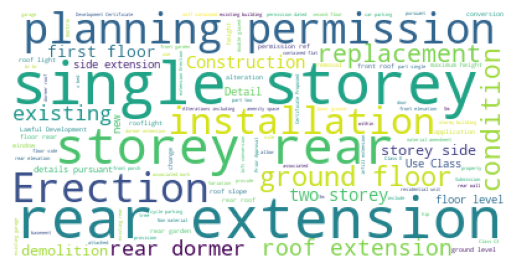

In [55]:
# Visualising the terms used
wordcloud =  WordCloud(background_color = 'white', max_words = 100).generate(' '.join(applications['description']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

Punctuation has a similar impact on topic generation when using LDA. As such, texts will be stripped of punctuation, stopwords, and unnecessary words  specific to the planning application process. Processed texts will also be tokenized (splitting sentences into words) to create the 'bag of words'.

In addition, these words will be lemmatized to group words with the same base meaning but different inflectional endings such as _build_, _building_, _built_. Without lemmatization, such words would be treated individually and so their wider effect on a topic would not be correctly identified. An alternative approach would be to perform stemming, though this does not account for the linguistic or morphological context of a word, rather it only reduce terms to their base word and is less effective than lemmatization on long texts (Boban et.al., 2020), so is less suitable for this project.

In [56]:
# Replacing empty strings with NaN values
applications['description'].replace('nan', np.nan, inplace=True)

# Checking for NaN values
print(f'''Number of NaN present in the 'description' column: {applications.description.isna().sum()}''')

Number of NaN present in the 'description' column: 30


In [57]:
# Dropping NaN values
applications = applications.dropna()

# Resetting the index
applications = applications.reset_index()

# Checking for NaN values
print(f'''Number of NaN present in the 'description' column: {applications.description.isna().sum()}''')

# Checking the new number of applications
print(f'Number of applications: {applications.shape[0]}')

Number of NaN present in the 'description' column: 0
Number of applications: 30266


Now the dataframe only contains applications with an attached description, we can process the texts for LDA.

In [58]:
# Making a copy of the dataframe to prevent interference
applications_LDA = applications.copy()

In [59]:
# Removing punctuation
applications_LDA['no_punc_description'] = \
applications_LDA['description'].map(lambda x: re.sub('[\!?()\d/.:<>-]', '', x))

# Converting all texts to lowercase
applications_LDA['no_punc_description'] = \
applications_LDA['no_punc_description'].map(lambda x: x.lower())

# Viewing the head of the dataframe
display(applications_LDA.head(2))

,index,description,address,metadata,decision,authority,ID,no_punc_description
0,0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,prior approval for the construction of a singl...
1,1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,"side one pine, dead thtm fell and replace reas..."


Using the pre-defined corpus of common stopwords from the NLTK package, stopwords can be removed from the descriptions. However, the corpus of stopwords can also be extended to include words specific to the planning application process that are not insightful.

In [60]:
# Defining stopwords using the NLTK corpus
stop_words = stopwords.words('english')

# Extending the list of stopwords to include terms that are common in planning applications but give no insight
stop_words.extend(['details', 'detail', 'condition', 'conditions', 'submission', 'pursuant', 'dated', 'including',
                   'planning', 'permission', 'application', 'lawful', 'development', 'certificate', 'proposed', 'approval',
                   'approve', 'approved', 'unlawful', 'plans', 'prior', 'height', 'width', 'br', 'no', 'submitted', 'compliance'])

# Removing stopwords
applications_LDA['no_stopwords_description'] = applications_LDA['no_punc_description'].apply(
                        lambda x: ' '.join([w for w in x.split() if w.lower() not in stop_words]))

# Viewing the head of the dataframe
display(applications_LDA.head(2))

,index,description,address,metadata,decision,authority,ID,no_punc_description,no_stopwords_description
0,0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,prior approval for the construction of a singl...,construction single storey rear extension tris...
1,1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,"side one pine, dead thtm fell and replace reas...","side one pine, dead thtm fell replace reason t..."


In [61]:
# Making a list of the strings in the 'no_stopwords_description' column
words_list = applications_LDA['no_stopwords_description'].values.tolist()

In [62]:
# Splitting each string into component words to make the 'bag of words'
words_list = [line.split() for line in words_list]

In [63]:
# Checking the output
print(f"""String 10:
{words_list[10]}""")
print("")
print(f"""String 2000:
{words_list[2000]}""")

String 10:
['suds', 'attached', 'dc', 'august', 'demolition', 'existing', 'single', 'storey', 'buildings', 'site;', 'change', 'use', 'land', "builder's", 'yard', 'use', 'class', 'bb', 'mixuse', 'mixuse', 'commercial', 'residential', 'use', 'classes', 'ea,', 'b,', 'c,', 'e', 'g', 'c;', 'erection', 'part', 'fourpart', 'five', 'storey', 'building', 'providing', 'office', 'space', 'ground', 'floor', 'seven', 'selfcontained', 'residential', 'flats', 'upper', 'floors', 'together', 'provision', 'cycle', 'parking,', 'refuse', 'recycling', 'stores', 'hard', 'soft', 'landscaping', 'crossfield', 'street,', 'se']

String 2000:
['rear', 'garden', 'side', 'accessbrt', 'medium', 'twin', 'stem', 'willow', 'fell', 'ground', 'level', 'treat', 'stump', 'prevent', 'regrowth', 'brt', 'medium', 'mimosa', 'tree', 'leaning', 'onto', 'pergola', 'pushing', 'over,', 'making', 'difficult', 'enter', 'rear', 'garden', 'fell', 'ground', 'level']


We now have a 'bag of words' that has been stripped of punctuation, stopwords, and capitalisation. Next, the words can be lemmatized to strip them of inflectional endings and ensure that words of the same base meaning are grouped together in the frequency distribution of LDA. To do this, the NLTK WordNetLemmatizer is used to iterate over and lemmatize each word in the list.

In [64]:
# Calling the lemmatizer module
lemmatizer = WordNetLemmatizer()

texts_lemmatized = []

# For each word in the list of words, lemmatize and append to 'texts_lemmatized' list
for i in range(0, len(words_list)):
     l1 = words_list[i]
     l2 = [lemmatizer.lemmatize(word) for word in l1]
     texts_lemmatized.append(l2)

In [65]:
# Checking the output
print(f"""String 10:
{texts_lemmatized[10]}""")
print("")
print(f"""String 2000:
{texts_lemmatized[2000]}""")

String 10:
['suds', 'attached', 'dc', 'august', 'demolition', 'existing', 'single', 'storey', 'building', 'site;', 'change', 'use', 'land', "builder's", 'yard', 'use', 'class', 'bb', 'mixuse', 'mixuse', 'commercial', 'residential', 'use', 'class', 'ea,', 'b,', 'c,', 'e', 'g', 'c;', 'erection', 'part', 'fourpart', 'five', 'storey', 'building', 'providing', 'office', 'space', 'ground', 'floor', 'seven', 'selfcontained', 'residential', 'flat', 'upper', 'floor', 'together', 'provision', 'cycle', 'parking,', 'refuse', 'recycling', 'store', 'hard', 'soft', 'landscaping', 'crossfield', 'street,', 'se']

String 2000:
['rear', 'garden', 'side', 'accessbrt', 'medium', 'twin', 'stem', 'willow', 'fell', 'ground', 'level', 'treat', 'stump', 'prevent', 'regrowth', 'brt', 'medium', 'mimosa', 'tree', 'leaning', 'onto', 'pergola', 'pushing', 'over,', 'making', 'difficult', 'enter', 'rear', 'garden', 'fell', 'ground', 'level']


In comparison to the prior 'bag of words', in this output it is clear that some words have been lemmatized. For example, 'classes' has been converted to 'class', and 'floors' has been reduced to 'floor'. Lemmatization does not reduce every word- only those with inflectional endings- and so we can be confident that the process has worked.

With the description of each application stripped of stopwords, punctuation and capitalisation, and lemmatized and tokenized, the text is in a suitable format for LDA. The first step in this is to calculate the frequency distribution of the words.

In [66]:
# Creating a dictionary of the lemmatized words
word_dic = corpora.Dictionary(texts_lemmatized)

# Creating a corpus of the lemmatized words
corp = texts_lemmatized

# Calculating the frequency of terms in each document
corpus = [word_dic.doc2bow(word) for word in corp]

In [67]:
# Visualising the output of the frequency distribution
print(f"""String 10:
{corpus[10]}""")
print("")
print(f"""String 2000:
{corpus[2000]}""")

String 10:
[(4, 1), (11, 1), (12, 2), (31, 2), (36, 1), (121, 1), (135, 3), (138, 1), (149, 2), (150, 1), (153, 1), (154, 1), (155, 1), (157, 2), (160, 1), (164, 1), (167, 1), (168, 2), (170, 1), (172, 1), (187, 1), (266, 1), (267, 1), (268, 1), (269, 1), (270, 1), (271, 1), (272, 1), (273, 1), (274, 1), (275, 1), (276, 1), (277, 1), (278, 1), (279, 1), (280, 1), (281, 1), (282, 1), (283, 1), (284, 2), (285, 1), (286, 1), (287, 1), (288, 1), (289, 1), (290, 1), (291, 1), (292, 1), (293, 1), (294, 1), (295, 1), (296, 1)]

String 2000:
[(9, 2), (51, 2), (94, 1), (103, 1), (126, 2), (160, 2), (226, 1), (792, 1), (809, 1), (940, 2), (1080, 1), (1382, 1), (1589, 1), (1591, 1), (1592, 1), (1876, 1), (1882, 1), (1929, 1), (2519, 1), (2955, 1), (3421, 1), (3473, 2), (3688, 1), (4365, 1), (4366, 1), (4367, 1)]


In the output, we can see the frequency distribution of each word in the representative strings. It is clear, for instance, that word 12 in the corpus occurs twice in string 10, and word 51 in the corpus occurs in string 2000 twice.

In [68]:
# Checking the term frequencies
print(f'Word 12 in the dictionary: {word_dic[12]}')
print(f'Word 51 in the dictionary: {word_dic[51]}')

Word 12 in the dictionary: storey
Word 51 in the dictionary: fell


By calling the index of the word in the corpus, we can validate the frequency distribution. We can see in the lemmatized output that word 12 ('storey') does occur twice in string 10, and that word 51 ('fell') does occur twice in string 2000.

With this frequency distribution, the LDA model from the gensim package can be called. LDA requires the manual selection of the number of topics to generate. To do this, topics are gradually increased until an optimal convergence score is achieved (Greene et.al., 2014), though 10 topics are commonly used (Kherwa and Bansal, 2019). So, two LDA models will be run- one generating 10 topics and one generating 20 topics- to compare the performance.

**LDA with 10 topics**

In [69]:
# Running the LDA model with 10 topics
lda_model_10 = gensim.models.ldamodel.LdaModel(corpus = corpus, id2word = word_dic, num_topics = 10, random_state = 100, update_every = 1,
                                            chunksize = 100, passes = 10, alpha = 'auto', per_word_topics = True)

In [70]:
# Checking the topic keywords for certain topics
pprint(lda_model_10.print_topics()[1])
pprint(lda_model_10.print_topics()[6])

(1,
 '0.054*"floor" + 0.044*"window" + 0.042*"existing" + 0.040*"new" + '
 '0.037*"alteration" + 0.032*"replacement" + 0.031*"front" + 0.026*"ground" + '
 '0.025*"extension;" + 0.024*"external"')
(6,
 '0.313*"metre" + 0.097*"boundary" + 0.088*"approx" + 0.034*"panel" + '
 '0.029*"gate" + 0.024*"growing" + 0.024*"system" + 0.022*"metres," + '
 '0.018*"post" + 0.017*"pre"')


**LDA with 20 topics**

In [71]:
# Running the LDA model with 20 topics
lda_model_20 = gensim.models.ldamodel.LdaModel(corpus = corpus, id2word = word_dic, num_topics = 20, random_state = 100, update_every = 1,
                                            chunksize = 100, passes = 10, alpha = 'auto', per_word_topics = True)

In [72]:
# Checking the topic keywords for certain topics
pprint(lda_model_20.print_topics()[1])
pprint(lda_model_20.print_topics()[6])

(1,
 '0.097*"floor" + 0.078*"new" + 0.075*"alteration" + 0.073*"ground" + '
 '0.063*"window" + 0.059*"existing" + 0.049*"replacement" + 0.047*"external" + '
 '0.040*"first" + 0.036*"elevation"')
(6,
 '0.252*"second" + 0.188*"upper" + 0.000*"level" + 0.000*"limb" + '
 '0.000*"extension," + 0.000*"growing" + 0.000*"flank" + 0.000*"repositioning" '
 '+ 0.000*"singlestorey" + 0.000*"panel"')


Comparing the outputs of both models, it is clear that neither generate satisfactory topics. Both models generate topics with diverse keywords that do not lead to an intuitive topic label. This may suggest that the previous stopword removal was not extensive enough, though not every word can be manually removed.

As an alternative, the BERTopic model can be employed. This uses embeddings and transformers to group texts into topics based on shared semantic relationships and so it does not rely on the frequency distribution approach that generated the above topics.

#### 4.1.2.2. BERTopic

As BERTopic does not use the 'bag of words' approach of the LDA model, texts do not need to be extensively pre-processed. Rather, it is recommended that texts are left in their raw format to accurately analyse the semantic relationships and context of a text (Grootendorst, 2022), with the post-processing of stopwords using the NLTK CountVectorizer available to improve topic labelling. However, the set corpus of stopwords in the NLTK package does not include the words specific to planning applications such as 'details' or 'pursuant', meaning that this post-processing step does not improve the topic labels in our use case. As such, the processed texts created for the prior LDA model will be used as the input of the BERTopic model.

**NOTE:** Many aspects of the BERTopic topic modelling process are slow and memory intensive. As such, the code was run and outputs were exported. These outputs will be re-imported when required but the respective code blocks are disabled to prevent being re-run. Remove the '%%script echo' tag to run the cell.

**NOTE:** BERTopic uses the UMAP package for dimensionality reduction. The UMAP algorithm is stochastic, meaning that results are not inherently reproducible even when specifiying a random seed. Thus, if the below cells are enabled and run, results may differ slightly from those used in subsequent analysis.

In [73]:
# Viewing the head of the applications dataframe
display(applications.head(2))

,index,description,address,metadata,decision,authority,ID
0,0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459
1,1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5


BERTopic is an unsupervised technique but, with a tentative idea of potential planning application topics, we can 'guide' or influence the topic generation by specifiying categories to base topics around.

In [74]:
# Specifiying categories to influence the topic generation
categories = ['Extension', 'Demolition', 'Householder', 'Business',
              'Change of use', 'Advertising', 'Conversion']

In [75]:
# Initiating UMAP for dimensionality reduction
umap_model = UMAP(
    n_neighbors = 15,
    n_components = 5,
    min_dist = 0.0,
    metric = 'cosine',
    random_state = 2) # Setting random state to 2 to promote reproducibility

In [76]:
# Initiating the CountVectorizer model to reduce stopword presence in topic labels
vectorizer_model = CountVectorizer(stop_words = "english")

In [77]:
# Initiating the BERTopic model
topic_model = BERTopic(
    umap_model = umap_model,
    language = "english",
    calculate_probabilities = True,
    nr_topics = 'auto', # Generating the most appropriate number of topics to best fit the data
    vectorizer_model = vectorizer_model,
    seed_topic_list = categories)

In [78]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Fitting the BERTopic model
topics, probs = topic_model.fit_transform(applications_LDA['no_stopwords_description'])

** Disabled to minimise memory consumption- remove tag to run **


In [79]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Assigning the topic information to a dataframe
description_topics = topic_model.get_topic_info()

# Exporting the topic information to a CSV
description_topics.to_csv('description_topics.csv')

** Disabled to minimise memory consumption- remove tag to run **


In [80]:
# Re-importing the CSV
description_topics = pd.read_csv('description_topics.csv')

# Checking the number of topics generated
print(f'Number of topics generated: {description_topics.Topic.nunique()}')

# Viewing the head and tail of the dataframe
display(description_topics.head(3))
display(description_topics.tail(3))

Number of topics generated: 99


,Unnamed: 0,Topic,Count,Name,Representation,Representative_Docs
0,0,-1,7905,-1_existing_floor_new_associated,"['existing', 'floor', 'new', 'associated', 'us...",['construction single storey residential dwell...
1,1,0,14708,0_extension_single_storey_rear,"['extension', 'single', 'storey', 'rear', 'roo...","['erection single storey rear extension', 'ere..."
2,2,1,3353,1_reduce_crown_tree_remove,"['reduce', 'crown', 'tree', 'remove', 'points'...","['lime tree reduce previous reduction points',..."


,Unnamed: 0,Topic,Count,Name,Representation,Representative_Docs
96,96,95,10,95_discharge_refuse_faciliti_stores,"['discharge', 'refuse', 'faciliti', 'stores', ...","['discharge cycle refuse stores ref f', 'disch..."
97,97,96,10,96_carbon_emission_emissions_dioxide,"['carbon', 'emission', 'emissions', 'dioxide',...",['carbon emission reduction attached reference...
98,98,97,10,97_materialsfinishes_facing_materials_hdetails,"['materialsfinishes', 'facing', 'materials', '...",['required f external facing materialsfinishes...


Setting the 'nr_topics' parameter to 'auto' allows for the generation of topics to best fit the data. However, such a high number of topics remains unsuitable for a prediction model, especially when considering that some topics only contain a limited number of texts. As such, the number of topics generated will be limited to 30- a more suitable number for prediction purposes- in a post-processing step.

In [81]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Reducing the number of topics to 30
topic_model.reduce_topics(applications_LDA['no_stopwords_description'], nr_topics = 30)

** Disabled to minimise memory consumption- remove tag to run **


In [82]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Updating the model topic information
topics = topic_model.topics_

** Disabled to minimise memory consumption- remove tag to run **


In [83]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Assigning the updated topic information to a dataframe
description_topics_reduced_topics = topic_model.get_topic_info()

# Exporting the topic information to a CSV
description_topics_reduced_topics.to_csv('description_topics_reduced_topics.csv')

** Disabled to minimise memory consumption- remove tag to run **


In [84]:
# Re-importing the CSV
description_topics_reduced_topics = pd.read_csv('description_topics_reduced_topics.csv')

# Checking the number of topics generated
print(f'Number of topics generated: {description_topics_reduced_topics.Topic.nunique()}')

# Viewing the head of the dataframe
display(description_topics_reduced_topics.head(3))
display(description_topics_reduced_topics.tail(3))

Number of topics generated: 30


,Unnamed: 0,Topic,Count,Name,Representation,Representative_Docs
0,0,-1,7905,-1_existing_floor_new_rear,"['existing', 'floor', 'new', 'rear', 'roof', '...",['single storey rear extension replacement exi...
1,1,0,15512,0_extension_rear_storey_single,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere..."
2,2,1,3464,1_reduce_crown_tree_remove,"['reduce', 'crown', 'tree', 'remove', 'points'...",['rear garden x lime reduce previous reduction...


,Unnamed: 0,Topic,Count,Name,Representation,Representative_Docs
27,27,26,14,26_suds_attached_fulmaj_components,"['suds', 'attached', 'fulmaj', 'components', '...","['suds attached', 'suds attached', 'suds attac..."
28,28,27,14,27_available_required__,"['available', 'required', '', '', '', '', '', ...","['available', 'available', 'available']"
29,29,28,12,28_asked_council_observations_borough,"['asked', 'council', 'observations', 'borough'...","['council asked observations london borough', ..."


Above it is clear that although the number of topics has been reduced to 30, some topics still only contain relatively few documents. This is due to the size of the '-1' topic which contains all texts that are classed as outliers and do not neatly fit into one of the generated topics. To mitigate this, the 'reduce_outliers' module can be used, which aims to best-fit each outlier into a topic cluster.

In [85]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Reducing the number of outlier documents by performing further clustering
new_topics = topic_model.reduce_outliers(applications_LDA['no_stopwords_description'], topics)

** Disabled to minimise memory consumption- remove tag to run **


In [86]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Updating the topic information
topic_model.update_topics(applications_LDA['no_stopwords_description'], topics = new_topics)

** Disabled to minimise memory consumption- remove tag to run **


In [87]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Assigning the updated topic information to a dataframe
description_topics_reduced_topics_outliers = topic_model.get_topic_info()

# Exporting the topic information to a CSV
description_topics_reduced_topics_outliers.to_csv('description_topics_reduced_topics_outliers.csv')

** Disabled to minimise memory consumption- remove tag to run **


In [88]:
# Re-importing the CSV
description_topics_reduced_topics_outliers = pd.read_csv('description_topics_reduced_topics_outliers.csv')

# Checking the number of topics generated
print(f'Number of topics generated: {description_topics_reduced_topics_outliers.Topic.nunique()}')

# Viewing the head of the dataframe
display(description_topics_reduced_topics_outliers.head(3))
display(description_topics_reduced_topics_outliers.tail(3))

Number of topics generated: 30


,Unnamed: 0,Topic,Count,Name,Representation,Representative_Docs
0,0,-1,5,-1____,"['', '', '', '', '', '', '', '', '', '']",['single storey rear extension replacement exi...
1,1,0,20164,0_extension_rear_storey_single,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere..."
2,2,1,3502,1_reduce_crown_tree_remove,"['reduce', 'crown', 'tree', 'remove', 'points'...",['rear garden x lime reduce previous reduction...


,Unnamed: 0,Topic,Count,Name,Representation,Representative_Docs
27,27,26,33,26_suds_attached_energy_water,"['suds', 'attached', 'energy', 'water', 'mater...","['suds attached', 'suds attached', 'suds attac..."
28,28,27,14,27_available_required__,"['available', 'required', '', '', '', '', '', ...","['available', 'available', 'available']"
29,29,28,30,28_council_observations_asked_borough,"['council', 'observations', 'asked', 'borough'...","['council asked observations london borough', ..."


Looking at the reduced size of the '-1' topic cluster, it is clear that the outliers have been reduced. Whilst many outliers have been assigned to topic 0, some have been redistributed into other topics, balancing the topic clusters to an extent.

To further improve the accuracy of the topic clusters, similar topics can be merged based on domain knowledge. In the exported iteration of this process, a number of topics related to the drawings and consulation stages of a planning application, meaning they could be merged.

**NOTE:** The below cell throws an IndexError on its initial run due to an issue with the 'merge_topics' module of the BERTopic library. If this error occurs, simply re-run the cell.

In [89]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Specifiying the topics to merge
topics_to_merge = [7,8,15,18,25,26,27,28]

# Merging the topics
topic_model.merge_topics(applications_LDA['no_stopwords_description'], topics_to_merge)

# Assigning the updated topic information to a dataframe
description_topics_reduced_topics_outliers_merged = topic_model.get_topic_info()

# Exporting the dataframe containing the updated topic information to a CSV
description_topics_reduced_topics_outliers_merged.to_csv('description_topics_reduced_topics_outliers_merged.csv')

** Disabled to minimise memory consumption- remove tag to run **


Now, with a suitable number of topics and a satisfactory topic label representation, the topics can be used for analysis purposes. First, the predicted topic for each application must be extracted.

In [90]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Assigning the predicted topic number for each application to a list
description_topics_reduced_topics_outliers_merged_predictions = topic_model.topics_[:]

# Converting the list to a dataframe
description_topics_reduced_topics_outliers_merged_predictions = pd.DataFrame(description_topics_reduced_topics_outliers_merged_predictions)

# Exporting the dataframe of predicted topic numbers for each application to a CSV
description_topics_reduced_topics_outliers_merged_predictions.to_csv('description_topics_reduced_topics_outliers_merged_predictions.csv')

** Disabled to minimise memory consumption- remove tag to run **


Next, the CSV containing the updated topic information can be re-imported.

In [91]:
# Importing the dataframe containing the topic information and dropping an unneccessary column
description_topics_reduced_topics_outliers_merged_import = pd.read_csv('description_topics_reduced_topics_outliers_merged.csv')
description_topics_reduced_topics_outliers_merged_import = description_topics_reduced_topics_outliers_merged_import.drop(['Unnamed: 0'], axis = 1)

# Viewing the head of the dataframe
display(description_topics_reduced_topics_outliers_merged_import.head(2))

,Topic,Count,Name,Representation,Representative_Docs
0,-1,6,-1_fulopd_referenve__,"['fulopd', 'referenve', '', '', '', '', '', ''...","['', '', 'referenve fulopd']"
1,0,13855,0_extension_rear_storey_single,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere..."


Using the 'Count' column, the percentage composition of each topic can be calculated and the number of applications per topic can be visualised.

In [92]:
# Calculating the percentage contribution of each topic
description_topics_reduced_topics_outliers_merged_import['pc'] = round((description_topics_reduced_topics_outliers_merged_import['Count']/(sum(description_topics_reduced_topics_outliers_merged_import['Count'])))*100,1).astype(str) + '%'

# Viewing the head of the dataframe
display(description_topics_reduced_topics_outliers_merged_import.head(2))

,Topic,Count,Name,Representation,Representative_Docs,pc
0,-1,6,-1_fulopd_referenve__,"['fulopd', 'referenve', '', '', '', '', '', ''...","['', '', 'referenve fulopd']",0.0%
1,0,13855,0_extension_rear_storey_single,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",45.8%


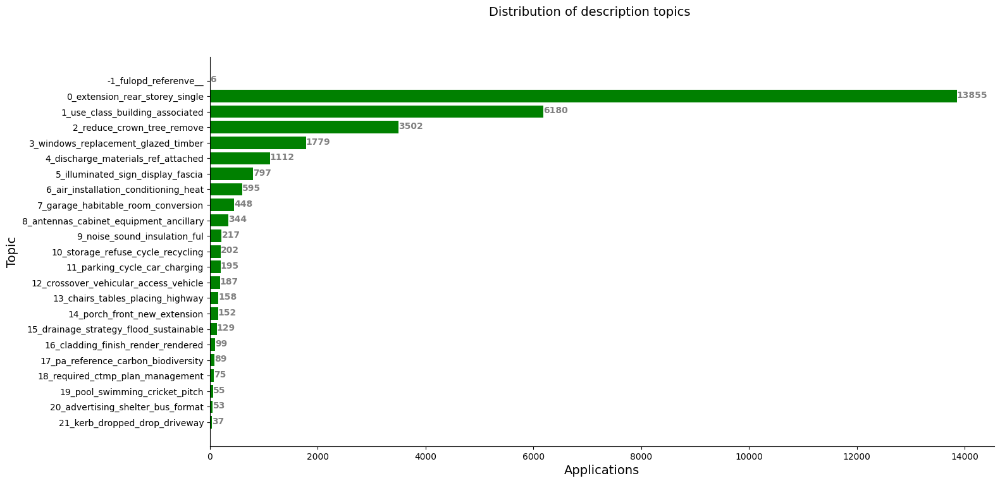

In [93]:
# Visualising the distribution of the description topics
fig, ax = plt.subplots(figsize =(16, 8))

ax.barh(description_topics_reduced_topics_outliers_merged_import['Name'], 
        description_topics_reduced_topics_outliers_merged_import['Count'], color = 'Green')

# Getting the count of each topic and adding it to the respective bar
ax.invert_yaxis()
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 10, fontweight ='bold',
             color ='grey')
    
# Adding axis labels and title
ax.set_xlabel('Applications', fontsize = 14)
ax.set_ylabel('Topic', fontsize = 14)
fig.suptitle('Distribution of description topics', fontsize = 14)

# Removing top and right axis spines
ax.spines[['right', 'top']].set_visible(False)

plt.show()

Above, it is clear that the 'extension_rear_storey_single' topic is the most common predicted description topic, with 46% of applications assigned to the text cluster. On the other hand, applications of the 'kerb_dropped_drop_driveway' description topic comprise only 0.1% of the total applications.

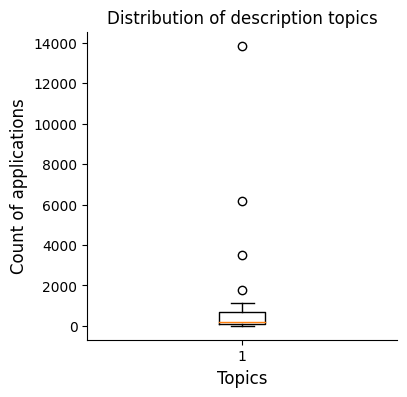

In [94]:
# Visualising the distribution of the description topics
fig = plt.figure(figsize = (4, 4))

plt.boxplot(description_topics_reduced_topics_outliers_merged_import["Count"])

# Adding title and axis legends
plt.title("Distribution of description topics", fontsize = 12)
plt.xlabel('Topics', fontsize = 12)
plt.ylabel('Count of applications', fontsize = 12)

sns.despine()

plt.show()

In [95]:
# Checking the median number of applications per topic
description_topics_reduced_topics_outliers_merged_import["Count"].median()

195.0

Similarly, the box plot further indicates the uneven spread of the data. Of the 17 topics, only five are associated with over 1,000 applications, whilst six topics are associated with less than 100 applications. The small range between upper and lower quartiles illustrates this, with a median of 195 applications per topic. Such an uneven spread suggests that sampling strategies will be required when producing prediction models.

Next, the predicted topic numbers from the exported iteration can be re-imported and joined with the 'applications' dataframe to get the predicted description topic number for each application.

In [96]:
# Importing the dataframe containing the predicted topic number for each application
description_topics_reduced_topics_outliers_merged_predictions_import = pd.read_csv('description_topics_reduced_topics_outliers_merged_predictions.csv')

# Checking the number of topic predictions
print(f'Number of topic predictions: {description_topics_reduced_topics_outliers_merged_predictions_import.shape[0]}')

Number of topic predictions: 30266


The 30,266 predicted topics match the 30,266 planning applications in the 'applications' dataframe (Section 4.1.2.1), meaning we can be satisfied that each application has a predicted description topic. These predicted topic numbers can be concatenated with the 'applications' dataframe.

In [97]:
# Concatenating the dataframe containing the predicted topic number for each application to the applications dataframe
applications = pd.concat([applications, description_topics_reduced_topics_outliers_merged_predictions_import], axis = 1)

# Renaming the final column
applications.columns = [*applications.columns[:-1], 'topic']

# Dropping an unnecessary column
applications = applications.drop(['Unnamed: 0', 'index'], axis = 1)

# Viewing the head of the dataframe
display(applications.head(2))

,description,address,metadata,decision,authority,ID,topic
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2


Now, the topic information from the exported iteration can be joined with the 'applications' dataframe to get the description topic name and information for each application.

In [98]:
# Joining with the 'description_topics_reduced_topics_outliers_merged_import' to get the topic information for each application
applications = applications.join(description_topics_reduced_topics_outliers_merged_import.set_index('Topic'), on = 'topic')

# Renaming the topic columns
applications = applications.rename(columns={'topic': 'DESC_TOPIC_NO', 'Name': 'DESC_TOPIC', 'Representation': 'DESC_TOPIC_REP', 'Representative_Docs': 'DESC_TOPIC_DOCS'})

# Resetting the index
applications.reset_index(inplace=True)

# Dropping unneccessary columns
applications = applications.drop(applications.columns[[0,8,12]],axis = 1)

# Viewing the dataframe
display(applications.head(2))

,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0,0_extension_rear_storey_single,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere..."
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2,2_reduce_crown_tree_remove,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...


Currently, the topic labels are not intuitive. For example, 'reduce_crown_tree_remove' represents applications for tree works or modification, while 'required_ctmp_plan_management' represents applications for the installation of traffic management schemes such as temporary traffic lights at roadworks. Each topic has a number of representative documents attached which give an insight into the description text of the applications used to generate the topic. By comparing the topic label to the representative documents, and the topic label to exemplar application descriptions, we can determine more appropriate and intuitive labels for each topic. This also provides an opportunity to merge topic 0 ('extension_rear_storey_single') and 14 ('porch_front_new_extension'), both of which represent applications for an extension.

In [99]:
# Subsetting the dataframe to return only the description, predicted topic label and number, and representative documents
labels = applications[['description','DESC_TOPIC','DESC_TOPIC_DOCS', 'DESC_TOPIC_NO']].drop_duplicates(
         subset = ['DESC_TOPIC_DOCS']).sort_values(by = 'DESC_TOPIC_NO').reset_index().drop(['index'], axis = 1)

# Showing the full information in the 'DESC_TOPIC_DOCS' column
labels.style.set_properties()

,description,DESC_TOPIC,DESC_TOPIC_DOCS,DESC_TOPIC_NO
0,Details of condition pursuant 5 to planning permission 21/0103 dated 02/06/2021,-1_fulopd_referenve__,"['', '', 'referenve fulopd']",-1
1,"Prior approval for the construction of a single storey rear extension at 36 Tristram Road, Bromley, BR1 extending 4.50m beyond the rear wall of the existing property, with a maximum height of 2.97m and an eaves height of 2.97m.",0_extension_rear_storey_single,"['erection single storey rear extension', 'erection single storey rear extension', 'alterations erection hip gable roof extension side roof dormer roof extension main rear roof erection extension two storey back addition erection single storey siderear extension replacement windows']",0
2,"Details of Condition 3 'Archaeological Work' submitted in compliance for the planning permission (DC/17/102792) dated 18 March 2019 for Demolition of the existing building and the construction of a part 6/ part 7/ part 8-storey mixed use development comprising 23 self-contained residential units, and 59sqm (GIA) commercial ground floor space (Use Class A1 (Retail), A2 (Financial and Professional Services) & B1 (Business), 5 car parking spaces, 40 cycle parking spaces, refuse stores, and private residential balconies and communal amenity area at 86-92 Bell Green SE26.",1_use_class_building_associated,"['variation drawings, land use restriction, opening hours, amplified speechsound, flood risk assessment, breeam assessment, number residential units, land uses, car cycle parking, phasing ref amended [erection storey building comprising residential accommodation balconies ground floor commercial floorspace demolition car showroom bridges court erection five storey building provide ground floor commercial office floorspace first fourth floors excavation create basements comprising car cycle parking spaces, plant, refuserecycling stores ancillary spaces serving alterations erection two additional storeys ndrd floor links roof terrace retained york road buildings commercial office use provision terrace six single storey flexible commercialservicedrinking establishment units provision amenity space, public realm, landscaping, play space, car parking, paving bridges court] allow changes internal residential unit mix allow increase units units, alterations layout top three floors increase roof terrace size, reduction size basement, reduction number car parking spaces, increase number cycle parking spaces, alterations commercial offering inclusion air source heat pumps system', ""nonmaterial amendment ref revised reserved matters scale, layout, access, external appearance landscaping respect phase , allow reconfiguration floorplans plot provide additional units ii minor design changes balconies, ground mezzanine floors façade elevations associated floorplan amendments th march demolition existing buildings construction mixed use redevelopment provide residential units, affordable housing, retail, financial professional services, caférestaurant, bar hot food takeaway uses, car showrooms, office floorspace flexible workspace, hotel, community uses assembly leisure uses, associated basement ground level parking servicing; energy centres; new vehicle pedestrian access circulation; new public amenity space landscaping part 'linear park' allow layout retail unit ground floor level within plot split two separate units change use b use class e"", ""materials ref ful 'demolition redevelopment existing site provide storey mixed use comprising commercial use ground part first floor use class egi residential units use class c, provision associated amenity spaces, refuserecycling cycle storage associated works'""]",1
3,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and replace. Reason: the tree has died, health & safety issue. A native species will be planted as a replacement. Duty to replace applies (para 121, TPO & trees in conservation areas, guidance *).SIDE: ONE Acacia (T2)(ht.9-10m) CROWN REDUCE by 2m to ht.7-8m, remov

In [100]:
# Renaming each description topic label to make them more intuitive
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('-1_fulopd_referenve__','Outliers')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('0_extension_rear_storey_single','Extension')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('1_use_class_building_associated','Change of use')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('2_reduce_crown_tree_remove','Tree works')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('3_windows_replacement_glazed_timber','Minor works')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('4_discharge_materials_ref_attached','Discharge of conditions')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('5_illuminated_sign_display_fascia','Shopfront advertising')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('6_air_installation_conditioning_heat' ,'Air conditioning')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('7_garage_habitable_room_conversion','Room conversion')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('8_antennas_cabinet_equipment_ancillary','Telecommunications')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('9_noise_sound_insulation_ful','Noise assessment')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('10_storage_refuse_cycle_recycling','Waste management')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('11_parking_cycle_car_charging','Car or cycle parking')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('12_crossover_vehicular_access_vehicle','Driveway')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('13_chairs_tables_placing_highway','External seating')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('14_porch_front_new_extension','Extension')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('15_drainage_strategy_flood_sustainable','Flood management')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('16_cladding_finish_render_rendered','External fascia updates')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('17_pa_reference_carbon_biodiversity','Emission reductions')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('18_required_ctmp_plan_management','Traffic management')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('19_pool_swimming_cricket_pitch','Sporting facilities')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('20_advertising_shelter_bus_format','Bus shelter advertising')
applications['DESC_TOPIC'] = applications['DESC_TOPIC'].str.replace('21_kerb_dropped_drop_driveway','Dropped kerb')

We can check that all topic labels have been updated:

In [101]:
# Checking the topic labels
applications.DESC_TOPIC.unique()

array(['Extension', 'Tree works', 'Change of use',
       'Shopfront advertising', 'Discharge of conditions',
       'Telecommunications', 'Minor works', 'Air conditioning',
       'Bus shelter advertising', 'Room conversion', 'Driveway',
       'Noise assessment', 'Car or cycle parking', 'Waste management',
       'External fascia updates', 'Emission reductions',
       'External seating', 'Traffic management', 'Flood management',
       'Sporting facilities', 'Dropped kerb', 'Outliers'], dtype=object)

We can also check random applications in the 'applications' dataframe to see if the predicted topic label is logical given the description of the application.

In [102]:
# Checking random applications to ensure the predicted topic is logical
rand_app = applications[['ID', 'description', 'DESC_TOPIC', 'DESC_TOPIC_REP', 'DESC_TOPIC_DOCS']].iloc[[random.randrange(len(applications)), random.randrange(len(applications))]]
rand_app.style.set_properties(subset = ['description', 'DESC_TOPIC'], **{'background-color' : 'lightblue'})

,ID,description,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS
17745,254890d0-b5b8-4b7b-9fad-0e2ff9a33758,Erection of a mansard roof extension to main rear roof slope and extension above part of two-storey rear addition with the formation of a roof terrace with glazed 1.7m screen surround in connection with the conversion of the upper floors into 2 x 1-bedroom flats.,Extension,"['extension', 'rear', 'storey', 'single', 'roof', 'erection', 'front', 'dormer', 'side', 'rooflights']","['erection single storey rear extension', 'erection single storey rear extension', 'alterations erection hip gable roof extension side roof dormer roof extension main rear roof erection extension two storey back addition erection single storey siderear extension replacement windows']"
625,4392d771-fc64-4360-b0ad-a7535d556b32,1 x Weeping Willow (applicants ref. T1) - Remove two or three stems growing towards the open space to create a more vertical shape to the tree as well as removing any deadwood.,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden', 'points', 'fell', 'reduction', 'back', 'previous']","['rear garden x robinia reduce crown previous pruning points, approx reduction x apple tree reduce crown previous pruning points, approx reduction x apple tree reduce crown previous pruning points, approx reduction x damson tree reduce crown previous pruning points, approx reduction', 'apple tree crown reduction ash tree crown reduction reduce back previous points cherry laurel crown reduction', 'x sycamore tree reduce crown back previous reduction points']"


Finally, we can check the general cleanliness of the dataframe.

In [103]:
# Checking if any applications do not have a predicted description topic
print(f'Applications without a predicted description topic: {applications.DESC_TOPIC_NO.isna().sum()}')

# Checking the number of applications remaining
print(f'Applications: {applications.shape[0]}')

Applications without a predicted description topic: 0
Applications: 30266


In [104]:
print(f"""Checking the dataframe for Nan:
{applications.isna().sum()}""")

Checking the dataframe for Nan:
description        0
address            0
metadata           0
decision           0
authority          0
ID                 0
DESC_TOPIC_NO      0
DESC_TOPIC         0
DESC_TOPIC_REP     0
DESC_TOPIC_DOCS    0
dtype: int64


In [105]:
# Viewing the head of the dataframe
display(applications.head(2))

,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere..."
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...


With a clean dataset containing, for each application, the predicted description topic and associated information, this data is now suitable for further analysis.

#### 4.1.3. Planning application decisions

In addition to the texts containing the description of each application, we also have texts describing the outcome or decision of each planning application. These will be used to understand whether or not a planning application was successful.

In [106]:
# Checking the number of unique decision terms
print(f'Number of unique decisions: {applications.decision.nunique()}')

Number of unique decisions: 413


With over 413 unique decisions, binary encoding decisions into Success/Failure would be an extensive process. Instead, Topic Modelling can again be utilised to group decision texts with similar semantics from which the reduced number of topics can be binary encoded.

First, strings in the decision column will be flattened to remove any nested lists that remain from the scraping process. Next, unnecessary punctuation will be removed and rows without a decision will be dropped.

In [107]:
# Flattening any nested lists that remain from the scraping process
applications.decision = applications.decision.explode()

# Removing punctuation
applications['decision'] = applications['decision'].str.replace('[','')
applications['decision'] = applications['decision'].str.replace(']','')
applications['decision'] = applications['decision'].str.replace('"','')
applications['decision'] = applications['decision'].str.replace("'",'')
applications['decision'] = applications['decision'].str.replace("* (*)",'')
applications['decision'] = applications['decision'].str.replace("-",'')
applications['decision'] = applications['decision'].str.replace("~",'')

In [108]:
# Replacing empty strings with NaN values
applications['decision'].replace('', np.nan, inplace=True)

# Using the NaN values to drop rows with empty strings in the 'decision' column
applications.dropna(subset=['decision'], inplace=True)
applications["decision"] = applications["decision"].astype(str)

# Resetting the index
applications = applications.reset_index()

# Checking the length of the dataframe
print(f'Length of dataframe: {applications.shape[0]}')

Length of dataframe: 30161


In comparison with Section 4.1.2.2., we can see that 105 applications have been removed, leaving only those with a decision. These decisions can be visualised:

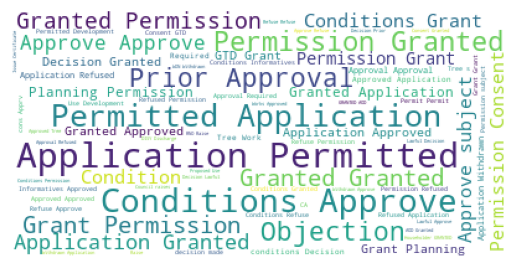

In [109]:
# Visualising the terms used
wordcloud =  WordCloud(background_color = 'white', max_words = 100).generate(' '.join(applications['decision']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

When utilising the LDA topic model in Section 4.1.2.1., it became apparent that the model did not effectively deal with the presence of terms related to the planning application process, leading to poor topic generation. As such, to identify the topics of the planning application decisions, a 'guided' BERTopic model will again be employed.

**NOTE:** Many aspects of the BERTopic topic modelling process are slow and memory intensive. As such, the code was run and outputs were exported. These outputs will be re-imported when required but the respective code blocks are disabled to prevent being re-run. Remove the '%%script echo' tag to run the cell.

**NOTE:** BERTopic uses the UMAP package for dimensionality reduction. The UMAP algorithm is stochastic, meaning that results are not inherently reproducible even when specifiying a random seed. Thus, if the below cells are enabled and run, results may differ slightly from those used in subsequent analysis.

In [110]:
# Specifiying categories to influence the topic generation
categories = ['Approve', 'Approved', 'Granted', 'Refuse', 'Refused', 'Appeal', 'No decision', 'No objection']

In [111]:
# Initiating UMAP for dimensionality reduction
umap_model = UMAP(
    n_neighbors = 15,
    n_components = 5,
    min_dist = 0.0,
    metric = 'cosine',
    random_state = 2) # Setting random state to 2 to ensure reproducibility

In [112]:
# Initiating the BERTopic model
topic_model = BERTopic(
    umap_model = umap_model,
    language = "english",
    calculate_probabilities = True,
    nr_topics = 'auto', # Generating the most appropriate number of topics to best fit the data
    seed_topic_list = categories) # Using the defined categories above to influence topic generation

In [113]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Fitting the BERTopic model
topics, probs = topic_model.fit_transform(applications['decision'])

** Disabled to minimise memory consumption- remove tag to run **


Once the model has run, the predicted topic information can be assigned to a dataframe.

In [114]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Assigning the topic information to a dataframe
decision_topics = topic_model.get_topic_info()

# Exporting the dataframe containing the topic information to a CSV
decision_topics.to_csv('decision_topics.csv')

** Disabled to minimise memory consumption- remove tag to run **


In [115]:
# Re-importing the dataframe containing the topic information and dropping an unneccessary column
decision_topics_import = pd.read_csv('decision_topics.csv')
decision_topics_import = decision_topics_import.drop(['Unnamed: 0'], axis = 1)

# Checking the number of topics generated
print(f'Number of topics generated: {decision_topics_import.Topic.nunique()}')

# Viewing the head of the dataframe
display(decision_topics_import.head(2))

Number of topics generated: 114


,Topic,Count,Name,Representation,Representative_Docs
0,-1,287,-1_aod_raises_decided_council,"['aod', 'raises', 'decided', 'council', 'the',...","['Decided the Council raises no objection ', '..."
1,0,2694,0_approval_approved_approve_progress,"['approval', 'approved', 'approve', 'progress'...","['Approval', 'Approval', 'Approval']"


Over 100 topics were automatically generated to best fit the data. This means that manual classification of topics into 'Success' or 'Failure' is still required, though the extent of the process has been reduced. We could implement a post-processing topic reduction, though this increases the likelihood of information loss on this smaller sample size- experimenting with this approach caused decisions containing 'Householder GRANTED' to be clustered with those containing 'Householder REJECTED', for example, meaning inaccuracies would likely occur in the classification.

In [116]:
%%script echo ** Disabled to minimise memory consumption- remove tag to run **

# Assigning the predicted topic number for each application to a list
decision_topics_predictions = topic_model.topics_[:]

# Converting the list to a dataframe
decision_topics_predictions = pd.DataFrame(decision_topics_predictions)

# Exporting the dataframe of predicted topic numbers for each application to a CSV
decision_topics_predictions.to_csv('decision_topics_predictions.csv')

** Disabled to minimise memory consumption- remove tag to run **


In [117]:
# Re-importing the dataframe containing the predicted decision topic number for each application
decision_topics_predictions_import = pd.read_csv('decision_topics_predictions.csv')

# Checking the number of topic predictions
print(f'Number of topic predictions: {decision_topics_predictions_import.shape[0]}')

# Viewing the head of the dataframe
display(decision_topics_predictions_import.head(2))

Number of topic predictions: 30171


,Unnamed: 0,0
0,0,19
1,1,7


The number of topic predictions approximately matches the number of applications in the 'applications' dataframe (30,161), meaning that we can be confident that every application has a predicted decision topic. Duplicate or superfluous rows will be removed in later stages.

Now, we can re-import the topic information from the exported iteration and visualise the distribution of the topic information. Unlike the description topics produced in Section 4.1.2.2, here there is not a need to rename the topic labels as these will be removed once binary encoding has been conducted.

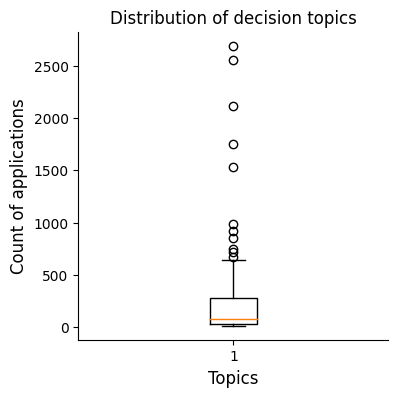

In [118]:
# Visualising the distribution of the decision topics
fig = plt.figure(figsize = (4, 4))

plt.boxplot(decision_topics_import["Count"])

# Adding title and axis legends
plt.title("Distribution of decision topics", fontsize = 12)
plt.xlabel('Topics', fontsize = 12)
plt.ylabel('Count of applications', fontsize = 12)

sns.despine()

plt.show()

In [119]:
# Checking the median number of applications per topic
decision_topics_import["Count"].median()

74.0

Again, an uneven data distribution is seen in the above boxplot with a median number of applications per topic of 74, but a large distance between the lower quartile, upper quartile, and the maximum number of applications. This, similar to the topic modelling of the description texts, indicates that sampling strategies are likely required later in the analysis when producing a prediction model.

Next, the predicted topic numbers from the exported iteration can be re-imported and joined with the 'applications' dataframe to get the predicted decision topic number for each application.

In [120]:
# Concatenating the dataframe containing the predicted topic number for each application to the applications dataframe
applications = pd.concat([applications, decision_topics_predictions_import], axis = 1)

# Renaming the final column
applications.columns = [*applications.columns[:-1], 'topic']

# Dropping an unnecessary column
applications = applications.drop(['Unnamed: 0'], axis = 1)

# Viewing the head of the dataframe
display(applications.head(2))

,index,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS,topic
0,0.0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",19
1,1.0,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2.0,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...,7


This dataframe can now be joined with the 'decision_topics_import' dataframe from the exported iteration to get the predicted topic name and information of each application.

In [121]:
# Joining with the 'decision_topics_import' to get the topic information for each application
applications = applications.join(decision_topics_import.set_index('Topic'), on = 'topic')

# Renaming the topic columns
applications = applications.rename(columns={'Name': 'DECI_TOPIC', 'topic': 'DECI_TOPIC_NO', 'Representation': 'DECI_TOPIC_REP', 'Representative_Docs': 'DECI_TOPIC_DOCS'})

# Resetting the index
applications.reset_index(inplace=True)

# Dropping unneccessary columns
applications = applications.drop(applications.columns[[0, 1]],axis = 1)

# Viewing the dataframe
display(applications.head(2))

,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS,DECI_TOPIC_NO,Count,DECI_TOPIC,DECI_TOPIC_REP,DECI_TOPIC_DOCS
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",19,536,19_refused___,"['refused', '', '', '', '', '', '', '', '', '']","['Refused', 'Refused', 'Refused']"
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2.0,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...,7,852,7_objection_raises_decided_council,"['objection', 'raises', 'decided', 'council', ...","['Decided the Council raises no objection ', '..."


We can then check random applications in the 'applications' dataframe to see if the predicted decision topic is logical given the decision of the application.

In [122]:
# Checking random applications to ensure the predicted topic is logical
rand_app = applications[['ID', 'decision', 'DECI_TOPIC', 'DECI_TOPIC_REP', 'DECI_TOPIC_DOCS']].iloc[[random.randrange(len(applications)), random.randrange(len(applications))]]
rand_app.style.set_properties(subset = ['decision', 'DECI_TOPIC'], **{'background-color' : 'lightblue'})

,ID,decision,DECI_TOPIC,DECI_TOPIC_REP,DECI_TOPIC_DOCS
20902,72fda664-c48b-4665-842f-e48aedc769d6,Grant,8_grant_final_decision_,"['grant', 'final', 'decision', '', '', '', '', '', '', '']","['Grant', 'Grant', 'Grant']"
2091,487fbe99-c99e-4474-96b7-3f318d0bd942,Application Permitted,2_permitted_application__,"['permitted', 'application', '', '', '', '', '', '', '', '']","['Application Permitted', 'Application Permitted', 'Application Permitted']"


Satisfied that the predicted decision topics are logical, we can binary encode the topics into Success/Failure. The selection of topics for each category was performed manually on the exported iteration of the topic modelling process.

In [123]:
# Checking if any applications do not have a predicted decision topic
print(f'Applications without a predicted decision topic: {applications.DECI_TOPIC_NO.isna().sum()}')

Applications without a predicted decision topic: 0


In [124]:
# Defining a list of unsuccessful planning application decision terms
unsuccessful = [5, 16, 17, 19, 26, 32, 36, 46, 52, 69, 71, 82, 84, 88, 89, 91, 94, 99, 104, 107, 109, 112]
# Defining a list of successful planning application decision terms
successful = [0, 1,2, 3, 4, 6, 7, 8, 9, 10, 11, 14, 15, 18, 20, 21, 22, 24, 25, 27, 28, 29, 30, 31, 34, 35,
              37, 39, 40, 41, 43, 44, 47, 48, 50, 51, 54, 55, 57, 58, 61, 62, 63, 64, 66, 67, 72, 73, 74, 75,
              78, 80, 81, 85, 86, 87, 92, 93, 98, 101, 102, 105, 108]

By identifying if the topic number of an application is found in either of the above lists, we can encode the application with either '1' (successful) or '0' (unsuccessful) in respective columns. Merging these columns allows for a binary outcome column to be created.

In [125]:
# If the topic number is in the list of unsuccessful terms
applications["unsuccessful"] = np.where(applications["DECI_TOPIC_NO"].isin(unsuccessful), 0, '')

# If the topic number is in the list of successful terms
applications["successful"] = np.where(applications["DECI_TOPIC_NO"].isin(successful), 1, '')

# Merging the two columns to create a binary outcome
applications['BINARY_OUTCOME'] = applications['unsuccessful'].astype(str) + applications['successful'].astype(str)

# Dropping the unnecessary 'successful' and 'unsuccessful' columns
applications = applications.drop(['unsuccessful', 'successful'], axis = 1)

We can then check the 'applications' dataframe to ensure the predicted binary outcome is logical in comparison with the known decision of each application.

In [126]:
# Checking random applications to ensure the binary outcome is logical
rand_app = applications[['ID', 'decision', 'BINARY_OUTCOME' ,'DECI_TOPIC', 'DECI_TOPIC_REP', 'DECI_TOPIC_DOCS']].iloc[[random.randrange(len(applications)), random.randrange(len(applications))]]
rand_app.style.set_properties(subset = ['decision', 'BINARY_OUTCOME'], **{'background-color' : 'lightblue'})

,ID,decision,BINARY_OUTCOME,DECI_TOPIC,DECI_TOPIC_REP,DECI_TOPIC_DOCS
2443,e059138f-a77d-40d3-8ce8-2e70ae83ddb0,Granted With Conditions,1,15_standard_extra_granted_conditions,"['standard', 'extra', 'granted', 'conditions', 'with', 'change', 'use', 'pde', 'enforcement', 'of']","['Granted Standard Conditions', 'Granted Standard Conditions', 'Granted Standard Conditions']"
5376,a0da659d-55a8-4359-8bca-9a495c41bfd1,Granted With Conditions,1,15_standard_extra_granted_conditions,"['standard', 'extra', 'granted', 'conditions', 'with', 'change', 'use', 'pde', 'enforcement', 'of']","['Granted Standard Conditions', 'Granted Standard Conditions', 'Granted Standard Conditions']"


In [127]:
print(f'Number of successful applications: {applications["BINARY_OUTCOME"].str.count("1").sum()} ({round((((applications["BINARY_OUTCOME"].str.count("1").sum())/applications.shape[0])*100),1)}%)')
print(f'Number of unsuccessful applications: {applications["BINARY_OUTCOME"].str.count("0").sum()} ({round((((applications["BINARY_OUTCOME"].str.count("0").sum())/applications.shape[0])*100),1)}%)')
print(f'Number of other applications: {(applications.shape[0])-(applications["BINARY_OUTCOME"].str.count("1").sum()+applications["BINARY_OUTCOME"].str.count("0").sum())} ({round((((applications.shape[0])-(applications["BINARY_OUTCOME"].str.count("1").sum()+applications["BINARY_OUTCOME"].str.count("0").sum()))/applications.shape[0])*100, 1)}%)')

Number of successful applications: 23009 (76.3%)
Number of unsuccessful applications: 3831 (12.7%)
Number of other applications: 3331 (11.0%)


Above, we can see that of the 30,171 applications, around 76% have a successful outcome compared to only around 13% with an unsuccessful outcome. Though, 11% of applications are defined as 'Other', meaning they do not have a binary encoding as their topic number was not classified as Successful/Unsuccessful. These were topics for which a categorisation could not be made e.g., where the application was yet to be decided or had been delegated to another planning authority. As such, these applications do not provide any insight for this project and so will be removed below.

In [128]:
# Replacing empty strings with NaN values
applications['BINARY_OUTCOME'].replace('', np.nan, inplace=True)

# Checking for NaN values
print(f'''Number of NaN present in the 'binary_outcome' column: {applications.BINARY_OUTCOME.isna().sum()}''')

Number of NaN present in the 'binary_outcome' column: 3331


In [129]:
# Using the NaN values to drop rows with empty strings
applications.dropna(inplace = True)

# Dropping redundant columns
applications = applications.drop(['DECI_TOPIC_NO', 'Count', 'DECI_TOPIC', 'DECI_TOPIC_REP', 'DECI_TOPIC_DOCS'], axis = 1)

# Resetting the index
applications = applications.reset_index()

# Checking for NaN values
print(f'''Number of NaN present in the 'BINARY_OUTCOME' column: {applications.BINARY_OUTCOME.isna().sum()}''')

Number of NaN present in the 'BINARY_OUTCOME' column: 0


In [130]:
print(f'Number of applications: {applications.shape[0]}')
print(f'Number of successful applications: {applications["BINARY_OUTCOME"].str.count("1").sum()} ({round((((applications["BINARY_OUTCOME"].str.count("1").sum())/applications.shape[0])*100),1)}%)')
print(f'Number of unsuccessful applications: {applications["BINARY_OUTCOME"].str.count("0").sum()} ({round((((applications["BINARY_OUTCOME"].str.count("0").sum())/applications.shape[0])*100),1)}%)')

Number of applications: 26833
Number of successful applications: 23006 (85.7%)
Number of unsuccessful applications: 3827 (14.3%)


All applications without a binary encoded topic have now been removed, leaving 26,833 applications.

We can now check the general cleanliness of the dataframe:

In [131]:
print(f"""Checking the dataframe for Nan:
{applications.isna().sum()}""")

Checking the dataframe for Nan:
index              0
description        0
address            0
metadata           0
decision           0
authority          0
ID                 0
DESC_TOPIC_NO      0
DESC_TOPIC         0
DESC_TOPIC_REP     0
DESC_TOPIC_DOCS    0
BINARY_OUTCOME     0
dtype: int64


In [132]:
# Viewing the dataframe
display(applications.head(2))

,index,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS,BINARY_OUTCOME
0,0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",0
1,1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2.0,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...,1


With a clean dataset containing, for each application, the predicted decision topic and associated information, this data is now suitable for further analysis.

#### 4.1.4. Geocoding

Currently, the 'address' column of the 'applications' dataframe contains the address of each planning application. However, to conduct spatial analysis, the coordinates of each application must also be known. To convert the address into coordinates, the Google Maps Geocoding API can be used. Alternative API's such as Nominatim or Bing Maps exist, but these have more restrictive limits on API calls.

To do so, addresses can first be split into a single dataframe:

In [133]:
# Keeping only the 'address' column for geocoding purposes
address = applications['address'].to_frame()

# Checking the length of the dataframe:
print(f'Length of dataframe: {address.shape[0]}')

# Checking the number of duplicate addresses:
print(f"Number of duplicate addresses: {address.duplicated(subset = 'address', keep = 'first').sum()}")

Length of dataframe: 26833
Number of duplicate addresses: 4170


We can see that there are over 4,000 duplicate addresses in the data. Only the first instance of a duplicate address needs to be kept for geocoding and joining purposes, and to minimise the number of API calls needed.

In [134]:
# Dropping duplicate addresses
address = address.drop_duplicates(subset = ["address"], keep = 'first')

# Checking the length of the new dataframe:
print(f'Length of dataframe: {address.shape[0]}')

# Resetting the index
address = address.reset_index()

# Checking if there are any duplicate addresses:
print(f"Number of duplicate addresses: {address.duplicated(subset='address', keep='first').sum()}")

Length of dataframe: 22663
Number of duplicate addresses: 0


Having minimised the number of API calls needed, we can geocode the addresses.

In [135]:
# Dropping unnecessary 'index' columns, leaving only the address column
address = address.iloc[:,-1:]

# Viewing the head of the dataframe
address.head(2)

,address
0,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX"
1,"2 LAWRIE PARK ROAD, LONDON, SE26 6DN"


In [136]:
# Creating empty columns to store the returned latitude and longitude
address['long'] = ""
address['lat'] = ""

# Viewing the head of the dataframe
address.head(2)

,address,long,lat
0,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",,
1,"2 LAWRIE PARK ROAD, LONDON, SE26 6DN",,


**NOTE:** The Google Developer Platform provides £200 of free credit for API usage. This equates to around 40,000 API calls. Once the credit has been used, billing commences. As such, the API key has been removed and the geocoding cell has been disabled to prevent re-running.

Similar to the BERTopic modelling process in Sections 4.1.2.2 and 4.1.3., this process was run once and results were exported to ensure consistency, reduce computation time, and limit potential billing. If running the geocoding process again is desired, create an API key on the Google Developer Platform and remove the '%% script echo' tag in the below code blocks.

In [137]:
%%script echo ** Cell not run to prevent billing **

# Setting the parameters for the API (NOTE: API key has been removed to prevent re-running and charging)
gmaps = googlemaps.Client(key = '#ENTER API KEY')

# Calling the API for every address in the dataframe
for x in range(len(address)):
    geocode_result = gmaps.geocode(address['address'][x])
    if len(geocode_result) == 0:
        address.iloc[x]['lat'] = 'No address'
    else:
        address['lat'][x] = geocode_result[0]['geometry']['location'] ['lat']
        address['long'][x] = geocode_result[0]['geometry']['location']['lng']

** Cell not run to prevent billing **


This loop calls the API for each address in the dataframe. If no coordinates can be returned (i.e. if there is no latitude in the returned JSON), the 'latitude' column of the relevant address is appended with 'No address', allowing these rows to be dropped subsequently. If coordinates are returned, these are stored in the respective latitude/longitude columns of the dataframe.

In [138]:
%%script echo ** Cell not run to prevent billing **

# Exporting the geocoded address dataframe to prevent needing to re-run
address.to_csv('address.csv')

** Cell not run to prevent billing **


In [139]:
# Reimporting the address dataframe
address_import = pd.read_csv('address.csv')

In [140]:
# Checking the length of the dataframe:
print(f'Length of dataframe: {address_import.shape[0]}')

# Viewing the resulting dataframe
address_import.head(5)

Length of dataframe: 22676


,Unnamed: 0,address,long,lat
0,0,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",0.011044,51.428630
1,1,"2 LAWRIE PARK ROAD, LONDON, SE26 6DN",-0.057023,51.427019
2,2,"74 GLENFARG ROAD, LONDON, SE6 1XJ",-0.006330,51.442668
3,3,"16 CHURCH TERRACE, LONDON, SE13 5BT",0.001578,51.461787
4,4,"74 FLORENCE ROAD, LONDON, SE14 6QL",-0.030875,51.472922


We can see that the length of the 'address' dataframe is now 22,676, an increase of 13 upon the unique addresses identified previously. This indicates that marginal duplication has occured in the process. To resolve this, rows without a latitude/longitude coordinate will be removed.

In [141]:
# Replacing empty strings with NaN values
address_import['long'].replace('', np.nan, inplace=True)

# Checking for NaN values
print(f'''Number of NaN present in the 'binary_outcome' column: {address_import.long.isna().sum()}''')

Number of NaN present in the 'binary_outcome' column: 30


In [142]:
# Dropping NaN values
address_import = address_import.dropna(subset=['long'])

# Dropping the unnecessary 'Unnamed: 0' column
address_import = address_import.drop(['Unnamed: 0'], axis = 1)

# Checking the length of the new dataframe:
print(f'Length of dataframe: {address_import.shape[0]}')

# Viewing the resulting dataframe
address_import.head(5)

Length of dataframe: 22646


,address,long,lat
0,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",0.011044,51.428630
1,"2 LAWRIE PARK ROAD, LONDON, SE26 6DN",-0.057023,51.427019
2,"74 GLENFARG ROAD, LONDON, SE6 1XJ",-0.006330,51.442668
3,"16 CHURCH TERRACE, LONDON, SE13 5BT",0.001578,51.461787
4,"74 FLORENCE ROAD, LONDON, SE14 6QL",-0.030875,51.472922


With 22,646 complete geocoded addresses returned, we can see that the geocoding process failed to identify coordinates for only 17 of the unique addresses identified. These coordinates can now be joined to the 'applications' dataframe to provide the coordinates for each application, including those with duplicated addresses.

In [143]:
# Joining the two dataframes
applications = applications.join(address_import.set_index('address'), on = 'address')

In [144]:
# Viewing the head of the dataframe
applications.head(2)

,index,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS,BINARY_OUTCOME,long,lat
0,0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",0,0.011044,51.428630
1,1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2.0,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...,1,-0.057023,51.427019


In [145]:
# Checking for null values in the coordinates columns
print(f'Number of null values: {applications.long.isna().sum()}')

Number of null values: 791


By identifying the number of rows in the 'applications' dataframe without a coordinate value, we can see the total applications that could not be geocoded. These may be applications that share the same address that could not be geocoded. All 791 of these will be removed as they cannot be used for spatial analysis purposes.

In [146]:
# Dropping NaN values
applications = applications.dropna(subset=['long'])

# Dropping the unnecessary 'index' column
applications = applications.drop(['index'], axis = 1)

# Checking the length of the new dataframe:
print(f'Length of dataframe: {applications.shape[0]}')

Length of dataframe: 26042


The dataframe now contains 26,042 applications and so the general cleanliness can be examined.

In [147]:
print(f"""Checking the dataframe for Nan:
{applications.isna().sum()}""")

Checking the dataframe for Nan:
description        0
address            0
metadata           0
decision           0
authority          0
ID                 0
DESC_TOPIC_NO      0
DESC_TOPIC         0
DESC_TOPIC_REP     0
DESC_TOPIC_DOCS    0
BINARY_OUTCOME     0
long               0
lat                0
dtype: int64


The dataframe is now fully wrangled and cleaned, containing only the 26,042 applications with a predicted description and decision topic and a geocoded address. This is suitable for further analysis, and can be converted to a geodataframe to allow for spatial operations.

In [148]:
# Converting the dataframe to a geodataframe for use in further analysis
applications = gpd.GeoDataFrame(applications, geometry = gpd.points_from_xy(
               applications.long, applications.lat), crs = 'epsg:4326')

# Viewing the resulting dataframe
applications.head(2)

,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS,BINARY_OUTCOME,long,lat,geometry
0,Prior approval for the construction of a singl...,"36 TRISTRAM ROAD, BROMLEY, BR1 5LX",DC/22/124937,Refused,Lewisham,0edb7892-8bd0-44c8-b619-bc539edfd459,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",0,0.011044,51.428630,POINT (0.01104 51.42863)
1,"SIDE: ONE Pine, dead (T1)(ht.12m) FELL and rep...","2 LAWRIE PARK ROAD, LONDON, SE26 6DN",DC/22/124933,Raise No Objection,Lewisham,37e699c6-a4d1-47aa-bad4-66bc9f8a2cd5,2.0,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...,1,-0.057023,51.427019,POINT (-0.05702 51.42702)


Now we have a clean geodataframe containing all applications submitted to the 33 London planning authorities between 01-01-2022 and 31-03-2022 that have a predicted description and decision topic and a fully geocoded address.

### 4.2. Locational data

**2011 LSOA boundaries**

The shapefile of 2011 LSOA boundaries imported in Section 2.2. contains the boundaries of all LSOA in England and Wales. For this project, only those in London are required. Similarly, without applications submitted to the Brent Borough Council, LSOA in Brent can be removed to prevent the distortion of analysis results. Applications were also not scraped for the LLDC but, unlike Brent, this planning authority only has a small physical presence as it only deals with applications in any borough for projects relating to the 2012 London Olympics and so will likely not affect the London LSOA.

In [149]:
# Viewing the head of the dataframe
display(lsoa_2011_boundaries.head(2))

# Checking the number of LSOA
print(f'Number of LSOA: {lsoa_2011_boundaries.shape[0]}')

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18..."
1,E01000035,Barking and Dagenham 010A,549957,185575,0.161380,51.5491,3609.905134,47eef4c6-f44f-43c7-ba2f-bd8a4e62b5ee,"POLYGON ((550266.910 185957.709, 550269.100 18..."


Number of LSOA: 34753


In [150]:
# Dropping all LSOA with a name containing 'Brent'
lsoa_2011_boundaries = lsoa_2011_boundaries[~lsoa_2011_boundaries.LSOA11NM.str.contains('|'.join(["Brent"]))]

# Checking the length of the dataframe
print(f'Number of LSOA: {lsoa_2011_boundaries.shape[0]}')

Number of LSOA: 34534


Above, we can see that 219 LSOA with a name containing 'Brent' have now been removed. Whilst the boundaries are not yet subset to include only those in London, they will be in Section 4.3.5.

### 4.3. Geodemographic data

#### 4.3.1. Indices of Multiple Deprivation of LSOA

This dataset contains the 2019 IMD score of each LSOA in London and so does not need extensive wrangling.

In [151]:
# Viewing the head of the dataframe
display(imd.head(2))

# Checking the number of LSOA
print(f'Number of LSOA: {imd.shape[0]}')

,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Score,Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Score (rate),Income Rank (where 1 is most deprived),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Score (rate),Employment Rank (where 1 is most deprived),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Score","Education, Skills and Training Rank (where 1 is most deprived)","Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Score,Health Deprivation and Disability Rank (where 1 is most deprived),Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Score,Crime Rank (where 1 is most deprived),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Score,Barriers to Housing and Services Rank (where 1 is most deprived),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Score,Living Environment Rank (where 1 is most deprived),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
0,E01000001,City of London 001A,E09000001,City of London,6.208,29199,9,0.007,32831,10,0.010,32742,10,0.024,32842,10,-1.654,32113,10,-2.012,32662,10,29.472,7319,3,31.873,7789,3
1,E01000002,City of London 001B,E09000001,City of London,5.143,30379,10,0.034,29901,10,0.027,31190,10,0.063,32832,10,-1.115,29705,10,-2.343,32789,10,24.412,11707,4,23.084,13070,4


Number of LSOA: 4835


In [152]:
# Renaming select columns
imd.rename(columns = {'Index of Multiple Deprivation (IMD) Score': 'IMD_SCORE', 'LSOA code (2011)': 'LSOA11CD'}, inplace = True)

In [153]:
# Resetting the index
imd = imd.reset_index()

# Keeping only the 'LSOA11CD' and 'IMD_SCORE' columns
imd = imd[['LSOA11CD', 'IMD_SCORE']]

# Viewing the head of the dataframe
imd.head(2)

,LSOA11CD,IMD_SCORE
0,E01000001,6.208
1,E01000002,5.143


The dataframe now contains the 2019 IMD score for each 2011 LSOA in London, and so is suitable for analysis.

#### 4.3.2. Ethnic composition of LSOA

This dataset contains the count of respondents to the 2021 Census of each ethnic group in each 2021 LSOA in England and Wales, broken down by 5 'parent' ethnic groups (i.e., Black, White, Asian, Mixed, Other).

In [154]:
# Viewing the head of the dataframe
display(ethnicity.head(2))

# Checking the length of the dataframe
print(f'Length of dataframe: {ethnicity.shape[0]}')

,date,geography,geography code,Ethnic group: Total: All usual residents,"Ethnic group: Asian, Asian British or Asian Welsh","Ethnic group: Asian, Asian British or Asian Welsh: Bangladeshi","Ethnic group: Asian, Asian British or Asian Welsh: Chinese","Ethnic group: Asian, Asian British or Asian Welsh: Indian","Ethnic group: Asian, Asian British or Asian Welsh: Pakistani","Ethnic group: Asian, Asian British or Asian Welsh: Other Asian","Ethnic group: Black, Black British, Black Welsh, Caribbean or African","Ethnic group: Black, Black British, Black Welsh, Caribbean or African: African","Ethnic group: Black, Black British, Black Welsh, Caribbean or African: Caribbean","Ethnic group: Black, Black British, Black Welsh, Caribbean or African: Other Black",Ethnic group: Mixed or Multiple ethnic groups,Ethnic group: Mixed or Multiple ethnic groups: White and Asian,Ethnic group: Mixed or Multiple ethnic groups: White and Black African,Ethnic group: Mixed or Multiple ethnic groups: White and Black Caribbean,Ethnic group: Mixed or Multiple ethnic groups: Other Mixed or Multiple ethnic groups,Ethnic group: White,"Ethnic group: White: English, Welsh, Scottish, Northern Irish or British",Ethnic group: White: Irish,Ethnic group: White: Gypsy or Irish Traveller,Ethnic group: White: Roma,Ethnic group: White: Other White,Ethnic group: Other ethnic group,Ethnic group: Other ethnic group: Arab,Ethnic group: Other ethnic group: Any other ethnic group
0,2021,City of London 001A,E01000001,1474,158,4,66,49,2,37,11,8,3,0,56,28,8,2,18,1181,822,32,0,11,316,68,22,46
1,2021,City of London 001B,E01000002,1386,181,7,102,37,3,32,11,9,2,0,60,26,4,2,28,1084,734,42,0,6,302,50,13,37


Length of dataframe: 35672


In [155]:
# Renaming columns for later joining purposes
ethnicity.rename(columns = {'geography code': 'LSOA21CD'}, inplace = True)

In [156]:
# Subsetting the dataframe to only include the required columns
ethnicity = ethnicity.iloc[:, [2, 3, 4, 10, 14, 19, 25]]

# Viewing the head of the dataframe
ethnicity.head(1)

,LSOA21CD,Ethnic group: Total: All usual residents,"Ethnic group: Asian, Asian British or Asian Welsh","Ethnic group: Black, Black British, Black Welsh, Caribbean or African",Ethnic group: Mixed or Multiple ethnic groups,Ethnic group: White,Ethnic group: Other ethnic group
0,E01000001,1474,158,11,56,1181,68


Using the above columns of the count of respondents of each ethnic group, we can calculate the proportion of each ethnic group in an LSOA.

In [157]:
# Calculating the proportion of residents in an LSOA of each ethnic group
ethnicity['%_LSOA_Asian'] = round(((ethnicity.iloc[:,2]/ethnicity.iloc[:,1])*100),2)
ethnicity['%_LSOA_Black'] = round(((ethnicity.iloc[:,3]/ethnicity.iloc[:,1])*100),2)
ethnicity['%_LSOA_Mixed'] = round(((ethnicity.iloc[:,4]/ethnicity.iloc[:,1])*100),2)
ethnicity['%_LSOA_White'] = round(((ethnicity.iloc[:,5]/ethnicity.iloc[:,1])*100),2)
ethnicity['%_LSOA_Other'] = round(((ethnicity.iloc[:,6]/ethnicity.iloc[:,1])*100),2)

# Calculating the proportion of residents that are from a 'non-white' ethnic group
ethnicity['%_LSOA_NON_WHITE'] = round(((
    ethnicity.iloc[:,[2,3,4,6]].sum(axis=1))/(ethnicity.iloc[:,1]))*100,2)

# Viewing the head of the dataframe
ethnicity.head(1)

,LSOA21CD,Ethnic group: Total: All usual residents,"Ethnic group: Asian, Asian British or Asian Welsh","Ethnic group: Black, Black British, Black Welsh, Caribbean or African",Ethnic group: Mixed or Multiple ethnic groups,Ethnic group: White,Ethnic group: Other ethnic group,%_LSOA_Asian,%_LSOA_Black,%_LSOA_Mixed,%_LSOA_White,%_LSOA_Other,%_LSOA_NON_WHITE
0,E01000001,1474,158,11,56,1181,68,10.72,0.75,3.8,80.12,4.61,19.88


In [158]:
# Subsetting to remove the now redundant columns
ethnicity = ethnicity[['LSOA21CD','%_LSOA_NON_WHITE']]

# Viewing the head of the resulting dataframe
ethnicity.head(1)

,LSOA21CD,%_LSOA_NON_WHITE
0,E01000001,19.88


Now, the dataframe contains the proportion of persons in an LSOA of a 'Non-white' ethnic group. Though, this exists on a 2021 LSOA area-level geography, rather than the 2011 LSOA used in this project, and so the LSOA must be converted using the 'lsoa_lookup' imported in Section 3.3.2.

In [159]:
# Joining the dataframe with the lsoa lookup
ethnicity = ethnicity.join(lsoa_lookup.set_index('LSOA21CD'), on = 'LSOA21CD')

# Viewing the head of the resulting dataframe
ethnicity.head(1)

,LSOA21CD,%_LSOA_NON_WHITE,ObjectId,LSOA11CD,LSOA11NM,LSOA21NM,LAD22CD,LAD22NM,LAD22NMW
0,E01000001,19.88,1.0,E01000001,City of London 001A,City of London 001A,E09000001,City of London,NaN


In [160]:
# Keeping only the relevant columns
ethnicity = ethnicity[['LSOA11CD', '%_LSOA_NON_WHITE']]

# Viewing the head of the resulting dataframe
ethnicity.head(1)

,LSOA11CD,%_LSOA_NON_WHITE
0,E01000001,19.88


As the data now uses a 2011 LSOA area level geography, it is suitable for further analysis. LSOA that are not in London will be removed in Section 4.3.5.

#### 4.3.3. Housing tenure composition of LSOA

This dataset contains the number of respondents to the 2021 Census in a 2021 LSOA broken down by household tenure, the number of people per room in a household, and the property type.

In [161]:
# Viewing the head of the dataframe
display(tenure.head(2))

# Checking the length of the dataframe
print(f'Length of dataframe: {tenure.shape[0]}')

,Lower layer Super Output Areas Code,Lower layer Super Output Areas,Tenure of household (5 categories) Code,Tenure of household (5 categories),Number of people per room in household (5 categories) Code,Number of people per room in household (5 categories),Accommodation type (5 categories) Code,Accommodation type (5 categories),Observation
0,E01000001,City of London 001A,-8,Does not apply,-8,Does not apply,1,Whole house or bungalow: Detached,0
1,E01000001,City of London 001A,-8,Does not apply,-8,Does not apply,2,Whole house or bungalow: Semi-detached,0


Length of dataframe: 4459000


In [162]:
# Renaming columns
tenure.rename(columns = {'Lower layer Super Output Areas Code':'LSOA21CD'}, inplace = True)

# Keeping only relevant columns
tenure = tenure[['LSOA21CD', 'Tenure of household (5 categories) Code', 'Observation']]

To understand the proportion of housing in an LSOA of each tenure type, we first need to know the number of respondents in each LSOA. To do this, the dataframe must be grouped by LSOA code and aggregated by the sum of all 'Observations' (i.e., respondents).

In [163]:
# Grouping all 5 tenure classifications in an LSOA and aggregating the sum of all respondent counts, to get a
# total respondent population for each LSOA
lsoa_tenure_pop = tenure.groupby(['LSOA21CD'], as_index=False).agg({'Observation':['sum']})
lsoa_tenure_pop.columns = ['LSOA21CD','Sum_total_housing_pop']

# Viewing the head of the dataframe
display(lsoa_tenure_pop.head(2))

,LSOA21CD,Sum_total_housing_pop
0,E01000001,839
1,E01000002,822


With this knowledge, we can then calculate the sum of all respondents living in housing of each tenure type in an LSOA.

In [164]:
# Converting the categories of tenure to strings so they can be used in the wrangling
tenure['Tenure of household (5 categories) Code'] = tenure['Tenure of household (5 categories) Code'].astype(str)

In [165]:
# Checking the unique category values
tenure['Tenure of household (5 categories) Code'].unique()

array(['-8', '0', '1', '2', '3'], dtype=object)

Of the 5 categories of housing tenure type, '-8' represents 'Does not apply' (and so is not useful for this project), '0' represents a house that is owned outright, '1' represents a house that is owned with a mortgage, '2' represents a house that is socially rented, and '3' represents a house that is privately rented. Using these, we can extract the respective rows of each tenure type from the 'tenure' dataframe into an individual dataframe.

In [166]:
# Extracting data for the relevant tenure types using the classification codes
tenure_owned_outright = tenure[tenure['Tenure of household (5 categories) Code'] == "0"]
tenure_owned_mortgage = tenure[tenure['Tenure of household (5 categories) Code'] == "1"]
tenure_social_rent = tenure[tenure['Tenure of household (5 categories) Code'] == "2"]
tenure_private_rent = tenure[tenure['Tenure of household (5 categories) Code'] == "3"]

In [167]:
# Checking 'tenure_owned_outright' as an example
display(tenure_owned_outright.head(2))

,LSOA21CD,Tenure of household (5 categories) Code,Observation
25,E01000001,0,0
26,E01000001,0,0


In each individual dataframe, we can then group by the LSOA code and aggregate to get the count of respondents of each tenure type.

In [168]:
# Grouping by LSOA and aggregating by the sum of observations for each tenure type
tenure_owned_outright = tenure_owned_outright.groupby('LSOA21CD').agg({'Observation':'sum'}).reset_index()
tenure_owned_mortgage = tenure_owned_mortgage.groupby('LSOA21CD').agg({'Observation':'sum'}).reset_index()
tenure_social_rent = tenure_social_rent.groupby('LSOA21CD').agg({'Observation':'sum'}).reset_index()
tenure_private_rent = tenure_private_rent.groupby('LSOA21CD').agg({'Observation':'sum'}).reset_index()

In [169]:
# Checking 'tenure_owned_outright' as an example
display(tenure_owned_outright.head(2))

,LSOA21CD,Observation
0,E01000001,338
1,E01000002,282


In the above example, we can see that 338 respondents to the 2021 Census in the 'E01000001' LSOA live in a house that is owned outright. The individual dataframes can now be merged together and with the 'lsoa_tenure_pop' dataframe to form a single dataframe containing the counts of respondents of each housing tenure type in each LSOA, alongside the total respondent population of each LSOA.

In [170]:
# Joining all the grouped dataframes together to create a new dataframe of all tenure types
tenure_join = tenure_owned_outright.join(tenure_owned_mortgage.set_index('LSOA21CD'), on ='LSOA21CD', rsuffix='MORTGAGE')
tenure_join = tenure_join.join(tenure_social_rent.set_index('LSOA21CD'), on ='LSOA21CD', rsuffix='SOCIAL_RENT')
tenure_join = tenure_join.join(tenure_private_rent.set_index('LSOA21CD'), on = 'LSOA21CD', rsuffix='PRIVATE_RENT')
tenure_join = tenure_join.join(lsoa_tenure_pop.set_index('LSOA21CD'), on = 'LSOA21CD')

# Viewing the head of the resulting dataframe
display(tenure_join.head(2))

,LSOA21CD,Observation,ObservationMORTGAGE,ObservationSOCIAL_RENT,ObservationPRIVATE_RENT,Sum_total_housing_pop
0,E01000001,338,148,22,331,839
1,E01000002,282,151,27,362,822


Using these counts, we can calculate the proportion of persons living in housing of each tenure type in an LSOA.

**NOTE:** The tenure types 'Owned Outright' and 'Owned with a mortgage' have been merged to form the single 'Owned' variable to increase intuitiveness.

In [171]:
# Calculating the proportion of households in an LSOA of each tenure type
tenure_join['%_OWNED'] = (((tenure_join['Observation'] + tenure_join['ObservationMORTGAGE'])/ tenure_join['Sum_total_housing_pop']) * 100)
tenure_join['%_SOCIAL_RENT'] = ((tenure_join['ObservationSOCIAL_RENT'] / tenure_join['Sum_total_housing_pop']) * 100)
tenure_join['%_PRIVATE_RENT'] = ((tenure_join['ObservationPRIVATE_RENT'] / tenure_join['Sum_total_housing_pop']) * 100)

# Viewing the head of the dataframe
display(tenure_join.head(2))

,LSOA21CD,Observation,ObservationMORTGAGE,ObservationSOCIAL_RENT,ObservationPRIVATE_RENT,Sum_total_housing_pop,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT
0,E01000001,338,148,22,331,839,57.926103,2.622169,39.451728
1,E01000002,282,151,27,362,822,52.676399,3.284672,44.038929


Now, the dataframe contains the proportions of each tenure type in an LSOA. Though, this uses 2021 LSOA boundaries rather than the 2011 boundaries used in this project, and so these must be converted using the 'lsoa_lookup' imported in Section 3.3.2.

In [172]:
# Joining the dataframe with the lsoa lookup
tenure_join = tenure_join.join(lsoa_lookup.set_index('LSOA21CD'), on = 'LSOA21CD')

# Viewing the head of the resulting dataframe
display(tenure_join.head(2))

,LSOA21CD,Observation,ObservationMORTGAGE,ObservationSOCIAL_RENT,ObservationPRIVATE_RENT,Sum_total_housing_pop,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,ObjectId,LSOA11CD,LSOA11NM,LSOA21NM,LAD22CD,LAD22NM,LAD22NMW
0,E01000001,338,148,22,331,839,57.926103,2.622169,39.451728,1.0,E01000001,City of London 001A,City of London 001A,E09000001,City of London,NaN
1,E01000002,282,151,27,362,822,52.676399,3.284672,44.038929,2.0,E01000002,City of London 001B,City of London 001B,E09000001,City of London,NaN


In [173]:
# Keeping only relevant columns
tenure_join = tenure_join[['LSOA11CD','%_OWNED', '%_SOCIAL_RENT', '%_PRIVATE_RENT']]

# Viewing the head of the resulting dataframe
display(tenure_join.head(2))

,LSOA11CD,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT
0,E01000001,57.926103,2.622169,39.451728
1,E01000002,52.676399,3.284672,44.038929


As the data now uses a 2011 LSOA area level geography, it is suitable for further analysis. LSOA that are not in London will be removed in Section 4.3.5.

#### 4.3.4. Median house sale price of LSOA

This dataset contains the median house sale price for all LSOA in England and Wales for each year, broken down by quarter, between 1995-2022. In this project, data for the year ending March 2022 will be used as it is the most recent for the time period of interest.

In [174]:
# Viewing the head of the dataframe
display(property_prices.head(2))

# Checking the length of the dataframe
print(f'Length of dataframe: {property_prices.shape[0]}')

,Contents,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97,Unnamed: 98,Unnamed: 99,Unnamed: 100,Unnamed: 101,Unnamed: 102,Unnamed: 103,Unnamed: 104,Unnamed: 105,Unnamed: 106,Unnamed: 107,Unnamed: 108,Unnamed: 109,Unnamed: 110,Unnamed: 111,Unnamed: 112
0,Table 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Median price paid for residential properties b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Length of dataframe: 34758


Above we can see that there are a number of superfluous rows and columns. These will first be removed.

In [175]:
# Renaming columns
property_prices.rename(columns = {'Unnamed: 2': 'LSOA11CD', 'Unnamed: 109': 'MEDIAN_PROPERTY_PRICE'}, inplace = True)

In [176]:
# Keeping only relevant columns
property_prices = property_prices[['LSOA11CD', 'MEDIAN_PROPERTY_PRICE']]

# Dropping unneccessary rows
property_prices = property_prices.iloc[5:]

# Viewing the head of the dataframe
display(property_prices.head(2))

,LSOA11CD,MEDIAN_PROPERTY_PRICE
5,E01011949,92000
6,E01011950,50159


Where fewer than 5 house sales took place in an LSOA, the LSOA is represented by ':' to ensure data integrity. These must be removed from the column, converted to NaN, and replaced with the median house sale price of all LSOA. Alternatively the mean price could be used but this is more sensitive to outliers and extreme values, or the NaN values could be dropped, but this would lead to information loss in the other geodemographic variables as such LSOA could not be incorporated in spatial analyses.

In [177]:
# Replacing ':' with whitespace
property_prices['MEDIAN_PROPERTY_PRICE'] = property_prices['MEDIAN_PROPERTY_PRICE'].replace(':', '', regex=True)

In [178]:
# Converting from the column from string to float
property_prices['MEDIAN_PROPERTY_PRICE'] = pd.to_numeric(property_prices['MEDIAN_PROPERTY_PRICE'], errors='ignore')

# Checking for NaN
print(f'Number of NaN: {property_prices["MEDIAN_PROPERTY_PRICE"].isna().sum()}')

Number of NaN: 603


In [179]:
# Replacing NaN with median property price
property_prices = property_prices.fillna(property_prices['MEDIAN_PROPERTY_PRICE'].median())

# Resetting the index
property_prices = property_prices.reset_index()

# Checking for NaN
print(f'Number of NaN: {property_prices["MEDIAN_PROPERTY_PRICE"].isna().sum()}')

# Viewing the head of the dataframe
display(property_prices.head(2))

Number of NaN: 0


,index,LSOA11CD,MEDIAN_PROPERTY_PRICE
0,5,E01011949,92000.0
1,6,E01011950,50159.0


Now, we have a clean dataframe containing the median house sale price for each LSOA for the year ending March 2022. Currently, all LSOA in England and Wales are found in the dataframe, though it will be subset to only include LSOA in London in Section 4.3.5.

#### 4.3.5. Mid- year population estimates of LSOA

This dataset contains the 2020 mid-year population estimates for all LSOA in England and Wales. It will be used to calculate the standardised number of planning applications per 1,000 persons in an LSOA in Section 5.1.1.

In [180]:
# Viewing the head of the dataframe
display(population.head(2))

# Checking the length of the dataframe
print(f'Length of dataframe: {population.shape[0]}')

,Contents,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Table SAPE23DT2: Mid-2020 Population Estimates...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Length of dataframe: 34757


The dataframe contains multiple superfluous rows and columns, so these must be removed. Additionally, the population count column must be converted from a string type to an integer for use in later analysis.

In [181]:
# Subsetting the population dataframe to only include the 'LSOA Code' and 'All ages' columns
population = population.iloc[:, [0,6]]

# Renaming the columns
population.rename(columns = {'Contents': 'LSOA11CD', 'Unnamed: 6': 'POPULATION' }, inplace = True)

# Dropping the now unneccessary first 4 rows row
population = population.drop([0,1,2,3], axis = 0)

# Converting from string to integer
population['POPULATION'] = population['POPULATION'].astype(int)

# Viewing the head of the dataframe
display(population.head(2))

,LSOA11CD,POPULATION
4,E01011949,1944
5,E01011950,1298


The dataframe now contains the mid-year population estimates of each LSOA in England and Wales. It will be subset to include only those LSOA in London below.

#### 4.3.6. Concatenating geodemographic data

The 5 dataframes containing the geodemographic characteristics of an LSOA can now be concatenated to produce a single 'lsoa' geodataframe. The 'imd' dataframe will first be joined with the 'lsoa_2011_boundaries' geodataframe, followed by the 'ethnicity', 'tenure_join', 'property_prices', and 'population' dataframes.

In [182]:
# Joining the 'imd' dataframe to the 'lsoa_2011_boundaries' geodataframe to produce 'lsoa' geodataframe
lsoa = lsoa_2011_boundaries.join(imd.set_index('LSOA11CD'), on = 'LSOA11CD')

In [183]:
# Joining the 'ethnicity' dataframe to the 'lsoa' geodataframe
lsoa = lsoa.join(ethnicity.set_index('LSOA11CD'), on = 'LSOA11CD')

In [184]:
# Joining the 'tenure_join' dataframe to the 'lsoa' geodataframe
lsoa = lsoa.join(tenure_join.set_index('LSOA11CD'), on = 'LSOA11CD')

In [185]:
# Joining the 'property_prices' dataframe to the 'lsoa' geodataframe
lsoa = lsoa.join(property_prices.set_index('LSOA11CD'), on = 'LSOA11CD')

In [186]:
# Joining the 'population' dataframe to the 'lsoa' geodataframe
lsoa = lsoa.join(population.set_index('LSOA11CD'), on = 'LSOA11CD')

In [187]:
# Viewing the head of the resulting dataframe
display(lsoa.head(2))

# Checking the length of the dataframe
print(f'Number of LSOA: {lsoa.shape[0]}')

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,index,MEDIAN_PROPERTY_PRICE,POPULATION
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18...",35.895,36.40,46.365422,38.899804,14.734774,28047,265000.0,1634
1,E01000035,Barking and Dagenham 010A,549957,185575,0.161380,51.5491,3609.905134,47eef4c6-f44f-43c7-ba2f-bd8a4e62b5ee,"POLYGON ((550266.910 185957.709, 550269.100 18...",26.175,47.42,50.083472,20.701169,29.215359,28048,420000.0,1855


Number of LSOA: 34534


We can see that each LSOA now contains variables for IMD score, the proportion of persons from a 'Non-white' ethnic group, the proportion of housing tenure types, the median house sale price, and the total population of the LSOA. However, the dataframe still consists of 34,534 LSOA. As this project is only interested in London LSOA, those outside of London must be removed.

To do this, NaN in the 'IMD_SCORE' column can be subset. As the original data for this variable only comprised the LSOA in London (Section 4.3.1), this column contains NaN values for any LSOA that are not in London. By subsetting on this column, we keep only London LSOA.

In [188]:
# Removing NaN values (i.e. all LSOA that are not in London)
lsoa = lsoa.dropna(subset = ['IMD_SCORE'])

In [189]:
# Checking the length of the dataframe
print(f'Length of dataframe: {lsoa.shape[0]}')

Length of dataframe: 4662


The 4,662 LSOA remaining in the dataframe are London LSOA. We can now check the distribution of the geodemographic variables.

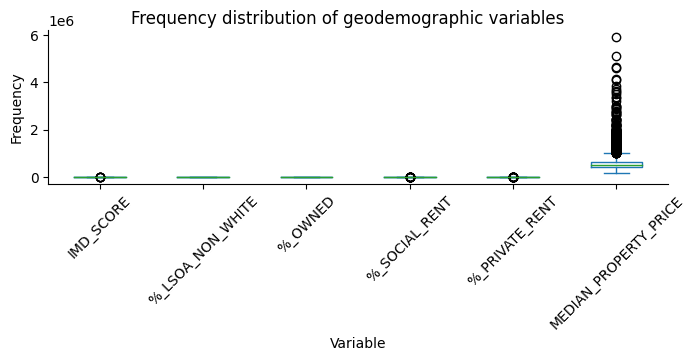

In [190]:
# Visualising the distribution of the geodemographic variables
df = pd.DataFrame(data = lsoa, columns = ['IMD_SCORE', '%_LSOA_NON_WHITE', '%_OWNED', '%_SOCIAL_RENT',
                   '%_PRIVATE_RENT', 'MEDIAN_PROPERTY_PRICE'])
df.plot(kind='box', figsize = (8,2))

# Setting axis labels, orientation, and title
plt.xlabel('Variable')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.suptitle('Frequency distribution of geodemographic variables')

sns.despine()

plt.show()

Above, it is clear that the geodemographic variables do not exist on the same scale. Using such disparate scales would distort subsequent analysis and so each variable can be standardised to exist on the same scale. To do this, Z-scores, which represent the distance of a value from the mean of its sample, will be calculated.

In [191]:
# Calculating the Z-scores of each geodemographic variable
z_scores = lsoa[['IMD_SCORE', '%_LSOA_NON_WHITE', '%_OWNED',
       '%_SOCIAL_RENT', '%_PRIVATE_RENT', 'MEDIAN_PROPERTY_PRICE']].apply(zscore)

# Viewing the head of the standardised dataframe
display(z_scores.head(2))

,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,MEDIAN_PROPERTY_PRICE
0,1.331168,-0.416994,-0.114533,0.862690,-1.037702,-0.854216
1,0.440910,0.178266,0.061806,-0.104044,0.049198,-0.432305


In [192]:
# Changing the standardised column names 
col_dict = {'IMD_SCORE': 'STD_IMD_SCORE',
            '%_LSOA_NON_WHITE': 'STD_PC_LSOA_NON_WHITE',
            '%_OWNED': 'STD_PC_OWNED',
            '%_SOCIAL_RENT': 'STD_PC_SOCIAL_RENT',
            '%_PRIVATE_RENT': 'STD_PC_PRIVATE_RENT',
            'MEDIAN_PROPERTY_PRICE': 'STD_MEDIAN_PROPERTY_PRICE'}

z_scores.rename(columns = col_dict,inplace = True)

# Viewing the head of the renamed and standardised dataframe
display(z_scores.head(2))

,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE
0,1.331168,-0.416994,-0.114533,0.862690,-1.037702,-0.854216
1,0.440910,0.178266,0.061806,-0.104044,0.049198,-0.432305


In [193]:
# Joining the Z-score geodemographic variables to the 'lsoa' dataframe
lsoa = pd.concat([lsoa, z_scores], axis = 1)

In [194]:
# Viewing the head of the resulting dataframe
display(lsoa.head(2))

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,index,MEDIAN_PROPERTY_PRICE,POPULATION,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18...",35.895,36.40,46.365422,38.899804,14.734774,28047,265000.0,1634,1.331168,-0.416994,-0.114533,0.862690,-1.037702,-0.854216
1,E01000035,Barking and Dagenham 010A,549957,185575,0.161380,51.5491,3609.905134,47eef4c6-f44f-43c7-ba2f-bd8a4e62b5ee,"POLYGON ((550266.910 185957.709, 550269.100 18...",26.175,47.42,50.083472,20.701169,29.215359,28048,420000.0,1855,0.440910,0.178266,0.061806,-0.104044,0.049198,-0.432305


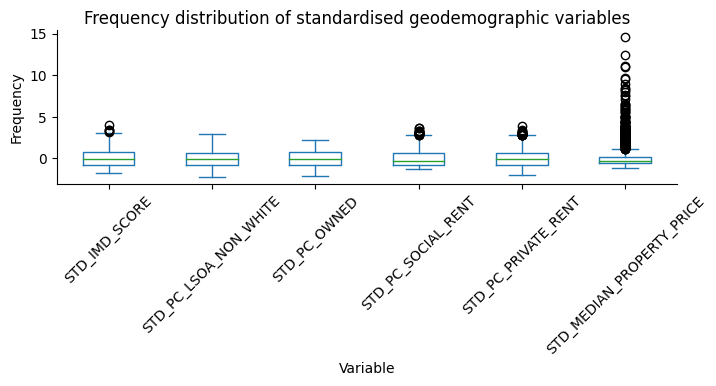

In [195]:
# Visualising the distribution of the standardised geodemographic variables
df = pd.DataFrame(data = lsoa, columns = ['STD_IMD_SCORE', 'STD_PC_LSOA_NON_WHITE', 'STD_PC_OWNED', 'STD_PC_SOCIAL_RENT',
                   'STD_PC_PRIVATE_RENT', 'STD_MEDIAN_PROPERTY_PRICE'])
df.plot(kind='box', figsize = (8,2))

# Setting axis labels, orientation, and title
plt.xlabel('Variable')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.suptitle('Frequency distribution of standardised geodemographic variables')

sns.despine()

plt.show()

Satisfied that each geodemographic variable is now standardised and suitable for analysis, we can check the general attributes of the geodataframe.

In [196]:
# Checking the data types of the geodataframe
lsoa.dtypes

LSOA11CD                       object
LSOA11NM                       object
BNG_E                           int64
BNG_N                           int64
LONG_                         float64
LAT                           float64
Shape_Leng                    float64
GlobalID                       object
geometry                     geometry
IMD_SCORE                     float64
%_LSOA_NON_WHITE              float64
%_OWNED                       float64
%_SOCIAL_RENT                 float64
%_PRIVATE_RENT                float64
index                           int64
MEDIAN_PROPERTY_PRICE         float64
POPULATION                      int64
STD_IMD_SCORE                 float64
STD_PC_LSOA_NON_WHITE         float64
STD_PC_OWNED                  float64
STD_PC_SOCIAL_RENT            float64
STD_PC_PRIVATE_RENT           float64
STD_MEDIAN_PROPERTY_PRICE     float64
dtype: object

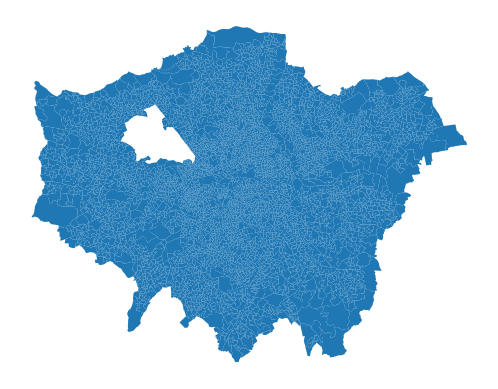

In [197]:
# Checking the spatial plot of the geodataframe
ax = lsoa.plot()
ax.set_axis_off()

The 'lsoa' dataframe now contains only the LSOA in London and does not contain any NaN values. It has appropriate data types for further analysis and is correctly spatially plotted (with the gap being the result of removing Brent LSOA). As such, it is suitable for use in analysis.

## 5. Data analysis & results

### 5.1. RQ1- Are planning applications spatially variable across London, and are they associated with area geodemographic characteristics?

Research Question 1 aims to understand the spatial distribution of planning applications submitted to the 33 planning authorities in London, and assess whether variations in the spatial distribution are associated with area geodemographic characteristics. To do so, the point distributions of applications will first be examined to provide context. Next, the spatial density of planning applications in LSOA will be assessed using the standardised metric of 'Planning applications per 1,000 persons'. This is used over a raw count of the number of applications in an LSOA to account for population variation between LSOA. Calculating the spatial density of planning applications subsequently enables spatial clustering to be conducted which will identify whether there are underlying spatial patterns in the data. Finally, to understand whether spatial variability in planning applications across London is associated with LSOA geodemographic characteristics, both Ordinary Least Squares (OLS) and Geographically Weighted Regression (GWR) will be employed.

#### 5.1.1. Are planning applications spatially variable across London?

In this section, the point distribution of planning applications is presented for context and the spatial density of planning applications per 1,000 persons in an LSOA is visualised.

**Spatial distribution of planning applications**

The geocoding process in Section 4.1.4 returns the coordinates of the closest match to the given address in the Google Maps API, meaning that some coordinates returned may not actually be in London. As such, the spatial extent of the applications will be clipped to the extent of the polygons of London LSOA in the 'lsoa' geodataframe. This will keep only those applications with geocoded coordinates in London.

In [198]:
# Setting the CRS of the 'applications' geodataframe
applications = applications.to_crs('EPSG:27700')

# Setting the CRS of the 'LSOA' geodataframe
lsoa = lsoa.to_crs('EPSG:27700')

# Checking that this has worked
print(f'CRS of applications geodataframe: {applications.crs}')
print(f'CRS of lsoa geodataframe: {lsoa.crs}')

CRS of applications geodataframe: EPSG:27700
CRS of lsoa geodataframe: EPSG:27700


In [199]:
# Creating an outline of the LSOA boundaries to define the spatial extent
lsoa['outline'] = 1
lsoa_outline = lsoa.dissolve(by = 'outline')

In [200]:
# Checking the number of applications
print(f'Number of applications: {applications.shape[0]}')

Number of applications: 26042


In [201]:
# Clipping the spatial extent of the applications to the extent of the LSOA boundaries
applications = gpd.clip(applications, lsoa_outline)

In [202]:
# Checking the number of applications
print(f'Number of applications: {applications.shape[0]}')

Number of applications: 25996


Comparing the number of applications in the dataframe before and after the spatial clip indicates that 46 applications had geocoded addresses outside of the extent of London LSOA. These have been removed, leaving 25,996 applications. The point distribution of these applications can now be visualised for context.

In [203]:
applications

,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS,BINARY_OUTCOME,long,lat,geometry
9566,Lawful Development Certificate (Proposed) for ...,24 Heathview Avenue Crayford Dartford Kent DA1...,22/00743/LDCP,Certificate of Lawfulness Granted,Bexley,3028a710-e08b-4af3-a28d-0c842e991038,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",1,0.178474,51.445041,POINT (551488.613 174034.075)
9411,Alterations to and partial retention of bounda...,24 Heath Road Crayford Dartford Kent DA1 3NP,22/00540/FUL,Permission Granted with Conditions,Bexley,e39e7f50-33e3-4058-931e-8aba6af6095e,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",1,0.185705,51.448512,POINT (551979.570 174434.968)
9580,"Details of conditions 3(CDM), 4(WSI - partial ...",86 Crayford Road Crayford Dartford Kent,21/01651/FUL01,Details approved,Bexley,7ef2d14b-219b-499c-b7c7-44bf2456f2b8,1.0,Change of use,"['use', 'class', 'building', 'associated', 'pa...","['variation drawings, land use restriction, op...",1,0.182447,51.449911,POINT (551748.533 174583.849)
9468,Details of condition 5 (Parking Management Pla...,1 Tower Retail Park Crayford Road Crayford Dar...,21/01849/FULM01,Details approved,Bexley,ae27e370-fc42-4606-b88d-1323040ea208,1.0,Change of use,"['use', 'class', 'building', 'associated', 'pa...","['variation drawings, land use restriction, op...",1,0.182109,51.450835,POINT (551721.982 174685.851)
5867,Two storey side extension and ground floor rea...,12 Hookwood Cottages Hookwood Road Orpington B...,22/00461/FULL6,Application Refused,Bromley,cb5c5dfb-fc3c-418a-879a-faf7480aa766,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",0,0.114150,51.336180,POINT (547368.001 161798.009)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21123,Existing use of an attached longitudinal garag...,21 GATEWAY CLOSE NORTHWOOD MIDDLESEX HA6 2RW,72265/APP/2022/571,Refusal,Hillingdon,840f6d20-8b0d-4e2f-8c02-643b66f88dd6,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",0,-0.438142,51.615590,POINT (508235.141 191906.499)
20911,To carry out tree surgery including a height r...,43 MOOR PARK ROAD NORTHWOOD,11879/TRE/2022/28,Approval,Hillingdon,b3ce6258-8ad8-441e-90d5-e2cda00d7675,2.0,Tree works,"['reduce', 'crown', 'tree', 'remove', 'garden'...",['rear garden x robinia reduce crown previous ...,1,-0.434057,51.616315,POINT (508516.258 191993.167)
20537,Erection of single storey rear and front exten...,9 SANDY LODGE WAY NORTHWOOD,5523/APP/2022/93,Approval,Hillingdon,00acaa40-e793-4c06-827d-25b63357861c,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",1,-0.426936,51.616281,POINT (509009.314 191999.939)
21317,"Erection of a part single storey, part two sto...",36 MOOR PARK ROAD NORTHWOOD HA6 2DJ,77170/APP/2022/1000,Approval,Hillingdon,ee7eda79-a801-45bc-a21b-2e42a7fced57,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",1,-0.432208,51.616650,POINT (508643.468 192033.222)


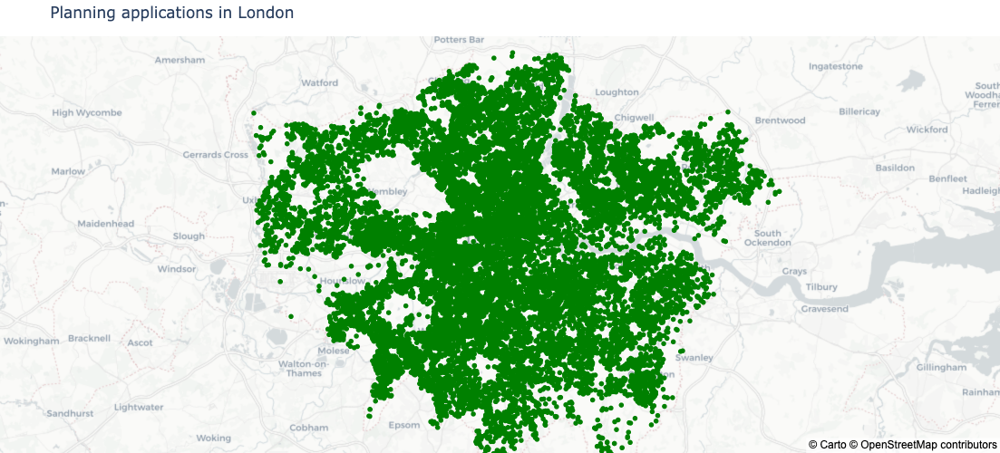

In [204]:
# Plotting the point distribution of the clipped applications
import plotly.express as px

# Making a new instance of the clipped dataframe to avoid interference and setting the CRS to plotly default
geo_df = applications.to_crs('EPSG: 4326')

# Plotting the figure
fig = px.scatter_mapbox(geo_df, lat="lat", lon="long", hover_name="address", zoom=9, height=500, color_discrete_sequence=['green'],
                        custom_data=[geo_df['DESC_TOPIC'], geo_df['decision'], geo_df['authority']])

# Styling the hover text
hovertemp = '<b>Modelled description topic:</b> %{customdata[0]}<br>'
hovertemp += '<b>Application decision:</b> %{customdata[1]}<br>'
hovertemp += '<b>Planning authority:</b> %{customdata[2]}<br>'

# Updating the layout parameters
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.update_traces(hovertemplate=hovertemp)
fig.update_layout(title='Planning applications in London')

fig.show('jupyterlab')

**Spatial density of planning applications**

While the above point distribution is useful for identifiying individual planning applications and gaining a contextual sense of the spatial distribution, to understand the spatial variability of applications their spatial density needs to be calculated. To do so, a spatial intersect is first used to identify the applications in each LSOA.

In [205]:
# Spatial intersect to find the applications that are located within each LSOA
applications = gpd.sjoin(applications, lsoa, predicate='intersects')

# Viewing the head of the dataframe
display(applications.head(2))

,description,address,metadata,decision,authority,ID,DESC_TOPIC_NO,DESC_TOPIC,DESC_TOPIC_REP,DESC_TOPIC_DOCS,BINARY_OUTCOME,long,lat,geometry,index_right,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,index,MEDIAN_PROPERTY_PRICE,POPULATION,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE,outline
9566,Lawful Development Certificate (Proposed) for ...,24 Heathview Avenue Crayford Dartford Kent DA1...,22/00743/LDCP,Certificate of Lawfulness Granted,Bexley,3028a710-e08b-4af3-a28d-0c842e991038,0.0,Extension,"['extension', 'rear', 'storey', 'single', 'roo...","['erection single storey rear extension', 'ere...",1,0.178474,51.445041,POINT (551488.613 174034.075),343,E01000379,Bexley 019F,551640,174156,0.18073,51.4461,3659.320213,91eba206-92d2-4328-a846-a757c3e47835,18.601,19.91,71.644042,15.686275,12.669683,28395,358290.0,1816,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028,1
9580,"Details of conditions 3(CDM), 4(WSI - partial ...",86 Crayford Road Crayford Dartford Kent,21/01651/FUL01,Details approved,Bexley,7ef2d14b-219b-499c-b7c7-44bf2456f2b8,1.0,Change of use,"['use', 'class', 'building', 'associated', 'pa...","['variation drawings, land use restriction, op...",1,0.182447,51.449911,POINT (551748.533 174583.849),343,E01000379,Bexley 019F,551640,174156,0.18073,51.4461,3659.320213,91eba206-92d2-4328-a846-a757c3e47835,18.601,19.91,71.644042,15.686275,12.669683,28395,358290.0,1816,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028,1


Each application now has a column containing its respective LSOA code. We can group the dataframe by LSOA code to get the sum of planning applications in each LSOA.

In [206]:
# Grouping by LSOA code and counting the number of applications in each LSOA
applications_in_lsoa = applications.groupby('LSOA11CD').agg({'ID': 'count'})

# Resetting the index
applications_in_lsoa = applications_in_lsoa.reset_index()

# Renaming the 'metadata' column
applications_in_lsoa.rename(columns = {'ID': 'APPLICATIONS'}, inplace = True)

# Viewing the head of the dataframe
display(applications_in_lsoa.head(2))

,LSOA11CD,APPLICATIONS
0,E01000001,5
1,E01000002,13


This grouped dataframe can now be joined to the 'lsoa' geodataframe made in Section 4.3.5 to get the polygon geometries of each LSOA.

In [207]:
# Joining the dataframe to the 'lsoa' dataframe to get the polygon geometries of each LSOA
applications_in_lsoa = lsoa.join(applications_in_lsoa.set_index('LSOA11CD'), on = 'LSOA11CD')

# Dropping the now unnecessary 'outline' column made in the previous section
applications_in_lsoa = applications_in_lsoa.drop(['outline'], axis = 1)

# Viewing the head of the dataframe
display(applications_in_lsoa.head(2))

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,index,MEDIAN_PROPERTY_PRICE,POPULATION,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE,APPLICATIONS
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18...",35.895,36.40,46.365422,38.899804,14.734774,28047,265000.0,1634,1.331168,-0.416994,-0.114533,0.862690,-1.037702,-0.854216,8.0
1,E01000035,Barking and Dagenham 010A,549957,185575,0.161380,51.5491,3609.905134,47eef4c6-f44f-43c7-ba2f-bd8a4e62b5ee,"POLYGON ((550266.910 185957.709, 550269.100 18...",26.175,47.42,50.083472,20.701169,29.215359,28048,420000.0,1855,0.440910,0.178266,0.061806,-0.104044,0.049198,-0.432305,4.0


In [208]:
# Checking the number of LSOA without a submitted planning application
print(f'Number of LSOA without a planning application: {applications_in_lsoa.APPLICATIONS.isna().sum()}')

Number of LSOA without a planning application: 489


By checking the number of NaN values in the dataframe, we can see that no planning applications were submitted between 01-01-2022 and 31-03-2022 in 489 (10%) of the London LSOA. These NaN will be replaced with 0- if they were removed, it would lead to information loss in subsequent spatial analysis.

As LSOA may differ slightly in population, the number of applications per LSOA will be standardised as the 'Number of planning applications per 1,000 persons' in an LSOA using the 'population' column of each LSOA.

In [209]:
# Replacing NaN with 0
applications_in_lsoa = applications_in_lsoa.fillna(0)

In [210]:
# Calculating the number of planning applications per 1,000 persons in an LSOA
applications_in_lsoa['APPLICATIONS_1000_PERSONS'] = (applications_in_lsoa['APPLICATIONS']/applications_in_lsoa['POPULATION'])*1000

# Viewing the head of the dataframe
display(applications_in_lsoa.head(2))

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,index,MEDIAN_PROPERTY_PRICE,POPULATION,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE,APPLICATIONS,APPLICATIONS_1000_PERSONS
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18...",35.895,36.40,46.365422,38.899804,14.734774,28047,265000.0,1634,1.331168,-0.416994,-0.114533,0.862690,-1.037702,-0.854216,8.0,4.895961
1,E01000035,Barking and Dagenham 010A,549957,185575,0.161380,51.5491,3609.905134,47eef4c6-f44f-43c7-ba2f-bd8a4e62b5ee,"POLYGON ((550266.910 185957.709, 550269.100 18...",26.175,47.42,50.083472,20.701169,29.215359,28048,420000.0,1855,0.440910,0.178266,0.061806,-0.104044,0.049198,-0.432305,4.0,2.156334


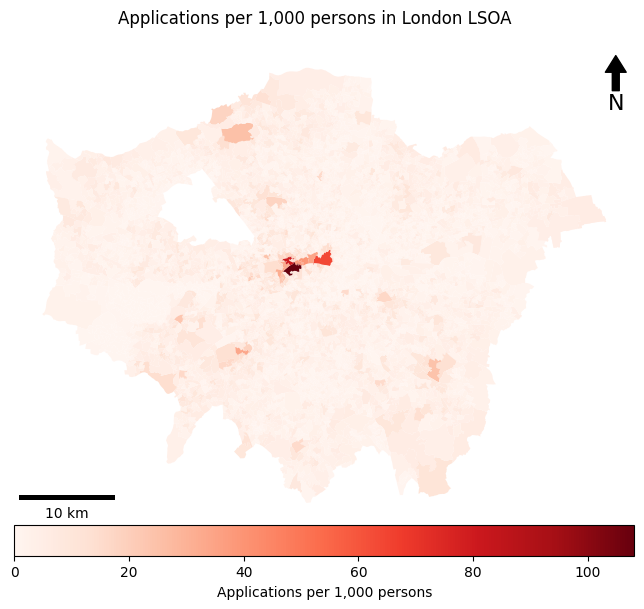

In [211]:
# Plotting the choropleth distribution of planning applications
fig, ax = plt.subplots(1,1, figsize = (8,8))

applications_in_lsoa.plot(column = "APPLICATIONS_1000_PERSONS", ax = ax, legend = True, edgecolor = "none", cmap = "Reds",
                              legend_kwds = {"label": "Applications per 1,000 persons", "orientation":"horizontal", "pad": 0}, 
                               missing_kwds = {"color": "grey"})

fig.suptitle("Applications per 1,000 persons in London LSOA", y = 0.87) # Adding a figure title

scalebar = ScaleBar(dx = 1, location = "lower left", scale_loc = "bottom") # Defining the scalebae
ax.add_artist(scalebar) # Adding scalebar

cartoee.add_north_arrow(ax, text = "N", xy=(0.97, 0.98), text_color = "black", arrow_color = "black", fontsize = 16) # North arrow

ax.set_axis_off() # Removing axis

The above map indicates that in many LSOA there are few planning applications submitted per 1,000 persons. It also suggests that there is a level of spatial variability in the number of planning applications per 1,000 persons between London LSOA. LSOA such as Southwark 002D and Richmond upon Thames 008B respectively saw over 10 and 20 planning applications per 1,000 persons submitted between January-March 2022, whilst in LSOA such as Croydon 025D and Kingston 020E, approximately 1 planning application was submitted per 1,000 persons. There are also over 400 LSOA in which no planning application was submitted.

#### 5.1.2. Spatial clustering of planning applications

To further investigate the spatial distribution of the number of planning applications per 1,000 persons in London LSOA, spatial clustering can be employed. This will indicate whether there are random or non-random clustering patterns between neighbouring LSOA, and thus whether there are spatial patterns in the data. To do so, a K-Nearest Neighbours (KNN) approach will be used. This is used over a Queen or Rook approach to spatial clustering because, being a distance-based measure, KNN is not affected by 'islands' (LSOA that do not share a non-zero length common border with any neighbours) which are feasible given the number of LSOA without a submitted planning application.

In [212]:
# Calculating the square root of the LSOA length
math.sqrt(len(applications_in_lsoa))

68.27884006044626

In [213]:
# Calculating the spatial weights using KNN neighbours
    # A choice of 69 neighbours is made because above it is identified that 68.28 is the square root of 
    #the 'applications_in_lsoa' length, and so we round up to the nearest integer
w_k = weights.KNN.from_dataframe(applications_in_lsoa, k = 69)

In [214]:
# Printing the KNN neighbours summary statistics
print(f"-KNN number of LSOA is {w_k.n}")
print(f"-Mean number of KNN neighbours is {w_k.mean_neighbors}")
print(f"-Minimum number of KNN neighbours is {w_k.min_neighbors}")
print(f"-Maximum number of KNN neighbours is {w_k.max_neighbors}")
print(f"-KNN islands: {w_k.islands}")

-KNN number of LSOA is 4662
-Mean number of KNN neighbours is 69.0
-Minimum number of KNN neighbours is 69
-Maximum number of KNN neighbours is 69
-KNN islands: []


Above, we can see that the weights have worked correctly as each LSOA has 69 neighbours and there are no islands present. Now, we can calculate the Moran's I value to identify the strength and significance of spatial clustering in the data.

In [215]:
# Calculating the Moran's I of the number of applications per 1,000 persons using the KNN weights
mi = esda.Moran(applications_in_lsoa['APPLICATIONS_1000_PERSONS'], w_k)

# Printing the value of Moran's I (the level of spatial clustering in the number of applications
# between London LSOA)
print(mi.I)

0.14837371077028358


In [216]:
# Printing the p- value of the Moran's I (the strength of the statistical significance of
# any spatial clustering)
print(mi.p_sim)

0.001


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.15)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

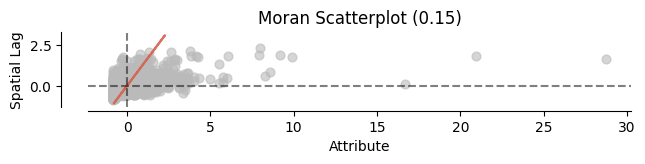

In [217]:
# Creating the Moran scatterplot
moran_scatterplot(mi)

In [218]:
# Running the LISA model of the number of applications, using the KNN weights again
lisa = esda.Moran_Local(applications_in_lsoa['APPLICATIONS_1000_PERSONS'], w_k)

(<Figure size 640x480 with 1 Axes>, <Axes: >)

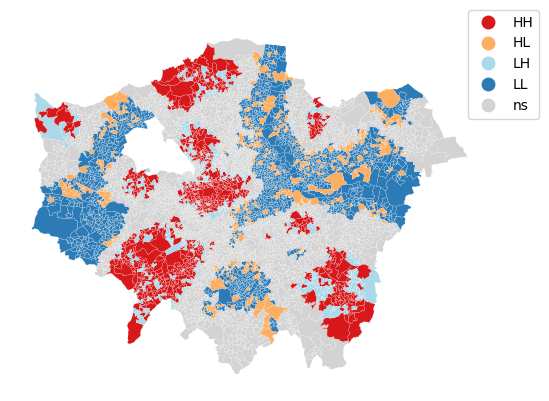

In [219]:
# # Plotting the LISA map of the residuals
lisa_cluster(lisa, applications_in_lsoa, legend_kwds={'loc': 'upper right', 'bbox_to_anchor': (1.12, 1.05)})

The statistically significant Moran's I value of 0.15 suggests that there is a level of spatial clustering and autocorrelation in the data, an insight that is supported by the Moran's I scatterplot in which values are concentrated around the x-axis and the linear line is strongly positive. This suggests that there are clusters of similar numbers of planning applications submitted per 1,000 persons amongst neighbouring LSOA and that this clustering is unlikely to be due to chance alone, suggesting that there are underlying spatial processes and autocorrelation within the data.

These clusters are visualised in the LISA cluster map where, as expected given the number of LSOA without a submitted planning application, there are large clusters of LSOA that share similarly low numbers of planning applications submitted per 1,000 persons (LL). Though there are also large clusters of LSOA that share similarly high numbers of planning applications submitted per 1,000 persons (HH), such as in the South West of the city. 

Comparatively, there are relatively few clusters in which LSOA with a high number of planning applications submitted per 1,000 persons are neighboured by LSOA with a low number of planning applications submitted per 1,000 persons, or vice-versa. These findings indicate that there is a level of spatial autocorrelation in the data and, practically, they mean that similar numbers of planning applications submitted per 1,000 persons are found between neighbouring LSOA.

#### 5.1.3. Ordinary Least Squares (OLS)

To attempt to understand the factors behind these spatial patterns, associations between the number of planning applications submitted per 1,000 persons in an LSOA and the geodemographic characteristics of an LSOA can be assessed. Despite the presence of spatial autocorrelation in the data, the first step in this understanding is to employ OLS regression.

As all geodemographic variables were standardised using Z-scores in Section 4.3.5, we must also standardise the response variable 'APPLICATIONS_1000_PERSONS'.

In [220]:
# Standardising the 'APPLICATIONS_1000_PERSONS' variable
applications_in_lsoa['STD_APPLICATIONS_1000_PERSONS'] = stats.zscore(applications_in_lsoa['APPLICATIONS_1000_PERSONS'])

In [221]:
# Keeping only the columns of relevance
apps_geodems = applications_in_lsoa[['STD_APPLICATIONS_1000_PERSONS', 'STD_IMD_SCORE', 'STD_PC_LSOA_NON_WHITE',
                                     'STD_PC_OWNED', 'STD_PC_SOCIAL_RENT', 'STD_PC_PRIVATE_RENT', 'STD_MEDIAN_PROPERTY_PRICE']]

OLS assumes that multicollinearity is not present and so the heatmap below will be used to validate this assumption.

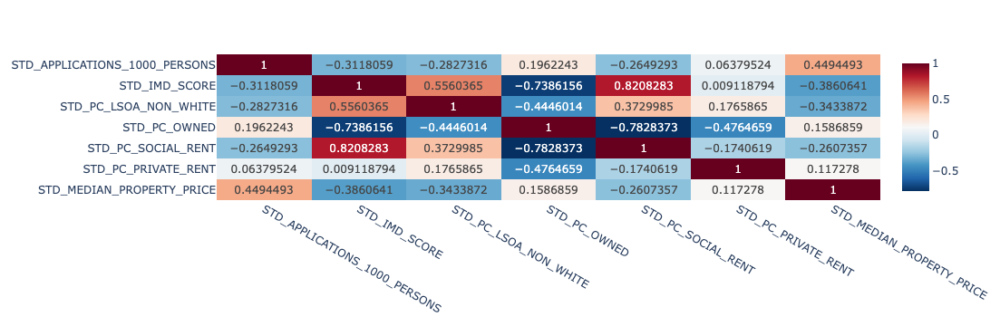

In [222]:
# Plotting the heatmap
import plotly.express as px

fig = px.imshow(apps_geodems.corr(), text_auto = True, aspect = "auto", color_continuous_scale = 'RdBu_r',)

hovertemplate='X: %{x}<br>Y: %{y}<br>Coefficient: %{z}<extra></extra>'

fig.update_traces(hovertemplate=hovertemplate)

fig.show('jupyterlab')

On the whole, we can see that there are relatively low correlations between each variable. The one notable exception to this is the correlation between the proportion of housing in an LSOA of social rent tenure type and the IMD score of an LSOA with a correlation coefficient of 0.82. Such a coefficient indicates a high level of multicollinearity, effectively indicating that both variables provide the same information. As such, the 'STD_PC_SOCIAL_RENT' variable will be removed.

In [223]:
# Assigning the dependent variable to 'y' and independent to 'X'
y = applications_in_lsoa['STD_APPLICATIONS_1000_PERSONS']
X = applications_in_lsoa[['STD_IMD_SCORE', 'STD_PC_LSOA_NON_WHITE', 'STD_PC_OWNED', 
                          'STD_PC_PRIVATE_RENT', 'STD_MEDIAN_PROPERTY_PRICE']]

In [224]:
# Adding the constant to 'X'
x1 = sm.add_constant(X)

# Creating the model
mod = sm.OLS(y, x1)

# Fitting the model
results = mod.fit()

# Printing the results
def lm_spatial_v1():
    print(results.summary())
    
lm_spatial_v1()

                                  OLS Regression Results                                 
Dep. Variable:     STD_APPLICATIONS_1000_PERSONS   R-squared:                       0.235
Model:                                       OLS   Adj. R-squared:                  0.234
Method:                            Least Squares   F-statistic:                     285.3
Date:                           Thu, 24 Aug 2023   Prob (F-statistic):          5.66e-267
Time:                                   09:25:38   Log-Likelihood:                -5992.1
No. Observations:                           4662   AIC:                         1.200e+04
Df Residuals:                               4656   BIC:                         1.203e+04
Df Model:                                      5                                         
Covariance Type:                       nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
------

The results of this OLS model indicate that there are statistically significant positive associations between the planning applications submitted per 1,000 persons in an LSOA and the proportion of housing that is owned and the proportion of housing that is privately rented, with a one-unit increase in both geodemographic variables resulting in a respective increase of 0.12 and 0.10 in the number of planning applications submitted per 1,000 persons in an LSOA whilst holding all other variables constant (p<0.05). 

On the other hand, a one-unit increase in the proportion of persons in an LSOA from a non-white ethnic background results in a statistically significant (p<0.05) decrease of -0.01 in the number of planning applications submitted per 1,000 persons whilst holding all other variables constant, while the same change in the IMD score of an LSOA leads to a decrease of -0.02 in the number of planning applications submitted per 1,000 persons in an LSOA whilst holding all other variables constant, though this association is not statistically significant (p = 0.471). Similarly, a one-unit increase in the median property sale price of an LSOA is associated with a slight but statistically significant (p<0.05) increase in the number of planning applications submitted per 1,000 persons in an LSOA whilst holding all other variables constant. Overall, the model accounts for only 23% of the variation in the number of planning applications submitted per 1,000 persons (Adj R2 = 0.234), meaning that other factors that have not been assessed are likely to contribute to this variation.

Using the residuals from this model, we can begin to identify whether the associations between the number of planning applications submitted per 1,000 persons in an LSOA and the geodemographic characteristics of an LSOA vary spatially. 

In [225]:
# Assigning the residuals of the linear regression model to a new column in the 'applications_in_lsoa' dataframe
applications_in_lsoa['LM_res'] = results.resid

In [226]:
# Calculating the Moran's I value for the linear model residuals, using the same KNN weights made previously
mi = esda.Moran(applications_in_lsoa['LM_res'], w_k) 

In [227]:
# Printing the Moran's I value
print(mi.I)

0.07493538189541608


In [228]:
# Printing the statistical significance of the Moran's I value
print(mi.p_sim)

0.001


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.07)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

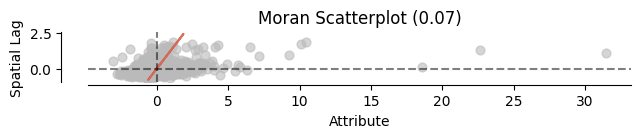

In [229]:
# Creating the Moran scatterplot
moran_scatterplot(mi)

In [230]:
# Running the LISA model on the residuals, using the KNN weights again
lisa = esda.Moran_Local(applications_in_lsoa['LM_res'], w_k)

(<Figure size 640x480 with 1 Axes>, <Axes: >)

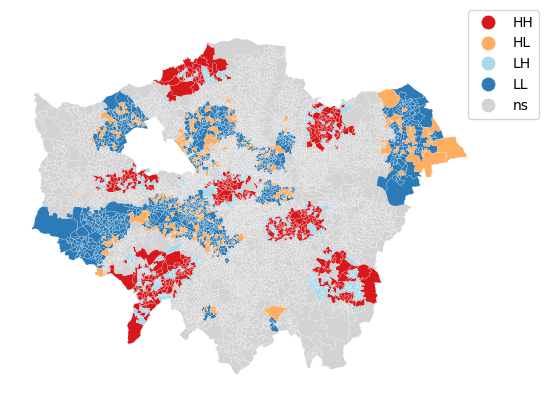

In [231]:
# Plotting the LISA map of the residuals
lisa_cluster(lisa, applications_in_lsoa, legend_kwds={'loc': 'upper right', 'bbox_to_anchor': (1.12, 1.05)})

The level of spatial autocorrelation in the data remains statistically significant and positive with a Moran's I value of 0.07. Though, in comparison to the Moran's I calculated on the raw data, the level of spatial autocorrelation has reduced. This can also be seen in the LISA cluster map in which there are fewer clusters, indicating that the OLS model has captured a degree of the spatial autocorrelation. However, some clusters remain, particularly those of the 'LL' type which represent LSOA of lower than expected predicted results (i.e. where the association strength between the number of planning applications submitted per 1,000 persons in an LSOA and the geodemographic variables of an LSOA is less than expected) that are neighboured by LSOA with similarly low residuals. 

This is not unexpected given the number of LSOA without a submitted planning application, but these results indicate that the data is not independent and that the underlying spatial processes have not yet been fully accounted for. To this end, a Geographically Weighted Regression model can be used to capture the maximum variation and understand whether the associations vary spatially.

#### 5.1.4. Geographically Weighted Regression (GWR)

GWR models how associations between variables differ over space by accounting for spatial autocorrelation. The first step in the modelling is to define the variables of interest- though here, the 'STD_IMD_SCORE' variable has been removed due to its lack of a statistically significant association with the number of planning applications submitted per 1,000 persons in an LSOA in the previous OLS model.  

In [232]:
# Creating a list of x and y coordinates
g_coords = list(zip(applications_in_lsoa.LONG_, applications_in_lsoa.LAT))

# Defining x and y variables
g_y = np.asarray(applications_in_lsoa['STD_APPLICATIONS_1000_PERSONS']).reshape((-1,1))
g_X = np.asarray(applications_in_lsoa[['STD_PC_LSOA_NON_WHITE','STD_PC_OWNED','STD_PC_PRIVATE_RENT', 
                                       'STD_MEDIAN_PROPERTY_PRICE']]).reshape((-1,4))

In [233]:
# Setting parameters to calculate the optimal bandwidth
gwr_selector = Sel_BW(g_coords, g_y, g_X, spherical = False, fixed = False)

# Calculating the optimal bandwidth
bw = gwr_selector.search()

print(bw)

95.0


In [234]:
# Producing the model using the optimal bandwidth
gwr = GWR(g_coords, g_y, g_X, bw)

# Fitting the model
gwr_results = gwr.fit()

# Printing the model summary
print(gwr_results.summary())

Model type                                                         Gaussian
Number of observations:                                                4662
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           3568.966
Log-likelihood:                                                   -5992.322
AIC:                                                              11994.643
AICc:                                                             11996.661
BIC:                                                             -35769.643
R2:                                                                   0.234
Adj. R2:                                                              0.234

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

The GWR model accounts for 44% of the variation in the number of planning applications submitted per 1,000 persons in an LSOA compared to only 23% in the previous OLS model, representing an improvement in the model fit. Results indicate that the associations between the number of planning applications submitted per 1,000 persons in an LSOA  and the geodemographic variables of an LSOA differ across space. In some LSOA, for instance, a one-unit increase in the proportion of persons from a non-white background (X1) is associated with an increase of 1.1 in the number of planning applications submitted per 1,000 persons in an LSOA, whilst in other LSOA the same change is associated with a decrease of -3.08 in the number of planning applications submitted per 1,000 persons in an LSOA.

Similarly, in some LSOA a one-unit increase in the proportion of housing of private rental tenure type (X3) is associated with an increase of 1.96 in the number of planning applications submitted per 1,000 persons in an LSOA, but in others the same change is associated with a decrease of -0.37 in the number of planning applications submitted per 1,000 persons in an LSOA. 

When considering the proportion of housing of owned tenure type (X2), the range of variation increases, with a one- unit increase in some LSOA associated with an increase of 1.16 in the number of planning applications submitted per 1,000 persons in an LSOA, but a decrease of -4.4 in other LSOA. The results also indicate that the median property sale price in an LSOA has a variable association with the number of planning applications submitted per 1,000 persons in an LSOA, with a mean coefficient of 0.44 and a range of 2.85.

Overall, these results illustrate that there is spatial variation in the associations between the number of planning applications submitted per 1,000 persons in an LSOA and the geodemographic characteristics of the proportion of persons from a non-white ethnic background, the proportion of housing of owned and privately rented tenure types, and the median house sale price in an LSOA. To validate these results and understand the extent of spatial autocorrelation captured by the model, and thus the fit of the model, the spatial autocorrelation of the model residuals can be assessed.

In [235]:
# Assigning the residuals of the GWR model to a new column in the 'applications_in_lsoa' dataframe
applications_in_lsoa['GWR_res'] = gwr_results.resid_response

In [236]:
# Calculating the Moran's I value of the GWR model residuals
mi = esda.Moran(applications_in_lsoa['GWR_res'], w_k)

In [237]:
# Printing the Moran's I value
print(mi.I)

-0.01061260349387147


In [238]:
# Printing the statistical significance of the Moran's I value
print(mi.p_sim)

0.001


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (-0.01)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

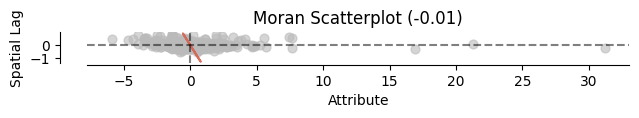

In [239]:
# Creating the Moran scatterplot
moran_scatterplot(mi)

In [240]:
# Running the LISA model on the residuals
lisa = esda.Moran_Local(applications_in_lsoa['GWR_res'], w_k)

(<Figure size 640x480 with 1 Axes>, <Axes: >)

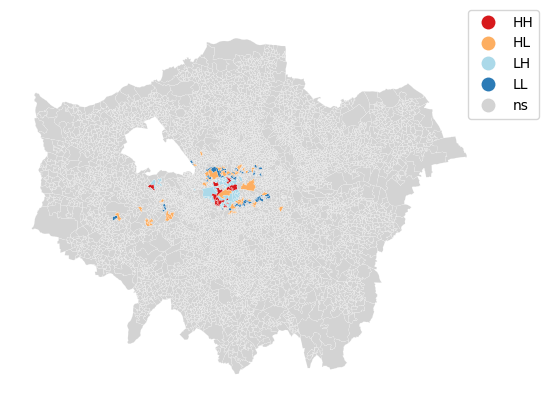

In [241]:
# Plotting the LISA map of the residuals
lisa_cluster(lisa, applications_in_lsoa, legend_kwds={'loc': 'upper right', 'bbox_to_anchor': (1.12, 1.05)})

Immediately, it is clear that the level of spatial clustering has reduced to include only small clusters of diverse cluster types in central LSOA. These clusters are most commonly of the 'HL' type, indicating LSOA with high GWR residuals (i.e., those with higher than expected predicted results) neighbouring LSOA with low GWR residuals. In addition, though the Moran's I value of spatial autocorrelation remains statistically significant, the strength of the autocorrelation has reduced and the direction has reversed. Now, neighbouring LSOA are more dissimilar from each other than would be expected by chance alone with regard to the number of planning applications submitted per 1,000 persons in an LSOA. Overall, the lack of large clusters and the reduced Moran's I value suggests that the GWR model has captured much of the spatial autocorrelation in the data, indicating that the model fits the data more appropriately than the previous OLS model.

As we can be satisfied that the spatial autocorrelation has been reduced and the model fit improved, the coefficients from the GWR model can be used to visualise how associations between the number of planning applications submitted per 1,000 persons in an LSOA and the geodemographic characteristics of an LSOA vary spatially.

In [242]:
# Extracting the model coefficients for each variable
applications_in_lsoa['Apps_GWR_Beta_ETH'] = gwr_results.params[:,1]
applications_in_lsoa['Apps_GWR_Beta_OWNED'] = gwr_results.params[:,2]
applications_in_lsoa['Apps_GWR_Beta_PRIVATE'] = gwr_results.params[:,3]
applications_in_lsoa['Apps_GWR_Beta_PRICE'] = gwr_results.params[:,4]

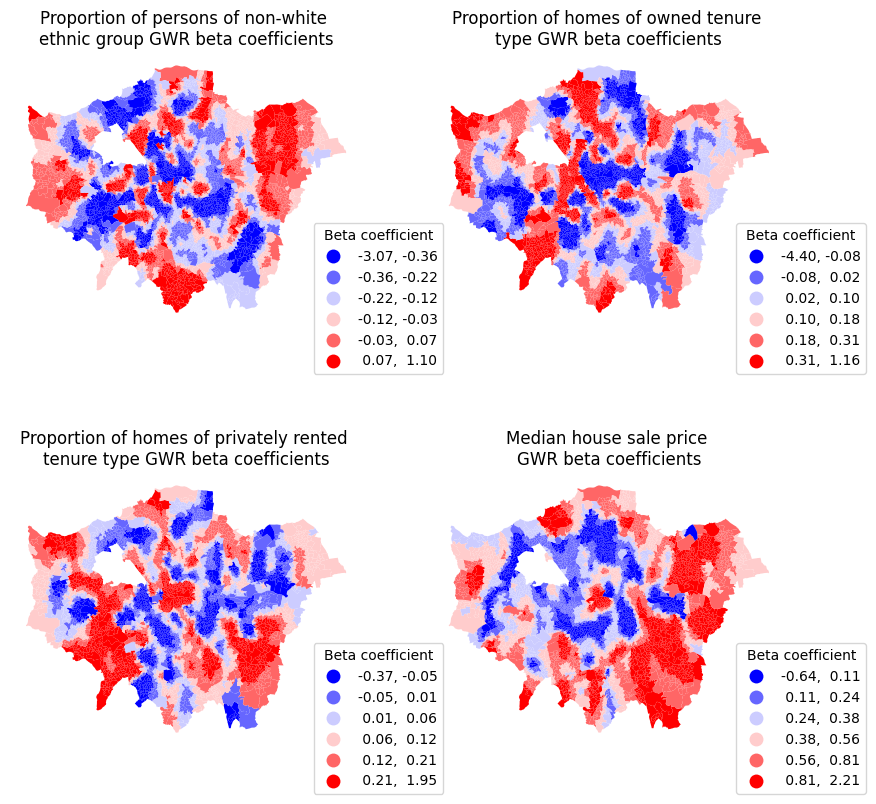

In [243]:
# Plotting how the GWR coefficients vary across space
fig = plt.figure(figsize=(10,10))

# Proportion of persons of non-white ethnic group
ax = fig.add_subplot(221)
applications_in_lsoa.plot(ax = ax,column = 'Apps_GWR_Beta_ETH', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("Proportion of persons of non-white \nethnic group GWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.25,0.4))
ax.set_axis_off()

# Proportion of homes of owned tenure type
ax = fig.add_subplot(222)
applications_in_lsoa.plot(ax = ax,column = 'Apps_GWR_Beta_OWNED', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("Proportion of homes of owned tenure \ntype GWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.25,0.4))
ax.set_axis_off()

# Proportion of homes of privately rented tenure type
ax = fig.add_subplot(223)
applications_in_lsoa.plot(ax = ax,column = 'Apps_GWR_Beta_PRIVATE', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("Proportion of homes of privately rented \ntenure type GWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.25,0.4))
ax.set_axis_off()

# Median house sale price
ax = fig.add_subplot(224)
applications_in_lsoa.plot(ax = ax,column = 'Apps_GWR_Beta_PRICE', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("Median house sale price \nGWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.25,0.4))
ax.set_axis_off()

plt.show()

Of the four geodemographic variables, the association between the number of planning applications submitted per 1,000 persons in an LSOA and the proportion of homes in an LSOA of owned tenure type exhibits the most spatial variability, with a coefficient range of 5.56. In LSOA shaded red, this association is positive whilst in LSOA shaded blue, a negative association between the two variables is seen. Similarly, the association between the number of planning applications submitted per 1,000 persons in an LSOA and the proportion of persons in an LSOA from a non-white ethnic group also exhibits spatial variability with a coefficient range of 4.17. In some LSOA, a one-unit increase in this variable is associated with an increase between 0.07 and 1.10 in the number of planning applications submitted per 1,000 persons in an LSOA, whilst in others the same change is associated with a decrease between -0.36 and -3.07 in the number of planning applications submitted per 1,000 persons in an LSOA. 

Similar spatial variability is seen in the associations between the proportion of homes in an LSOA of privately rented tenure type and the the median house sale price in an LSOA, and the number of planning applications submitted per 1,000 persons in an LSOA. Overall, these results indicate that there is spatial variation in these associations across space, but the variation also suggests that, despite having improved the model fit and attempted to capture much of the spatial autocorrelation, other factors that have not been accounted for likely also play a role in the number of planning applications submitted per 1,000 persons in an LSOA. 

### 5.2. RQ2- What are the types of planning application in London?

Using the modelled planning application topics produced in Section 4.1.2, we can gain a contextual understanding of where different types of applications are submitted. These insights could be used by marketing firms or businesses seeking to expand their reach- for instance, a firm specialising in property extensions could specifically target advertising in LSOA where the most common application type is related to an extension. They also give an insight into the context of an area, with LSOA with a high proportion of 'room conversion' planning applications perhaps indicating the presence of growing families or changing housing needs, while LSOA with a high proportion of 'external seating' applications may indicate an area with bars and restaurants seeking to expand their footprint.

The composition of planning application types between the 33 planning authorities will first be visualised to provide a high-level sense of the types of planning applications in London. Then, the modal planning application type of LSOA will be examined.

#### 5.2.1. Planning authorities

First, the number of applications per planning authority can be identified.

In [244]:
# Grouping the 'applications' dataframe by authority and counting the number of applications
applications_in_pa = applications.groupby(['authority'])['ID'].aggregate('count')

# Resetting the index
applications_in_pa = applications_in_pa.reset_index()

# Viewing the head of the grouped dataframe
display(applications_in_pa.head(2))

,authority,ID
0,Barking and Dagenham,458
1,Barnet,1563


Next, we can group the dataframe by authority and by the planning application topic, and count the number of occurrences of each.

In [245]:
# Grouping by authority and planning application topic and counting the number of applications
topics_in_pa = applications.groupby(['authority','DESC_TOPIC'])['ID'].aggregate('count')

# Resetting the index
topics_in_pa = topics_in_pa.reset_index()

# Viewing the head of the grouped dataframe
display(topics_in_pa.head(2))

,authority,DESC_TOPIC,ID
0,Barking and Dagenham,Air conditioning,6
1,Barking and Dagenham,Bus shelter advertising,1


Joining the two dataframes on the 'authority' column allows us to calculate the proportion of each topic in a planning authority.

In [246]:
# Joining the two dataframes
topics_in_pa = topics_in_pa.join(applications_in_pa.set_index('authority'), on = 'authority', rsuffix = 'r')

# Renaming columns
topics_in_pa.rename(columns = {'ID': 'TOPIC_COUNT', 'IDr': 'APPLICATION_COUNT'}, inplace = True)

# Viewing the head of the dataframe
display(topics_in_pa.head(2))

,authority,DESC_TOPIC,TOPIC_COUNT,APPLICATION_COUNT
0,Barking and Dagenham,Air conditioning,6,458
1,Barking and Dagenham,Bus shelter advertising,1,458


In [247]:
# Calculating the proportion of each topic in the total number of applications in an authority
topics_in_pa['TOPIC%'] = (round((topics_in_pa['TOPIC_COUNT']/topics_in_pa['APPLICATION_COUNT'])*100,2))

# Viewing the head of the dataframe
display(topics_in_pa.head(2))

,authority,DESC_TOPIC,TOPIC_COUNT,APPLICATION_COUNT,TOPIC%
0,Barking and Dagenham,Air conditioning,6,458,1.31
1,Barking and Dagenham,Bus shelter advertising,1,458,0.22


These proportions can now be visualised to show how the proportion of each type of application varies between planning authorities.

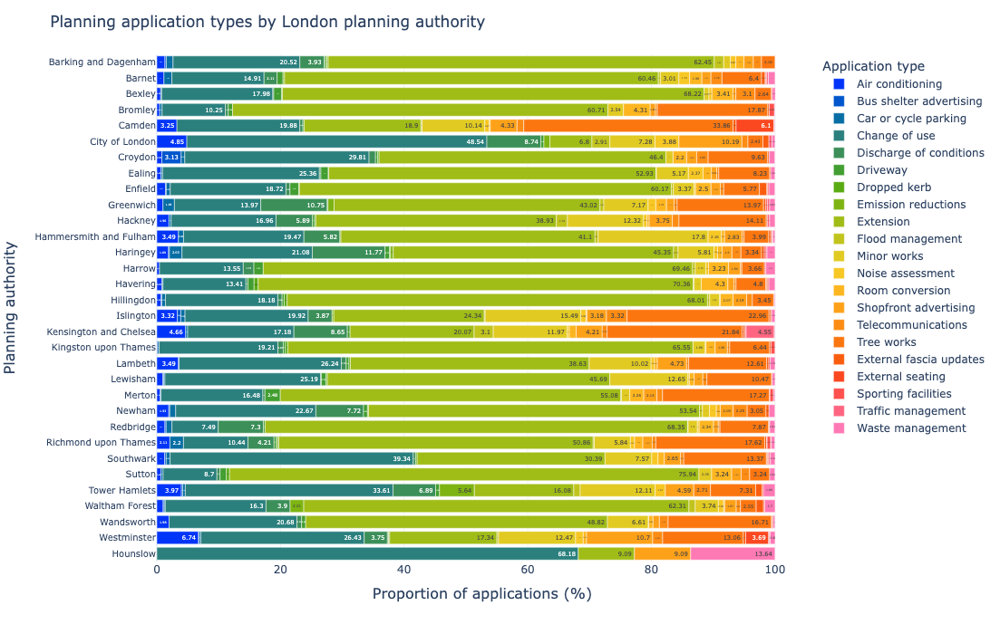

In [248]:
# Visualising the distribution of the topics generated
import plotly.express as px

fig = px.bar(topics_in_pa, x = 'TOPIC%', y = 'authority',
             color='DESC_TOPIC', text = 'TOPIC%',
             custom_data=[topics_in_pa['authority'], topics_in_pa['DESC_TOPIC'],topics_in_pa['TOPIC%']],
             color_discrete_sequence = cc.b_rainbow_bgyrm_35_85_c71[::12][:topics_in_pa.shape[0]])

fig.update_traces(textfont_size = 14, textangle = 0, textposition = "outside")

fig.update_layout(
    legend=dict(
        title='Application type'),
    xaxis=dict(
        title='Proportion of applications (%)',
        titlefont_size=16,
        tickfont_size=12),
    yaxis=dict(
        title='Planning authority',
        titlefont_size=16,
        tickfont_size=10))

hovertemp = '<b>Planning authority:</b> %{customdata[0]}<br><extra></extra>'
hovertemp += '<b>Application topic:</b> %{customdata[1]}<br>'
hovertemp += '<b>Proportion of all applications:</b> %{customdata[2]}%<br>'

    # Customising style
fig.update_layout(title='Planning application types by London planning authority')
fig.update_layout(autosize=True,
    height=700)
fig.update_traces(textfont_size=10, textangle=0, textposition="inside", cliponaxis=True)
fig.update_traces(hovertemplate=hovertemp)
fig.update_layout(
    yaxis = dict(autorange="reversed"))
fig.show('jupyterlab')

The above figure shows the variation in the types of planning application received by planning authorities in London. In the majority of authorities, applications for an extension (the light green bar) are most common, often followed by an application for a change of use (the dark green bar). That being said, only 6.8% of applications to the City of London planning authority were related to an extension, whilst only 9.1% were related to an extension in Hounslow. This is likely a result of the commercial land use in the City of London, where few residents live, and the low number of applications in Hounslow. 

While the proportion of applications for tree works and discharges of conditions remains relatively consistent across the 33 authorities, the number of applications for other types such as external seating and shopfront advertising are much more variable. For instance, in Richmond upon Thames, applications for external seating make up 0.1% of total applications compared to 6.1% in Camden. Having gained a high level understanding of the planning application types in each planning authority, we can now move to a smaller scale and understand application types in each LSOA.

#### 5.2.2. LSOA

The 'applications' dataframe can be grouped to identify the topics in an LSOA and count their occurrence.

In [249]:
# Grouping by LSOA and planning application topic to get the count of each topic in an LSOA
topics_in_lsoa = applications.groupby(['LSOA11CD', 'DESC_TOPIC']).agg({'ID':'count'})

# Resetting the index
topics_in_lsoa = topics_in_lsoa.reset_index()

# Viewing the head of the dataframe
display(topics_in_lsoa.head())

,LSOA11CD,DESC_TOPIC,ID
0,E01000001,Change of use,5
1,E01000002,Air conditioning,1
2,E01000002,Change of use,6
3,E01000002,Discharge of conditions,2
4,E01000002,Extension,1


We can then group the dataframe again to find the topic with the maximum occurrences in each LSOA.

In [250]:
# Finding the topic of maximum occurrence in an LSOA
topics_in_lsoa = topics_in_lsoa.loc[topics_in_lsoa.groupby(["LSOA11CD"])["ID"].idxmax()]

# Keeping only relevant columns
topics_in_lsoa = topics_in_lsoa[['LSOA11CD', 'DESC_TOPIC']]

# Viewing the head of the dataframe
display(topics_in_lsoa.head())

,LSOA11CD,DESC_TOPIC
0,E01000001,Change of use
2,E01000002,Change of use
8,E01000003,Change of use
11,E01000005,Change of use
14,E01000006,Extension


The maximum occurrence of a topic in an LSOA represents the modal application type. In cases of multiple modal topics, only the first was kept. These can now be joined to the 'lsoa' dataframe to give the polygon geometries of each LSOA and enable visualisation.

In [251]:
# Joining the 'topics_in_lsoa' dataframe to the 'lsoa' dataframe to get the polygon geometries
lsoa = lsoa.join(topics_in_lsoa.set_index('LSOA11CD'), on = 'LSOA11CD')

# Renaming the 'DESC_TOPIC' column
lsoa.rename(columns = {'DESC_TOPIC': 'MODAL_TOPIC'}, inplace = True)

# Viewing the head of the dataframe
display(lsoa.head(1))

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,index,MEDIAN_PROPERTY_PRICE,POPULATION,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE,outline,MODAL_TOPIC
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18...",35.895,36.4,46.365422,38.899804,14.734774,28047,265000.0,1634,1.331168,-0.416994,-0.114533,0.86269,-1.037702,-0.854216,1,Extension


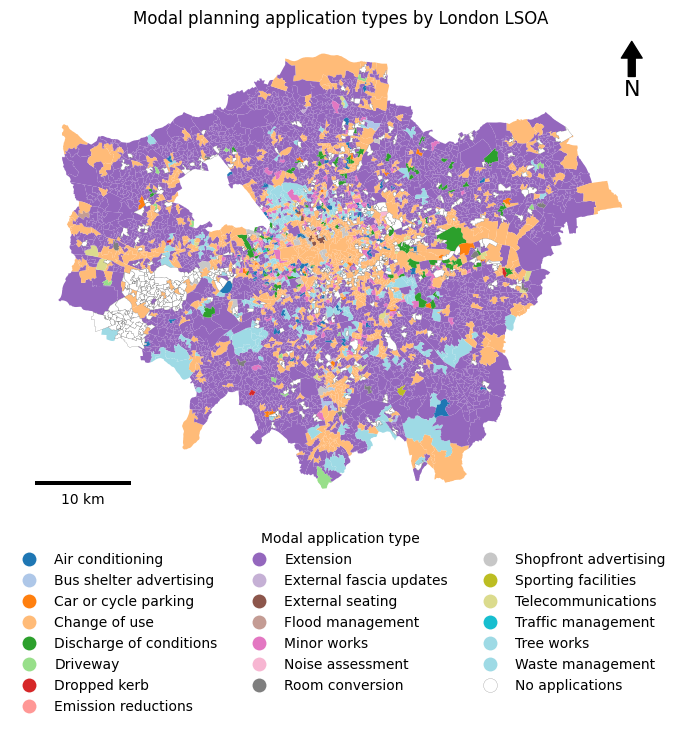

In [252]:
# Plotting the choropleth distribution of modal planning application types
ax = lsoa.plot(column = "MODAL_TOPIC", legend = True, figsize = (8,8),
                    legend_kwds = {"ncols": 3, "frameon" : False, "title" : "Modal application type",  'loc': "lower center", 
                                   "bbox_to_anchor":((0.5,-0.45))}, edgecolor = "none", cmap = "tab20", 
                                    missing_kwds = {"color": "white", "label": "No applications", 'edgecolor' : "black",
                                                   'linewidth' : 0.1})

scalebar = ScaleBar(dx = 1, location = "lower left", scale_loc = "bottom") # Defining the scalebae
ax.add_artist(scalebar) # Adding scalebar

cartoee.add_north_arrow(ax, text = "N", xy=(0.97, 0.98), text_color = "black", arrow_color = "black", fontsize = 16) # North arrow

ax.set_title("Modal planning application types by London LSOA") # Adding title

ax.set_axis_off()

Similar to the visualisation of planning application types by planning authority, it is clear in the above figure that the modal application type in the majority of LSOA relates to an extension, followed again by tree works. In Central London LSOA, however, modal topics are more commonly related to a change of use or minor works. A number of outliers exist- in the Sutton 008F LSOA, for example, the modal application type relates to dropped kerbs whilst in Havering 025D, the modal application type is room conversions.

### 5.3. RQ3- Do planning application success rates differ across London, and are they associated with area geodemographic characteristics?

Having identified in Section 5.1.4 that the number of planning applications per 1,000 persons in an LSOA are spatially variable across and spatially clustered between London LSOA, and having gained a contextual understanding of the types of planning applications submitted in LSOA, we can now evaluate the success of planning applications. To do so, the success rate of planning applications at both a planning authority and LSOA geography will be calculated and visualised, the spatial variability of the success rate of planning applications between LSOA will be examined, and the associations between the success rate and area-level geodemographic characteristics will be assessed.

#### 5.3.1. Do planning application success rates differ across London?

**Planning authorities**

In [253]:
# Converting the string 'binary_outcome' column to integer type
applications['BINARY_OUTCOME'] = applications['BINARY_OUTCOME'].astype(int)

We can group the 'applications' dataframe by the sum of the 'binary_outcome' column to get the number of successful planning applications in each planning authority.

In [254]:
# Grouping to get the number of successful planning applications in each authority
success_pa = applications.groupby(['authority']).agg({'BINARY_OUTCOME': 'sum'}).reset_index()

# Viewing the head of the dataframe
display(success_pa.head(2))

,authority,BINARY_OUTCOME
0,Barking and Dagenham,363
1,Barnet,1272


This dataframe can be joined to the 'applications_in_pa' dataframe produced in Section 5.1.1 to get the total number of applications in each authority.

In [255]:
# Joining with the 'applications_in_pa' dataframe
success_pa = success_pa.join(applications_in_pa.set_index('authority'), on = 'authority')

# Renaming columns
success_pa = success_pa.rename(columns = {'BINARY_OUTCOME': 'SUCCESS_APP', 'ID': 'TOTAL_APP'})

# Viewing the head of the dataframe
display(success_pa.head(2))

,authority,SUCCESS_APP,TOTAL_APP
0,Barking and Dagenham,363,458
1,Barnet,1272,1563


Using these counts, we can calculate and visualise the success rate of planning applications in each authority.

In [256]:
# Calculating the success rate
success_pa['%_SUCCESS'] = round(((success_pa['SUCCESS_APP']/success_pa['TOTAL_APP'])*100),0)

# Viewing the head of the dataframe
display(success_pa.head(2))

,authority,SUCCESS_APP,TOTAL_APP,%_SUCCESS
0,Barking and Dagenham,363,458,79.0
1,Barnet,1272,1563,81.0


In [257]:
# Calculating the median success rate
print(f'Median success rate within planning authorities: {success_pa["%_SUCCESS"].median()}')

Median success rate within planning authorities: 85.5


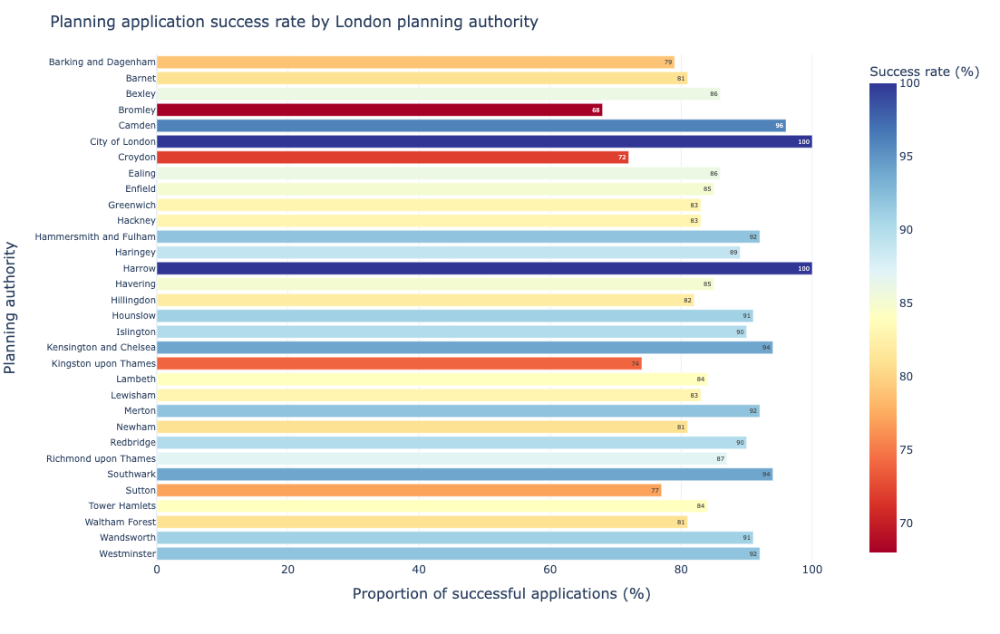

In [258]:
# Visualising the success rate of planning applications in each authority
import plotly.express as px

fig = px.bar(success_pa, x = '%_SUCCESS', y = 'authority',
             color='%_SUCCESS', text = '%_SUCCESS',
             custom_data=[success_pa['authority'], success_pa['TOTAL_APP'],success_pa['%_SUCCESS']],
             color_continuous_scale = 'rdylbu')

fig.update_traces(textfont_size = 14, textangle = 0, textposition = "outside")

fig.update_layout(
    coloraxis_colorbar_title_text = 'Success rate (%)',
    xaxis=dict(
        title='Proportion of successful applications (%)',
        titlefont_size=16,
        tickfont_size=12),
    yaxis=dict(
        title='Planning authority',
        titlefont_size=16,
        tickfont_size=10))

hovertemp = '<b>Planning authority:</b> %{customdata[0]}<br><extra></extra>'
hovertemp += '<b>Total applications:</b> %{customdata[1]}<br>'
hovertemp += '<b>Proportion of successful applications:</b> %{customdata[2]}%<br>'

    # Customising style
fig.update_layout(title='Planning application success rate by London planning authority')
fig.update_layout(autosize=True,
    height=700)
fig.update_traces(textfont_size=10, textangle=0, textposition="inside", cliponaxis=True)
fig.update_traces(hovertemplate=hovertemp)
fig.update_layout(
    yaxis = dict(autorange="reversed"))
fig.show('jupyterlab')

It is clear that there is variation in the success rate of planning applications between London planning authorities. In Bromley, for instance, only 68% of the 885 applications submitted between 01-01-2022 and 31-03-2022 were approved, whilst 92% of the 1,712 applications in Westminster in the same time period were approved. With this in mind, we can examine variation between LSOA.

**LSOA**

Again, we can group the 'applications' dataframe to get the sum of successful applications in each LSOA.

In [259]:
# Grouping to get the number of successful planning applications in each authority
success_lsoa = applications.groupby(['LSOA11CD']).agg({'BINARY_OUTCOME': 'sum'}).reset_index()

# Viewing the head of the dataframe
display(success_lsoa.head(2))

,LSOA11CD,BINARY_OUTCOME
0,E01000001,5
1,E01000002,13


The grouped dataframe can be joined to the 'applications_in_lsoa' dataframe produced in Section 5.1.1 to get the total number of applications in each LSOA and then calculate the success rate in each LSOA.

In [260]:
# Joining with the 'applications_in_lsoa' dataframe
success_lsoa = success_lsoa.join(applications_in_lsoa[['LSOA11CD', 'APPLICATIONS']].set_index('LSOA11CD'), on = 'LSOA11CD')

# Renaming columns
success_lsoa = success_lsoa.rename(columns = {'BINARY_OUTCOME': 'SUCCESS_APP', 'APPLICATIONS': 'TOTAL_APP'})

# Calculating the success rate in each LSOA
success_lsoa['%_SUCCESS'] = round(((success_lsoa['SUCCESS_APP']/success_lsoa['TOTAL_APP'])*100),0)

# Viewing the head of the dataframe
display(success_lsoa.head(2))

,LSOA11CD,SUCCESS_APP,TOTAL_APP,%_SUCCESS
0,E01000001,5,5.0,100.0
1,E01000002,13,13.0,100.0


These LSOA can now be joined to the 'lsoa' geodataframe to get their polygon geometries.

In [261]:
# Joining the 'topics_in_lsoa' dataframe to the 'lsoa' dataframe to get the polygon geometries
lsoa = lsoa.join(success_lsoa.set_index('LSOA11CD'), on = 'LSOA11CD')

# Viewing the head of the dataframe
display(lsoa.head(1))

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,IMD_SCORE,%_LSOA_NON_WHITE,%_OWNED,%_SOCIAL_RENT,%_PRIVATE_RENT,index,MEDIAN_PROPERTY_PRICE,POPULATION,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE,outline,MODAL_TOPIC,SUCCESS_APP,TOTAL_APP,%_SUCCESS
0,E01000034,Barking and Dagenham 003A,550689,186433,0.172296,51.5567,6006.847623,2a20725d-7bab-4a96-b09b-154eb16073a5,"POLYGON ((550783.502 186822.004, 550783.084 18...",35.895,36.4,46.365422,38.899804,14.734774,28047,265000.0,1634,1.331168,-0.416994,-0.114533,0.86269,-1.037702,-0.854216,1,Extension,5.0,8.0,62.0


In [262]:
# Calculating the median success rate
print(f'Median success rate within planning authorities: {lsoa["%_SUCCESS"].median()}')

Median success rate within planning authorities: 94.0


With these geometries, the success rate of planning applications in each LSOA can be visualised.

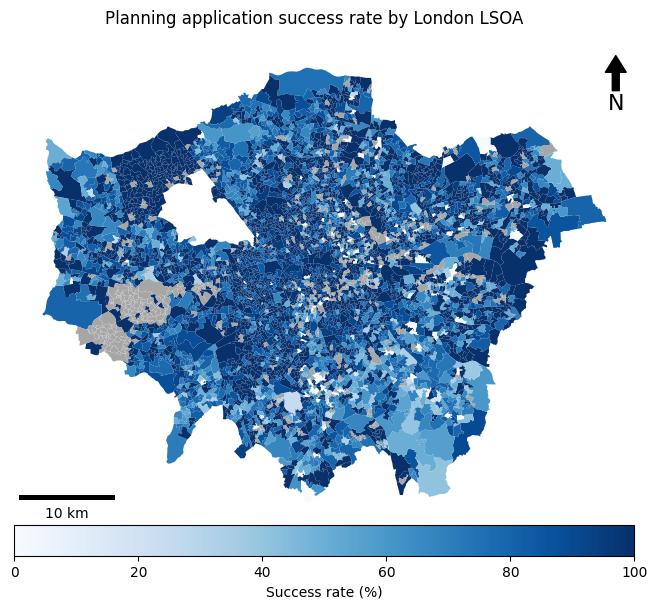

In [263]:
# Plotting the choropleth distribution of planning applications
fig, ax = plt.subplots(1,1, figsize = (8,8))

lsoa.plot(column = "%_SUCCESS", ax = ax, legend = True, edgecolor = "none", cmap = "Blues",
                              legend_kwds = {"label": "Success rate (%)", "orientation":"horizontal", "pad": 0}, 
                               missing_kwds = {"color": "gray", "label": "No applications", 'edgecolor' : "white",
                                                   'linewidth' : 0.1, "alpha":0.7})

fig.suptitle("Planning application success rate by London LSOA", y = 0.87) # Adding a figure title

scalebar = ScaleBar(dx = 1, location = "lower left", scale_loc = "bottom") # Defining the scalebae
ax.add_artist(scalebar) # Adding scalebar

cartoee.add_north_arrow(ax, text = "N", xy=(0.97, 0.98), text_color = "black", arrow_color = "black", fontsize = 16) # North arrow

ax.set_axis_off() # Removing axis

As is evident in the figure, there is a large range in planning application success rate between LSOA. In LSOA such as Camden 022B and Greenwich 036E, for instance, 100% of applications were approved compared to only 33% in Hounslow 003A and 50% in Hillingdon 003A. Whilst many LSOA have a success rate of 100%, there is no discernible spatial pattern visible. As such, the spatial variation can be investigated further using spatial clustering techniques.

From Section 5.1.1 we know that there are 489 LSOA without a submitted planning application. Unlike in previous sections, we will remove these here because they will naturally have a success rate of 0, meaning they may interfere with LSOA with an actual success rate of 0 and affect subsequent analysis.

In [264]:
# Checking the number of LSOA
print(f'Number of LSOA before removing NaN: {lsoa.shape[0]}')

# Removing NaN
lsoa = lsoa.dropna()

# Checking the number of LSOA
print(f'Number of LSOA after removing NaN: {lsoa.shape[0]}')

Number of LSOA before removing NaN: 4662
Number of LSOA after removing NaN: 4173


The 489 LSOA have now been removed, leaving only those with a planning application submitted between 01-01-2022 and 31-03-2022. These are now suitable for spatial analysis.

#### 5.3.2. Spatial clustering of successful planning application success rates

Similar to assessing the spatial clustering of the number of planning applications between LSOA in Section 5.1.2, here we will again use the KNN approach to assess the spatial clustering of the success rate of planning applications between LSOA. However, as LSOA without a submitted planning application have now been removed, new spatial weights must be calculated.

In [265]:
# Calculating the square root of the LSOA length
math.sqrt(len(lsoa))

64.59876159803684

In [266]:
# Calculating the spatial weights using KNN neighbours
    # A choice of 65 neighbours is made because above it is identified that 64.59 is the square root of 
    #the 'lsoa' length, and so we round up to the nearest integer
w_k = weights.KNN.from_dataframe(lsoa, k = 65)

In [267]:
# Printing the KNN neighbours summary statistics
print(f"-KNN number of LSOA is {w_k.n}")
print(f"-Mean number of KNN neighbours is {w_k.mean_neighbors}")
print(f"-Minimum number of KNN neighbours is {w_k.min_neighbors}")
print(f"-Maximum number of KNN neighbours is {w_k.max_neighbors}")
print(f"-KNN islands: {w_k.islands}")

-KNN number of LSOA is 4173
-Mean number of KNN neighbours is 65.0
-Minimum number of KNN neighbours is 65
-Maximum number of KNN neighbours is 65
-KNN islands: []


Above, we can see that the weights have worked correctly as each LSOA has 65 neighbours and there are no islands present. Now, we can calculate the Moran's I value to identify the strength and significance of spatial clustering in the data.

In [268]:
# Calculating the Moran's I of the success rate of planning applications between LSOA
mi = esda.Moran(lsoa['%_SUCCESS'], w_k)

# Printing the value of Moran's I (the level of spatial clustering in the success rate of planning applications between LSOA)
print(mi.I)

0.10947695323438153


In [269]:
# Printing the p- value of the Moran's I (the strength of the statistical significance of any spatial clustering)
print(mi.p_sim)

0.001


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.11)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

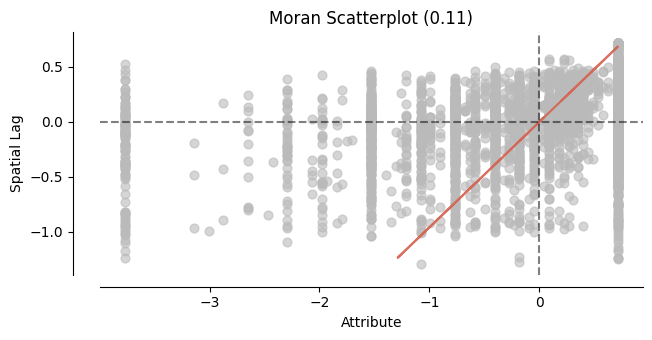

In [270]:
# Creating the Moran scatterplot
moran_scatterplot(mi)

In [271]:
# Running the LISA model of the number of applications
lisa = esda.Moran_Local(lsoa['%_SUCCESS'], w_k)

(<Figure size 640x480 with 1 Axes>, <Axes: >)

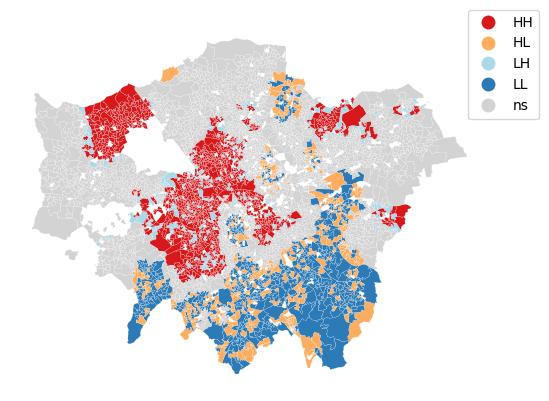

In [272]:
# # Plotting the LISA map of the residuals
lisa_cluster(lisa, lsoa, legend_kwds={'loc': 'upper right', 'bbox_to_anchor': (1.12, 1.05)})

The statistically significant Moran's I value of 0.11 suggests that there is a level of spatial clustering and autocorrelation in the data. This is supported by the strong linear line and clustering of points around the y-intercept in the Moran's I scatterplot, and indicates that there are clusters of LSOA that share similar success rates of planning applications with their neighbours. These are illustrated in the LISA cluster map, which shows large clusters of 'LL' type in South London where LSOA with a low success rate are neighboured by LSOA with similarly low success rates. Equally, large clusters of the 'HH' type are also prominent, suggesting that LSOA with a high success rate in these areas are neighboured by LSOA with similarly high success rates. 

In practice, this finding means that the spatial patterns of planning application success rate are more clustered than would be expected by chance, and indicates that there is underlying spatial autocorrelation in the data that must be addressed.

#### 5.3.3. Ordinary Least Squares (OLS)

To attempt to understand the factors behind these spatial patterns, associations between the success rate of planning applications in an LSOA and the geodemographic characteristics of an LSOA can be assessed. OLS will first be utilised in an attempt to capture a degree of the spatial autocorrelation.

As all geodemographic variables were standardised using Z-scores in Section 4.3.5, we must also standardise the '%_SUCCESS' response variable.

In [273]:
# Standardising the '%_SUCCESS' variable
lsoa['STD_PC_SUCCESS'] = stats.zscore(lsoa['%_SUCCESS'])

In [274]:
# Subsetting the 'lsoa' dataframe to keep only relevant variables
success_geodems = lsoa[['STD_PC_SUCCESS', 'STD_IMD_SCORE', 'STD_PC_LSOA_NON_WHITE',
                                     'STD_PC_OWNED', 'STD_PC_SOCIAL_RENT', 'STD_PC_PRIVATE_RENT', 'STD_MEDIAN_PROPERTY_PRICE']]

OLS assumes that multicollinearity is not present and so the heatmap below will be used to validate this assumption.

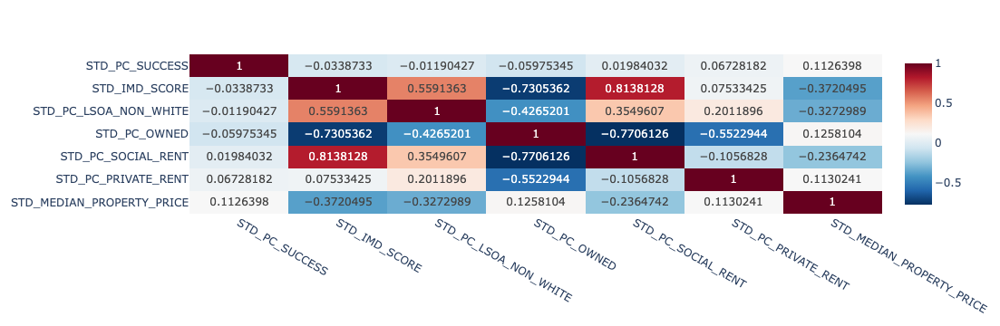

In [275]:
# Plotting the heatmap
import plotly.express as px

fig = px.imshow(success_geodems.corr(), text_auto = True, aspect = "auto", color_continuous_scale = 'RdBu_r',)

hovertemplate='X: %{x}<br>Y: %{y}<br>Coefficient: %{z}<extra></extra>'

fig.update_traces(hovertemplate=hovertemplate)

fig.show('jupyterlab')

With the exception of the 'STD_IMD_SCORE' and 'STD_PC_SOCIAL_RENT' variables, we can see relatively little correlation in the above matrix. Given the high correlation coefficient of 0.81 between the two variables, 'STD_PC_SOCIAL_RENT' will be removed from further analysis in order to satisfy the multicollinearity assumption of OLS. 'STD_IMD_SCORE' could alternatively be removed, but this is likely to provide more insight than the 'STD_PC_SOCIAL_RENT' variable.

In [276]:
# Assigning the dependent variable to 'y' and independent to 'X'
y = lsoa['STD_PC_SUCCESS']
X = lsoa[['STD_IMD_SCORE', 'STD_PC_LSOA_NON_WHITE', 'STD_PC_OWNED', 'STD_PC_PRIVATE_RENT', 'STD_MEDIAN_PROPERTY_PRICE']]

In [277]:
# Adding the constant to 'X'
x1 = sm.add_constant(X)

# Creating the model
mod = sm.OLS(y, x1)

# Fitting the model
results = mod.fit()

# Printing the results
def lm_spatial_v1():
    print(results.summary())
    
lm_spatial_v1()

                            OLS Regression Results                            
Dep. Variable:         STD_PC_SUCCESS   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     20.98
Date:                Thu, 24 Aug 2023   Prob (F-statistic):           9.13e-21
Time:                        09:27:05   Log-Likelihood:                -5869.4
No. Observations:                4173   AIC:                         1.175e+04
Df Residuals:                    4167   BIC:                         1.179e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

The results of this OLS model indicate a statistically significant weak positive association between the success rate of planning applications in an LSOA and the median property price of an LSOA whilst holding all other variables constant (p<0.05). Conversely, statistically significant negative associations are identified between the success rate of planning applications in an LSOA and the proportion of homes of owned tenure type, the proportion of homes that are privately rented, and the IMD score of an LSOA (p<0.05). For instance, a one-unit increase in the IMD score of an LSOA is associated with a reduction of -0.17 in the success rate of planning applications in an LSOA, whilst the same change in the proportion of housing of owned tenure type in an LSOA is associated with a reduction of -0.20 in the success rate of planning applications in an LSOA whilst holding all other variables constant.

On the other hand, the model identified a statistically insignificant positive association between the proportion of persons in an LSOA of a non-white ethnic group and the success rate of planning applications in an LSOA (p=0.088), though this result is only slightly insignificant. Overall, the model accounts for only 2.3% of the variation in the success rate of planning applications in an LSOA (Adj R2 = 0.023), meaning that other factors that have not been assessed are likely to contribute to this variation.

Using the residuals from this model, we can begin to identify whether the associations between the success rate of planning applications in an LSOA and the geodemographic characteristics of an LSOA vary spatially. 

In [278]:
# Assigning the residuals of the linear regression model to a new column in the 'lsoa' dataframe
lsoa['LM_res'] = results.resid

In [279]:
# Calculating the Moran's I value for the linear model residuals, using the same KNN weights made previously
mi = esda.Moran(lsoa['LM_res'], w_k) 

In [280]:
# Printing the Moran's I value
print(mi.I)

0.08461822130396213


In [281]:
# Printing the statistical significance of the Moran's I value
print(mi.p_sim)

0.001


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.08)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

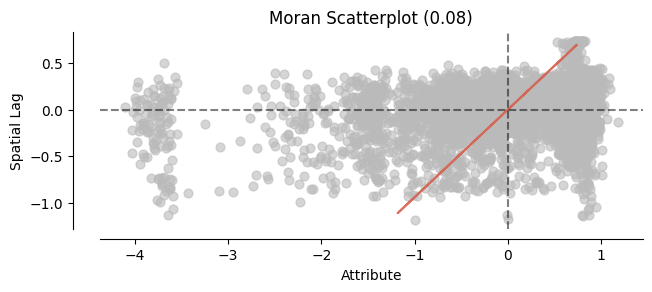

In [282]:
# Creating the Moran scatterplot
moran_scatterplot(mi)

In [283]:
# Running the LISA model on the residuals, using the KNN weights again
lisa = esda.Moran_Local(lsoa['LM_res'], w_k)

(<Figure size 640x480 with 1 Axes>, <Axes: >)

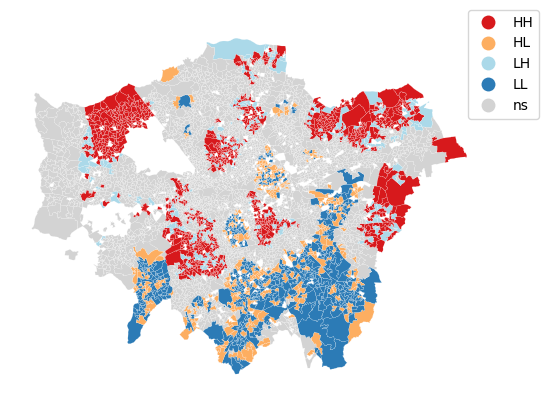

In [284]:
# # Plotting the LISA map of the residuals
lisa_cluster(lisa, lsoa, legend_kwds={'loc': 'upper right', 'bbox_to_anchor': (1.12, 1.05)})

In comparison to the spatial autocorrelation identified in Section 5.3.2, we can see that the OLS model has captured a degree of the spatial autocorrelation in the data. For instance, the Moran's I value has reduced from 0.11 to 0.08 and the Moran's I scatterplot shows a reduced clustering of points around the y-intercept. However, the level of spatial autocorrelation remains statistically significant (p<0.05) and the LISA cluster map illustrates the large number of clusters that remain, especially of the 'LL' type in South London. This indicates that, though the OLS model has captured a degree of the spatial autocorrelation, the data is not yet independent and the underlying spatial processes have not yet been fully accounted for. As such, a Geographically Weighted Regression model can be used to capture the maximum variation and understand whether the associations vary spatially.

#### 5.3.4. Geographically Weighted Regression (GWR)

Here, the 'STD_PC_LSOA_NON_WHITE' variable has been removed due to its lack of a statistically significant association with the success rate of planning applications in an LSOA.

In [285]:
# Creating a list of x and y coordinates
g_coords = list(zip(lsoa.LONG_, lsoa.LAT))

# Defining x and y variables
g_y = np.asarray(lsoa['STD_PC_SUCCESS']).reshape((-1,1))
g_X = np.asarray(lsoa[['STD_IMD_SCORE', 'STD_PC_OWNED', 'STD_PC_PRIVATE_RENT', 'STD_MEDIAN_PROPERTY_PRICE']]).reshape((-1,4))

In [286]:
# Setting parameters to calculate the optimal bandwidth
gwr_selector = Sel_BW(g_coords, g_y, g_X, spherical = False, fixed = False)

# Calculating the optimal bandwidth
bw = gwr_selector.search()

print(bw)

321.0


In [287]:
# Producing the model using the optimal bandwidth
gwr = GWR(g_coords, g_y, g_X, bw)

# Fitting the model
gwr_results = gwr.fit()

# Printing the model summary
print(gwr_results.summary())

Model type                                                         Gaussian
Number of observations:                                                4173
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           4073.390
Log-likelihood:                                                   -5870.821
AIC:                                                              11751.643
AICc:                                                             11753.663
BIC:                                                             -30672.686
R2:                                                                   0.024
Adj. R2:                                                              0.023

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In comparison to the OLS model the GWR model represents a better model fit, accounting for 13% of the variation in the success rate of planning applications in an LSOA compared to only 2.3% in the OLS model. The model also illustrates the spatial variation in the associations between the success rate of planning applications in an LSOA and the geodemographic characteristics of an LSOA. In some LSOA, for instance, a one-unit increase in the proportion of homes of owned tenure type (X2) is associated with a reduction of -1.23 in the success rate of planning applications in an LSOA whilst, in others, the same change is associated with an increase of 0.44 in the success rate of planning applications in an LSOA. Similarly, a one-unit increase in the IMD score of an LSOA (X1) is associated with an increase of 0.46 in the success rate of planning applications in some LSOA but a reduction of -1.18 in others.

Large variation is also seen in the association between the median house sale price of an LSOA (X4) and the success rate of planning applications in an LSOA, with a range of 1.76. Overall, the results indicate that there is spatial variation in the associations between the success rate of planning applications in an LSOA and the geodemographic predictor variables, but that these variables do not explain much of the variation. The extent of spatial autocorrelation captured by the GWR model will be identified below, and the reasons behind the lack of variation explanation will be discussed in the briefing.

In [288]:
# Assigning the residuals of the GWR model to a new column in the 'lsoa' dataframe
lsoa['GWR_res'] = gwr_results.resid_response

In [289]:
# Calculating the Moran's I value of the GWR model residuals
mi = esda.Moran(lsoa['GWR_res'], w_k)

In [290]:
# Printing the Moran's I value
print(mi.I)

-0.0010015562700588273


In [291]:
# Printing the statistical significance of the Moran's I value
print(mi.p_sim)

0.405


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (-0.0)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

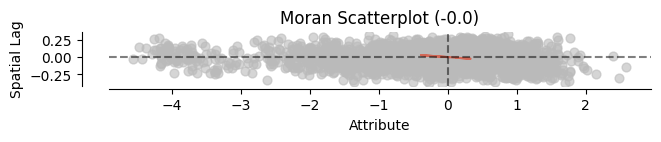

In [292]:
# Creating the Moran scatterplot
moran_scatterplot(mi)

In [293]:
# Running the LISA model on the residuals
lisa = esda.Moran_Local(lsoa['GWR_res'], w_k)

(<Figure size 640x480 with 1 Axes>, <Axes: >)

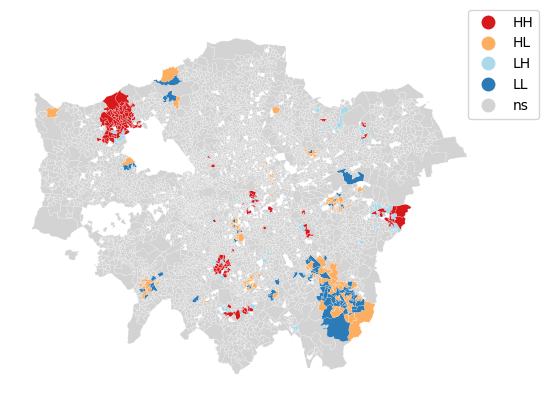

In [294]:
# # Plotting the LISA map of the residuals
lisa_cluster(lisa, lsoa, legend_kwds={'loc': 'upper right', 'bbox_to_anchor': (1.12, 1.05)})

From the much more even distribution of points in the Moran's I scatterplot and the statistically insignificant Moran's I value of -0.01, it is clear that the GWR model has captured much of the spatial autocorrelation in the data. This is also evident from the greatly reduced number of clusters in the LISA cluster map. This means that we can be relatively confident that the inability of the model to explain more than 13% of the variation in the success rate of planning applications in an LSOA is not a result of underlying spatial autocorrelation, rather it is more likely to be a result of poor predictor variables. 

Satisfied that the spatial autocorrelation has been reduced and the model fit slightly improved, the coefficients from the GWR model can be used to visualise how associations between the success rate of planning applications in an LSOA and the geodemographic characteristics of an LSOA vary spatially.

In [295]:
# Extracting the model coefficients for each variable
lsoa['Success_GWR_Beta_IMD'] = gwr_results.params[:,1]
lsoa['Success_GWR_Beta_OWNED'] = gwr_results.params[:,2]
lsoa['Success_GWR_Beta_PRIVATE'] = gwr_results.params[:,3]
lsoa['Success_GWR_Beta_PRICE'] = gwr_results.params[:,4]

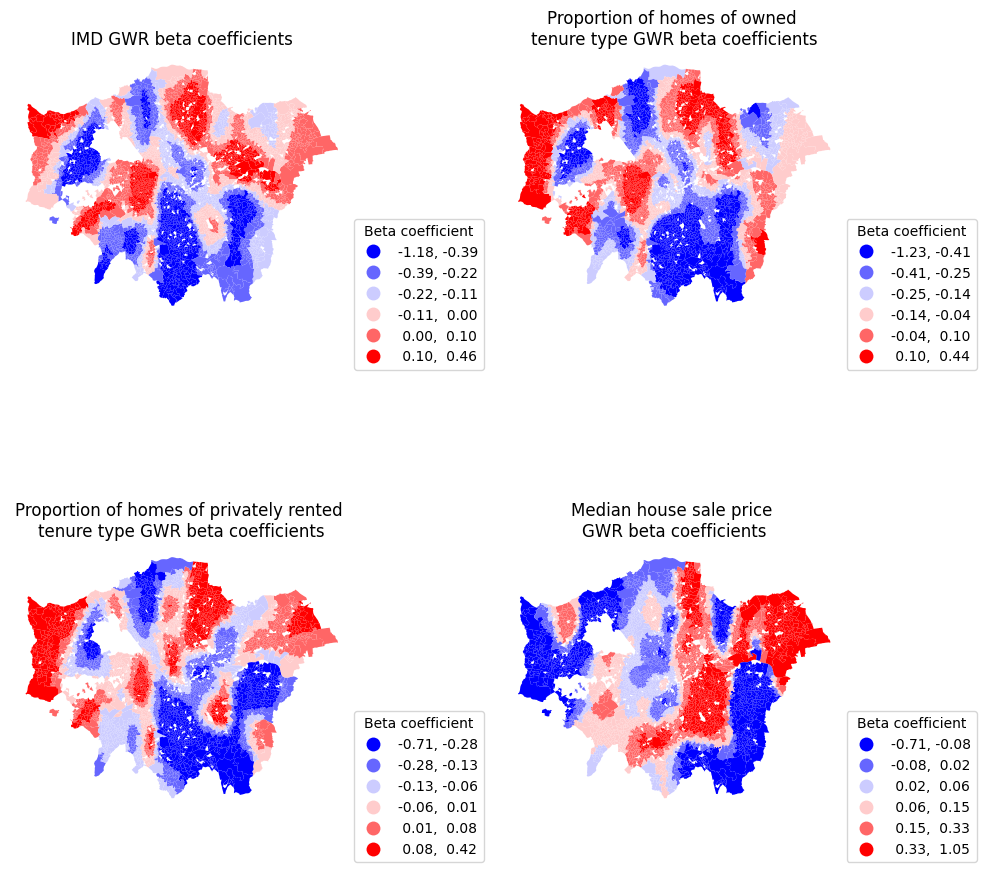

In [296]:
# Plotting how the GWR coefficients vary across space
fig = plt.figure(figsize=(10,10))

# IMD
ax = fig.add_subplot(221)
lsoa.plot(ax = ax,column = 'Success_GWR_Beta_IMD', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("IMD GWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.40,0.4))
ax.set_axis_off()

# Proportion of homes of owned tenure type
ax = fig.add_subplot(222)
lsoa.plot(ax = ax,column = 'Success_GWR_Beta_OWNED', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("Proportion of homes of owned \ntenure type GWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.40,0.4))
ax.set_axis_off()

# Proportion of homes of privately rented tenure type
ax = fig.add_subplot(223)
lsoa.plot(ax = ax,column = 'Success_GWR_Beta_PRIVATE', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("Proportion of homes of privately rented \ntenure type GWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.40,0.4))
ax.set_axis_off()

# Median house sale price
ax = fig.add_subplot(224)
lsoa.plot(ax = ax,column = 'Success_GWR_Beta_PRICE', cmap = 'bwr', scheme = 'quantiles', k = 6,legend = True)
ax.set_title("Median house sale price \nGWR beta coefficients", fontsize = 12)
leg = ax.get_legend()
leg.set(title = "Beta coefficient")
leg.set_bbox_to_anchor((1.40,0.4))
ax.set_axis_off()

plt.tight_layout()
plt.show()

Of the four geodemographic variables, the association between median house sale price and the success rate of planning applications in an LSOA is the most spatially variable. In LSOA shaded blue, a one-unit increase in median house sale price is associated with a decrease of up to -0.71 in the success rate of planning applications in an LSOA whilst in LSOA shaded red, the same change is associated with an increase of up to 1.05 in the success rate of planning applications in an LSOA. Similar variation is found in the associations between the other geodemographic variables and the success rate of planning applications in an LSOA. For instance, a one-unit increase in the IMD score of an LSOA is associated with an increase of between 0.10 and 0.46 in the success rate of planning applications in some LSOA, but a reduction of between -0.28 and -0.71 in others. Overall, these plots indicate that the success rate of planning applications in an LSOA is spatially variable, prompting further investigation and justifiying the identification of the factors that predict a successful application in the next section.

### 5.4. What factors predict the success of planning applications?

Research Question 4 builds upon the previous research questions to identify the application-specific factors that predict a successful planning application. To do this, the performance of five different classification models (Logistic Binary Regression, Naive Bayes, Support Vector Machine (SVM), Decision Tree, Random Forest) on the data is first assessed to identify the most suitable model. Next, the most suitable model is implemented and used to identify the factors that predict a successful planning application. These insights have implications for homeowners, developers, and planners.

#### 5.4.1. Data preparation

In [297]:
# Subsetting the 'applications' dataframe to include only the relevant columns
classification = applications[['DESC_TOPIC', 'BINARY_OUTCOME', 'STD_IMD_SCORE', 'STD_PC_LSOA_NON_WHITE', 'STD_PC_OWNED', 'STD_PC_SOCIAL_RENT', 'STD_PC_PRIVATE_RENT', 'STD_MEDIAN_PROPERTY_PRICE']]

# Viewing the head of the dataframe
display(classification.head(2))

,DESC_TOPIC,BINARY_OUTCOME,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE
9566,Extension,1,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028
9580,Change of use,1,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028


Any classification model requires a categorical or binary response variable. As such, the 'BINARY_OUTCOME' column, which is currently a column of float values, will be converted to an integer form to make it binary.

In [298]:
# Converting the column to integer form
classification['BINARY_OUTCOME'] = classification['BINARY_OUTCOME'].astype(int)

Similarly, categorical predictor variables in a classification model must be binary encoded else they will be treated as ordinal and distort the integrity and reliability of the analysis. To do this, the 'DESC_TOPIC' column, which contains the predicted application type, will be converted into a number of 'dummy' variables.

In [299]:
# Ensuring the column is categorical before binary encoding
classification['DESC_TOPIC'] = classification['DESC_TOPIC'].astype('category')

In [300]:
# Creating dummy variables from the predicted application types
topic_dummies = classification.DESC_TOPIC.str.get_dummies()

# Resetting the index
topic_dummies = topic_dummies.reset_index().drop(['index'], axis = 1)

# Viewing the head of the dataframe
display(topic_dummies.head(2))

,Air conditioning,Bus shelter advertising,Car or cycle parking,Change of use,Discharge of conditions,Driveway,Dropped kerb,Emission reductions,Extension,External fascia updates,External seating,Flood management,Minor works,Noise assessment,Room conversion,Shopfront advertising,Sporting facilities,Telecommunications,Traffic management,Tree works,Waste management
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [301]:
# Dropping the now unneccessary columns in the 'classification' dataframe
classification = classification.reset_index().drop(['index', 'DESC_TOPIC'], axis = 1)

# Viewing the head of the dataframe
display(classification.head(2))

,BINARY_OUTCOME,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE
0,1,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028
1,1,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028


Now, the dummy variables can be joined to the 'classification' dataframe to get the dummy variables for each application.

In [302]:
# Joining the dummy variables to the classification dataframe
classification = pd.concat([classification, topic_dummies], axis=1)

# Viewing the head of the dataframe
display(classification.head(2))

,BINARY_OUTCOME,STD_IMD_SCORE,STD_PC_LSOA_NON_WHITE,STD_PC_OWNED,STD_PC_SOCIAL_RENT,STD_PC_PRIVATE_RENT,STD_MEDIAN_PROPERTY_PRICE,Air conditioning,Bus shelter advertising,Car or cycle parking,Change of use,Discharge of conditions,Driveway,Dropped kerb,Emission reductions,Extension,External fascia updates,External seating,Flood management,Minor works,Noise assessment,Room conversion,Shopfront advertising,Sporting facilities,Telecommunications,Traffic management,Tree works,Waste management
0,1,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,1,-0.252796,-1.307724,1.084377,-0.370442,-1.192707,-0.60028,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


The response variable for the prediction model is the 'BINARY_OUTCOME', whilst the predictor variables are the geodemographic variables and the dummy variables created above. The dataframe is partioned into response and predictor variables below.

In [303]:
# Defining the response and predictor variables
y = classification['BINARY_OUTCOME']
x = classification.drop(['BINARY_OUTCOME'], axis = 1)

In [304]:
# Checking that the response variable is actually binary
print(f'Response variable type: {type_of_target(y)}')

Response variable type: binary


Now the data is partioned and of the correct data types, we can split the data into test and train datasets.

In [305]:
# Splitting the data into test and train datasets
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state = 42)

#### 5.4.2. Comparison of model performance

To ensure that model performance is accurately assessed, Stratified Cross Validation will be used. This approach further splits the data into k 'folds', or sets, ensuring that each fold contains a representative proportion of the original data. If using standard cross validation without such stratification, folds may not include certain classes in the data (e.g., unsuccessful applications), meaning more weight would be given to over-represented classes and leading to overfitting where the model performs well in training but performs poorly when unseen data is applied. Thus, in Stratified Cross Validation, each fold is an appropriate representation of the original data, enhancing the accuracy of the model comparisons. 

10 folds are used because the number has been found to be optimal in various use cases (Singh and Panda, 2011; Zhang et.al., 2015; Roberts et.al., 2017; Wong and Yeh, 2019).

Additionally, given the imbalance between the numbers of successful and unsuccessful planning applications, oversampling is also employed. This creates synthetic data of the under-represented class to balance the samples and improve model performance. 

In [306]:
# Defining the Stratified Cross Validation parameters
skf = StratifiedKFold(n_splits = 10)

In [307]:
# Defining the evaluation scores to be returned
scoring = {'accuracy': 'accuracy',
           'precision': 'precision',
           'recall': 'recall',
           'f1': 'f1'}

# Creating a list to store the dataframes of each model's evaluation metrics in
df_list = []

Now, the performance of five classification models can be assessed.

**NOTE:** It was intended to assess the performance of the K-Nearest Neighbours classification model, but due to an issue in the relevant sklearn module this was not possible.

The below code blocks call the relevant sklearn model modules and applies each to the training dataset. A pipeline is first created containing the SMOTE oversampling mechanism which is fed into the Stratified Cross Validation process. This order is followed because oversampling must be performed on each fold individually to prevent data leakage between samples that could distort model performance and make it seem better than it actually is (Santos et.al., 2018).

**Logistic Regression**

Logistic Regression models the probability of a binary event given a set of independent predictor variables, and can be used to calculate the effect of each predictor variable upon the odds of the event occurring (LaValley, 2008).

In [308]:
# Creating the oversampling and model pipeline
pipeline = make_pipeline(SMOTE(random_state = 42), LogisticRegression(max_iter = 200))

# Splitting the x and y training data into 10 folds and feeding each fold into the pipeline for re-sampling
metrics = cross_validate(pipeline, X_train, y_train, cv = skf, scoring = scoring)

# Adding the evaluation metrics returned to a dataframe
df = pd.DataFrame.from_dict(metrics)

# Calculating the mean of each evaluation metric
df.loc['Mean'] = df.mean()
df['Model'] = 'Logistic Regression'

# Appending the dataframe to a list of dataframes
df_list.append(df)

#Viewing the mean metrics
display(df.tail(1))

/Users/Callum/anaconda3/envs/diss_env/lib/python3.9/site-packages/threadpoolctl.py:1010: RuntimeWarning:


Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md




,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,Model
Mean,0.40846,0.009499,0.52998,0.902889,0.505749,0.648248,Logistic Regression


**Naive Bayes**

Naive Bayes is a probabilistic classification model that predicts an outcome given a set of independent predictor variables, and has wide applications including text and image classification (Webb et.al., 2010).

In [309]:
# Creating the oversampling and model pipeline
pipeline = make_pipeline(SMOTE(random_state = 42),  GaussianNB())

# Splitting the x and y training data into 10 folds and feeding each fold into the pipeline for re-sampling
metrics = cross_validate(pipeline, X_train, y_train, cv = skf, scoring = scoring)

# Adding the evaluation metrics returned to a dataframe
df = pd.DataFrame.from_dict(metrics)

# Calculating the mean of each evaluation metric
df.loc['Mean'] = df.mean()
df['Model'] = 'Naive Bayes'

# Appending the dataframe to a list of dataframes
df_list.append(df)

#Viewing the mean metrics
display(df.tail(1))

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,Model
Mean,0.066815,0.010565,0.261679,0.901667,0.15537,0.262781,Naive Bayes


**Support Vector Machine (SVM)**

Support Vector Machines identify hyperplanes between data points in space that can be used to classify the points into similar groups (Noble, 2006). It works well on small datasets (Cervantes et.al., 2020), making it suitable for use here. 

In [310]:
# Creating the oversampling and model pipeline
pipeline = make_pipeline(SMOTE(random_state = 42),  svm.SVC())

# Splitting the x and y training data into 10 folds and feeding each fold into the pipeline for re-sampling
metrics = cross_validate(pipeline, X_train, y_train, cv = skf, scoring = scoring)

# Adding the evaluation metrics returned to a dataframe
df = pd.DataFrame.from_dict(metrics)

# Calculating the mean of each evaluation metric
df.loc['Mean'] = df.mean()
df['Model'] = 'SVM'

# Appending the dataframe to a list of dataframes
df_list.append(df)

#Viewing the mean metrics
display(df.tail(1))

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,Model
Mean,45.571388,4.942794,0.552907,0.911665,0.529398,0.669772,SVM


**Decision Tree**

Decision Trees use a rule-based approach where tree nodes are split based on feature values to create classes of similar characteristics (Kingsford and Salzberg, 2008).

In [311]:
# Creating the oversampling and model pipeline
pipeline = make_pipeline(SMOTE(random_state = 42),  DecisionTreeClassifier())

# Splitting the x and y training data into 10 folds and feeding each fold into the pipeline for re-sampling
metrics = cross_validate(pipeline, X_train, y_train, cv = skf, scoring = scoring)

# Adding the evaluation metrics returned to a dataframe
df = pd.DataFrame.from_dict(metrics)

# Calculating the mean of each evaluation metric
df.loc['Mean'] = df.mean()
df['Model'] = 'Decision Tree'

# Appending the dataframe to a list of dataframes
df_list.append(df)

#Viewing the mean metrics
display(df.tail(1))

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,Model
Mean,0.384084,0.009536,0.749141,0.875839,0.823974,0.849098,Decision Tree


**Random Forest**

A Random Forest is an ensemble model comprising multiple Decision Trees that aims to reduce the variance that occurs in individual Decision Trees (Hastie et.al., 2008). Its enhanced performance over an individual Decision Tree has been shown in Breiman (2001) and Dou et.al. (2019).

In [312]:
# Creating the oversampling and model pipeline
pipeline = make_pipeline(SMOTE(random_state = 42),  RandomForestClassifier(random_state = 42))

# Splitting the x and y training data into 10 folds and feeding each fold into the pipeline for re-sampling
metrics = cross_validate(pipeline, X_train, y_train, cv = skf, scoring = scoring)

# Adding the evaluation metrics returned to a dataframe
df = pd.DataFrame.from_dict(metrics)

# Calculating the mean of each evaluation metric
df.loc['Mean'] = df.mean()
df['Model'] = 'Random Forest'

# Appending the dataframe to a list of dataframes
df_list.append(df)

#Viewing the mean metrics
display(df.tail(1))

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,Model
Mean,5.763699,0.060762,0.772786,0.87562,0.856425,0.865898,Random Forest


With the evaluation metrics of all five models, we can compare the model performance. 

In [313]:
# Concatenating the model dataframes into a single dataframe for comparison
performance = pd.concat([df_list[0], df_list[1], df_list[2], df_list[3], df_list[4]], axis = 0)

# Dropping the mean column
performance = performance.drop('Mean', axis = 0)

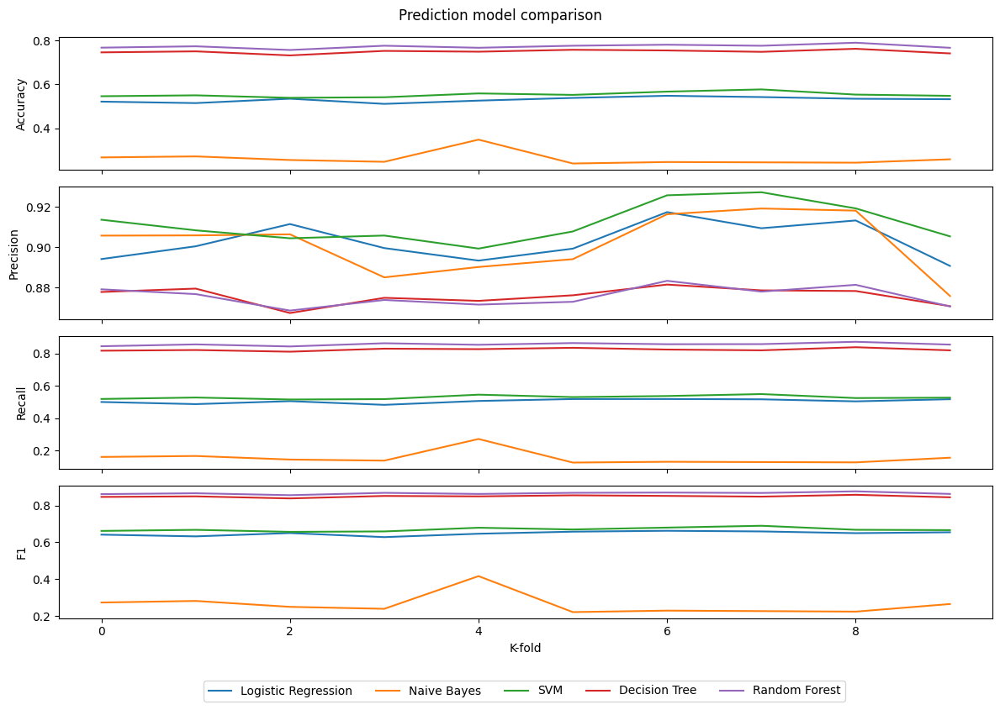

In [314]:
# Visualising the model performance
fig, axes = plt.subplots(4, 1, sharex=True, figsize = (12,8))

# Creating the plot for each performance metric
sns.lineplot(data=performance, x=performance.index, y='test_accuracy', hue='Model',  ax=axes[0], legend = True)
sns.lineplot(data=performance, x=performance.index, y='test_precision', hue='Model',  ax=axes[1], legend = False)
sns.lineplot(data=performance, x=performance.index, y='test_recall', hue='Model',  ax=axes[2], legend = False)
sns.lineplot(data=performance, x=performance.index, y='test_f1', hue='Model',  ax=axes[3], legend = False)

# Setting axis labels 
axes[0].set_ylabel('Accuracy')
axes[1].set_ylabel('Precision')
axes[2].set_ylabel('Recall')
axes[3].set_ylabel('F1')
axes[3].set_xlabel('K-fold')
axes[0].get_legend().remove()

# Creating and positioning a global legend and adding a title
leg = axes[0].get_legend()
fig.legend(loc = 'lower left', ncol = 5, bbox_to_anchor=(0.2,-0.06))
plt.suptitle('Prediction model comparison')

plt.tight_layout()

plt.show()

Each model varies in its accuracy, precision, recall, and F1 score. Taking the mean of the 10 folds, the Logistic Regression model has an accuracy of around 52%, precision of 90%, recall of 50%, and F1 score of 64%. This indicates that only 50% of predictions that should have been positive were actually classed as positive, but that 90% of those positive predictions were true. Both the Decision Tree and Random Forest have high recall and F1 scores but also have the lowest precision scores, suggesting that they correctly classify most of the positive samples but additionally classify many non-positive samples as positive, indicating that the model may be overfitted. That being said, the precision scores of these models remain above 80%. The SVM consistently performs well with a mean precision of 91%, recall of 52% and F1 of 67%, indicating that 91% of the samples identified as positive are correct, but that only 52% of positive samples were actually identified. In contrast, the Naive Bayes model performs poorly across all metrics with a mean F1 score of 26% across the 10 folds, suggesting that it does not fit the data well. 

On the basis of this comparison, it is clear that the Random Forest and Decision Tree classifier models best fit the data as they have consistently high evaluation metrics. Thus, either model could be used to identify the factors behind a successful planning application. However, only the Random Forest will actually be implemented because this is an aggregate of multiple Decision Trees and so should, in theory, increase the accuracy of the classification.

#### 5.4.3. Random Forest

First, the model will be run on the oversampled training data using 'Grid Search' cross validation to identify the most optimal model parameters.

In [315]:
# Defining a range of parameters for the Random Forest
params = {'n_estimators': [50, 100, 200], 'max_depth': [4, 6, 10, 12], 'random_state': [42]}

# Defining the schema to return the optimal Random Forest parameters
rf_parameters = {'randomforestclassifier__' + key: params[key] for key in params}

# Making a pipeline that first oversamples the data to redress the class imbalances, and then calls the Random Forest classifier
pipeline = make_pipeline(SMOTE(random_state = 42), RandomForestClassifier())

# Setting the model parameters
grid_rf = GridSearchCV(pipeline, param_grid = rf_parameters, cv = skf, scoring = 'recall',
                        return_train_score = True)

# Fitting the model to the training data
grid_rf.fit(X_train, y_train);

# Identifiying the optimal parameters
print(f'Optimal parameters: {grid_rf.best_params_}')

Optimal parameters: {'randomforestclassifier__max_depth': 12, 'randomforestclassifier__n_estimators': 200, 'randomforestclassifier__random_state': 42}


Using these optimal parameters, we can re-run the model to maxmimise performance. The training data will again be oversampled (as this was not conducted in-situ previously).

In [316]:
# Defining the oversmapling technique
oversample = SMOTE()

# Oversampling the training data
X_train, y_train = oversample.fit_resample(X_train, y_train)

In [317]:
# Checking the number of each outcome class in the training data
print(f'Value counts in the response training data: {y_train.value_counts()}')

Value counts in the response training data: BINARY_OUTCOME
1    16702
0    16702
Name: count, dtype: int64


With 16,702 samples of both successful and unsuccessful classes, we can see that the imbalance has been addressed, making the data more suitable for classification.

In [318]:
# Defining the model and optimal parameters
rf = RandomForestClassifier(n_estimators = 200, max_depth = 12, random_state = 42)

# Fitting model to the training data
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=12, n_estimators=200, random_state=42)

In [319]:
# Fitting the model to the unseen test data
y_test_predict = rf.predict(X_test)

# Calculating the recall, precision, and F1 score of the model
print(f'Accuracy: {accuracy_score(y_test, y_test_predict)}')
print(f'Recall: {recall_score(y_test, y_test_predict)}')
print(f'Precision: {precision_score(y_test, y_test_predict)}')
print(f'F1: {f1_score(y_test, y_test_predict)}')

Accuracy: 0.5791660255423912
Recall: 0.5720209122047953
Precision: 0.8978494623655914
F1: 0.6988217156700803


The final model has a precision of 90% and recall of 57%, indicating that only 57% of positive samples were identified but that 89% of those samples identified as positive were correctly identified. The overall performance of the model is limited when applied to the test data with an F1 score of 70% compared to the model run on the training data in Section 5.4.2 which had an F1 score of 87%. This indicates that perhaps the model overfits the data and fails to correctly identify predict many of the unsuccessful applications. Nonetheless, given that this is the optimal model for the dataset and that these are the optimal parameters for the model, we can be confident that model performance has been maximised.

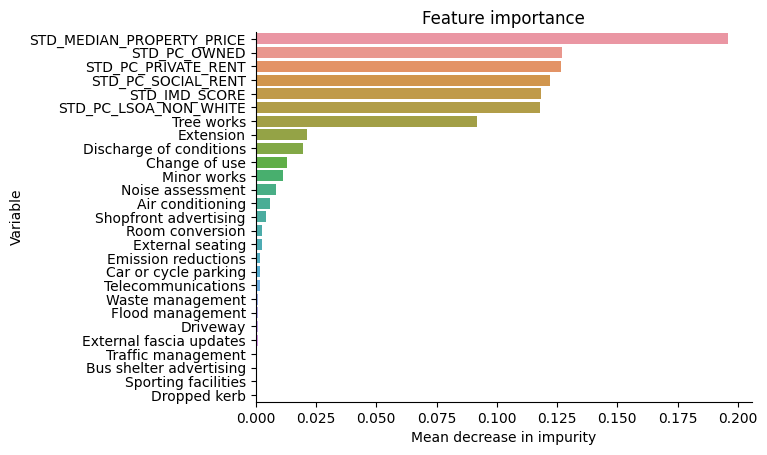

In [320]:
# Assigning the model feature names and importances to a dataframe
importance_df = pd.DataFrame({"feature_names" : rf.feature_names_in_, 
                               "importance" : rf.feature_importances_})

# Plotting the importance of each feature
fig = sns.barplot(data=importance_df.sort_values(by = 'importance', ascending = False), x="importance", y="feature_names")

# Styling the plot and adding axis labels
fig.set_title("Feature importance", fontsize = 12)
fig.set_xlabel('Mean decrease in impurity', fontsize = 10)
fig.set_ylabel('Variable', fontsize = 10)

sns.despine()

The _mean decrease in impurity_ of a variable represents the number of times a feature is used to split a node in a decision tree weighted by the subsequent number of samples that it splits at each node (Scornet, 2023), and is used as a metric for Random Forest feature importance. We can see that of the variables, the median property price in an LSOA is the most important feature in the prediction of an application, followed by the remaining geodemographic variables. The topic of an application seems to have less importance in the prediction, with tree works being the most important with a mean decrease in impurity of around 0.08. Other topics such as 'dropped_kerb' seemingly have a negligible importance in the prediction.

While the Random Forest is useful to understand the features important to predicting the outcome of a planning application, it does not tell us the effect of each factor on the odds of an outcome being successful, which is the ultimate aim of this project. To understand these odds, we can use Binary Logistic Regression. We can do this in the knowledge that the Logistic Regression performed relatively well in the previous Stratified Cross Validation in Section 5.4.2, and we can use the features identified as important in the Random Forest model as the predictor variables in the Binary Logistic Regression model.

#### 5.4.4. Binary Logistic Regression

First, the column names must be standardised and stripped of whitespace.

In [321]:
# Standardising the column names
classification.columns = classification.columns.str.replace('%','')
classification.columns = classification.columns.str.replace(' ','_')
classification.columns = classification.columns.str.strip()

Next, the model can be run on the oversampled training data using the 15 variables of the highest feature importance score in the Random Forest as inputs. If using categorical data, logistic regression requires one category to be withheld to act as a benchmark for the other categories. For instance, as we are including the housing tenure type as a predictor variable, one tenure type must be removed so as to compare the odds of the other tenure types against. The same is true for the application topics variables. As such, the 'extension' application topic category and the proportion of homes that are owned outright category are removed, both because they are the largest of their respective groups and so provide a good benchmark for comparison. This leaves 13 predictor variables.

In [322]:
# Assigning the variables to be used
X = classification[['STD_MEDIAN_PROPERTY_PRICE','STD_PC_PRIVATE_RENT', 'STD_PC_SOCIAL_RENT', 'STD_PC_LSOA_NON_WHITE',
                    'STD_IMD_SCORE','Tree_works', 'Discharge_of_conditions', 'Change_of_use', 'Minor_works', 'Noise_assessment', 
                    'Air_conditioning','Shopfront_advertising', 'Room_conversion']]
y = classification['BINARY_OUTCOME']

# Splitting the dataset into test and train
x_train, x_val, y_train, y_val = train_test_split(X, y, test_size = .1,random_state=42)

# Resampling the data to address the imbalance between successful and non-successful outcomes
smote = SMOTE(random_state=42, sampling_strategy = 1.0)
x_train_res, y_train_res = smote.fit_resample(x_train, y_train)
   
# Running the model
train = sm.Logit(y_train_res, x_train_res).fit()

# Viewing the summary of the model
print(train.summary())

Optimization terminated successfully.
         Current function value: 0.657421
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:         BINARY_OUTCOME   No. Observations:                40066
Model:                          Logit   Df Residuals:                    40053
Method:                           MLE   Df Model:                           12
Date:                Thu, 24 Aug 2023   Pseudo R-squ.:                 0.05154
Time:                        09:43:13   Log-Likelihood:                -26340.
converged:                       True   LL-Null:                       -27772.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
STD_MEDIAN_PROPERTY_PRICE     0.1338      0.009     14.132      0.000       0.

Above, we can see that each of the predictor variables has a statistically significant association with the outcome of a planning application (p<0.05). We can now run the model with the unseen test data to evaluate the model performance.

In [323]:
# Fitting the model with the test data
yhat = train.predict(x_val)
prediction = list(map(round, yhat))

# Assessing the peformance of the model
    # Confusion matrix
cm = confusion_matrix(y_val, prediction) 
print ("Confusion Matrix : \n", cm)
  
    # Peformance scores
print('Accuracy:', accuracy_score(y_val, prediction))
print('Precision:', precision_score(y_val, prediction))
print('Recall:', recall_score(y_val, prediction))
print('F1:', f1_score(y_val, prediction))

Confusion Matrix : 
 [[ 220  164]
 [ 979 1237]]
Accuracy: 0.5603846153846154
Precision: 0.8829407566024269
Recall: 0.5582129963898917
F1: 0.6839922587779929


In comparison to the model evaluation metrics in Section 5.4.2, the overall F1 score of this logistic regression has increased from 64% to 68%, indicating a better model fit. This is because the recall ability of the model has improved by approximately 6% upon the previous model, but the precision of the model has decreased by only around 2% upon the previous model. These effects are likely due to the inclusion of only important features. With this we can be confident that in 68% of cases the model predicts the correct application outcome. Though not an outstanding performance, it is likely to be the maximum we can achieve without the inclusion of further input variables, indicating that other factors are influential in the outcome of a planning application.

Now, we can use the model coefficients to calculate odds ratios for each predictor variable. This will identify the effect each predictor variable has on the odds of a successful application.

In [324]:
# Assigning the model metrics to a dataframe
odds_ratios = pd.DataFrame({"OR": train.params, "LOWER CI": train.conf_int()[0], "UPPER CI": train.conf_int()[1]})

# Calculating the odds ratios
odds_ratios = np.exp(odds_ratios)

# Resetting the index
odds_ratios = odds_ratios.reset_index()

# Sorting the dataframe in ascending order
odds_ratios = odds_ratios.sort_values(by = "OR")

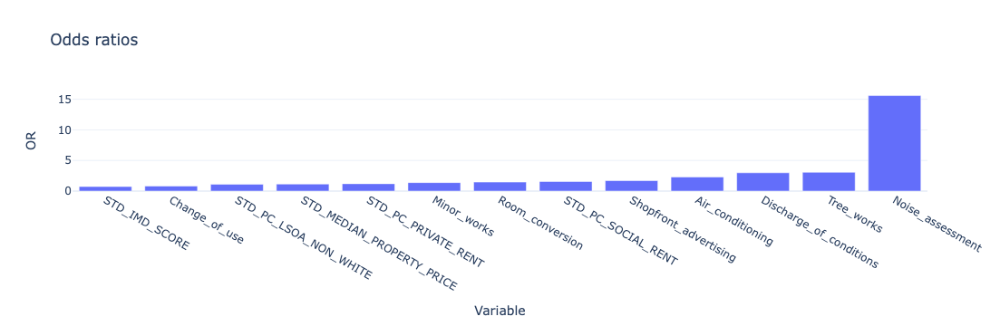

In [325]:
# Visualising the odds ratios
import plotly.express as px

fig = px.bar(odds_ratios, x = "index", y = "OR", title = "Odds ratios", labels = {"index": "Variable"})
fig.show('jupyterlab')

Above, we can see how each predictor variable affects the odds of a sucessful planning application outcome. For instance, an application related to a noise assessment is 15 times more likely to be successful than an application for an extension, whilst a one-unit increase in the proportion of housing of socially rented tenure type in an LSOA increases the odds of a successful planning application in that LSOA by 1.6. IMD score has the lowest odds ratio, with a one-unit increase in the IMD score of an LSOA increasing the odds of a successful planning application by only 0.7.

Thus, this project has identified systematic spatial variability in the number and success rate of planning applications in London LSOA. It has also found statistically significant associations between both the number and success rate of planning applications in an LSOA and various geodemographic characteristics, suggesting that the planning system has the capacity to perpetuate urban challenges. Moreover, the types of planning applications in LSOA and planning authorities are visualised, giving insights that have potential commercial applications. Finally, the application-specific and geodemographic factors that increase the odds of a successful application are identified. These insights will be fully discussed and evaluated in the briefing.

### 6. References

Boban, I., Doko, A., and Gotovac, S. 2020. Sentence retrieval using stemming and lemmatization with different length of the queries. _Advances in Science, Technology and Engineering_. **5**(3), pp.349-354.

Breiman, L. 2001. Random Forests. _Machine Learning_. **45**(1), pp.5-32.

Cervantes, J., Garcia-Lamont, F., Rodríguez-Mazahua, L. and Lopez, A. 2020. A comprehensive survey on support vector machine classification: Applications, challenges and trends. _Neurocomputing_. **408**, pp.189-215.

Dou, J., Yunus, A.P., Bui, D.T., Merghadi, A., Sahana, M., Zhu, Z., Chen, C.W., Khosravi, K., Yang, Y. and Pham, B.T. 2019. Assessment of advanced random forest and decision tree algorithms for modelling rainfall-induced landslide susceptibility in the Izu-Oshima Volcanic Island, Japan. _Science of the Total Environment_. **662**, pp.332-346.

Egger, R. and Yu, J. 2022. A topic modelling comparison between lda, nmf, top2vec, and bertopic to demystify twitter posts. _Frontiers in Sociology_. **7**, article no: 886498.

Greene, D., O'Callaghan, D., and Cunningham, P. 2014. How many topics? Stability Analysis for Topic Models. _Machine Learning and Knowledge Discovery in Databases_. pp.498-513.

Grootendorst, M. 2022. BERTopic: Neural topic modeling with a class-based TF-IDF procedure. [no pagination].

Kherwa, P., and Bansal, P. 2019. Topic Modelling: A Comprehensive Review. _EAI Endorsed Transactions on Scalable Information Systems_. **20**(24). [no pagination]

Kingsford, C. and Salzberg, S.L. 2008. What are decision Brees? _Nature Biotechnology_. **26**(9), pp.1011-1013.

Noble, W.S. 2006. What is a support vector Bachine? _Nature Biotechnology_. **24**(12), pp.1565-1567.

Ramage, D., Hall, D., Nallapati, R. and Manning, C.D. 2009. _Labelled LDA: A supervised topic model for credit attribution in multi-labelled corpora._ [Online]. [Accessed 10 August 2023]. Available from: https://aclanthology.org/D09-1026.pdf

Roberts, D.R., Bahn, V., Ciuti, S., Boyce, M.S., Elith, J., Guillera‐Arroita, G., Hauenstein, S., Lahoz‐Monfort, J.J., Schröder, B., Thuiller, W. and Warton, D.I. 2017. Cross‐validation strategies for data with temporal, spatial, hierarchical, or phylogenetic structure. _Ecography_. **40**(8), pp.913-929.

Santos, M.S., Soares, J.P., Abreu, P.H., Araujo, H. and Santos, J. 2018. Cross-validation for imbalanced datasets: Avoiding overoptimistic and overfitting approaches. _IEEE Computational Intelligence Magazine_. **13**(4), pp.59-76.

Singh, G. and Panda, R.K. 2011. Daily sediment yield modelling with artificial neural network using 10-fold cross validation method: a small agricultural watershed, Kapgari, India. _International Journal of Earth Science_. **4**(6), pp.443-450.

Touimi, Y.B., Hadioui, A., El Faddouli, N. and Bennani, S. 2020. Intelligent chatbot-LDA recommender system. _International Journal of Emerging Technologies in Learning (iJET)_. **15**(20), pp.4-20.

Webb, G.I., Keogh, E. and Miikkulainen, R. 2010. NaMve BayeL. _Encyclopaedia of Machine Learning_. **15**(1), pp.713-714.

Wong, T.T. and Yeh, P.Y. 2019. Reliable accuracy estimates from k-fold cross validation. _IEEE Transactions on Knowledge and Data Engineering_. **32**(8), pp.1586-1594.

Zhang, H., Yang, S., Guo, L., Zhao, Y., Shao, F. and Chen, F. 2015. Comparisons of isomiR patterns and classification performance using the rank-based MANOVA and 10-fold cross-valdation. _Gene_. **569**(1), pp.21-26.
